<p style="font-size:36px;text-align:center"> <b>Personalized cancer diagnosis</b> </p>

# Table of contents

1. Problem Formulation
2. Import Libraries and Data
3. Dataset Analysis
4. Data Preprocessing
    - Handling Missing Values
    - Text Pre-processing - Cleaning Redundant Data
    - Featurization:
        - Response Coding
        - BOW 1-gram
        - TF-IDF 1-gram
        - TF-IDF 2-gram
5. Exploratory Data Analysis
6. Data Preparation and Defining methods for modelling and evaluation
    - Stacking Features
7. Model Building and Evaluation using statistical models
   - 7.1. Random Model
   - 7.2 Naive Bayes
   - 7.3 KNN
   - 7.4 Logistic Regression
   - 7.5 Linear SVM
   - 7.6 Random Forest
   - 7.7 Stacking Classifier
   - 7.8 Voting Classifier
8. Summarizing Modelling Results 
    - Selecting the Best Model
9. Interpreting Model Results using LIME
10. Conclusion

# 1. Problem Formulation

#### **1.1 Problem Statement:-** 
- Classify the given genetic variations/mutations based on evidence from text-based clinical literature.

**Source:-**

https://www.kaggle.com/c/msk-redefining-cancer-treatment/ 
            
https://www.kaggle.com/c/msk-redefining-cancer-treatment/discussion/35336#198462 

#### **1.2 Objective:-**  
- Predict the probability of each data-point belonging to each of the nine classes.

#### **1.3 Constraints:-**

* **Errors can be very costly** :- Missclassification may lead to ill treatment or possibly death in this case.
* **Interpretability is important** :- Since it is a question of life and death, we need to be able to justify why a particular classification is done.
* **Probability of a data-point belonging to each class is needed** :- We can only be more sure about the diagnosis based on the actual probability values rahter than simply predicting the class labels.
* **No low-latency requirement** :- Unlike web applications, no hard and fast constraints for processing time.

#### **1.4 Type of Problem:-**
- There are nine different classes a genetic mutation can be classified into => **Multi class classification problem**

#### **1.5 Performance Metric:-**
- Source: https://www.kaggle.com/c/msk-redefining-cancer-treatment#evaluation

- Metrics: 
    * Confusion matrix 
    * Multi class log-loss 

# 2. Import Libraries and Data

In [1]:
# Basic Libraries

import numpy as np
import pandas as pd
import re
import string
import random
import math
import time
import os
import itertools
import collections
from collections import Counter, defaultdict
import nltk
import spacy
from tqdm import tqdm
import io


# Visualization

import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
plt.style.use("seaborn-dark")

import seaborn as sns
#sns.set_style('whitegrid')
sns.set_style('darkgrid')

from plotly import tools
import plotly.express as px
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go


# Preprocessing

# #from sklearn.decomposition import TruncatedSVD
# #from sklearn.decomposition import PCA
# #from sklearn.manifold import TSNE

from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.pipeline import Pipeline
import category_encoders as ce
from sklearn.preprocessing import normalize

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

#from nltk.corpus import stopwords
#stop_words = set(stopwords.words('english'))

from nltk.stem import WordNetLemmatizer

from spacy.lang.en.stop_words import STOP_WORDS
STOP_WORDS = list(set(STOP_WORDS))

nlp_spcy = spacy.load("en_core_web_sm", disable=["tagger", "parser","ner"])

from scipy.sparse import hstack

from bs4 import BeautifulSoup

#from nltk import word_tokenize
#from nltk.probability import FreqDist

#import multiprocessing as mp
#pool = mp.Pool(mp.cpu_count())

from sklearn import pipeline

# Models

from sklearn.linear_model import SGDClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import NearestNeighbors
from sklearn.ensemble import RandomForestClassifier
from mlxtend.classifier import StackingClassifier
from sklearn.ensemble import VotingClassifier


# Evaluation

from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
from sklearn.metrics import  accuracy_score, log_loss, roc_auc_score, roc_curve


import lime
from lime import lime_text
from lime.lime_text import LimeTextExplainer


# Model Serialization

import pickle
import joblib


#import statsmodels

import warnings
warnings.filterwarnings("ignore")

#### 2.1 Reading Gene and Variation Data

In [2]:
data_var = pd.read_csv('training/training_variants')

In [3]:
print('Shape of training_variants data: ', data_var.shape)
data_var.head()

Shape of training_variants data:  (3321, 4)


,ID,Gene,Variation,Class
0,0,FAM58A,Truncating Mutations,1
1,1,CBL,W802*,2
2,2,CBL,Q249E,2
3,3,CBL,N454D,3
4,4,CBL,L399V,4


#### 2.2 Reading the Text Data

In [4]:
# the seprator in this file is ||, so providing the sep and names explicitly.
data_text = pd.read_csv("training/training_text",sep="\|\|",engine="python",names=["ID","TEXT"],skiprows=1)

In [5]:
print('Shape of training_text data: ', data_text.shape)
data_text.head()

Shape of training_text data:  (3321, 2)


,ID,TEXT
0,0,Cyclin-dependent kinases (CDKs) regulate a var...
1,1,Abstract Background Non-small cell lung canc...
2,2,Abstract Background Non-small cell lung canc...
3,3,Recent evidence has demonstrated that acquired...
4,4,Oncogenic mutations in the monomeric Casitas B...


#### 2.3 Data Description

- **Source**: https://www.kaggle.com/c/msk-redefining-cancer-treatment/data
- Two data files: one contains the information about the genetic mutations and the other contains the clinical evidence (text) that human experts/pathologists use to classify the genetic mutations. 
- Both these data files are have a common column called ID
- <p> 
    Data file's information:
    <ul> 
        <li>
        training_variants (ID , Gene, Variations, Class)
        </li>
        <li>
        training_text (ID, Text)
        </li>
    </ul>
</p>

Fields in **training_variants** are 
    <ul>
        <li><b>ID : </b>the id of the row used to link the mutation to the clinical evidence</li>
        <li><b>Gene : </b>the gene where this genetic mutation is located </li>
        <li><b>Variation : </b>the aminoacid change for this mutations </li>
        <li><b>Class :</b> 1-9 the class this genetic mutation has been classified on</li>
    </ul>
    
Fields in **training_text** are 
    <ul>
        <li><b>ID : </b>the id of the row used to link the mutation to the clinical evidence</li>
        <li><b>TEXT : </b>clinical trials text/evidences related the genetic mutation identified by ID</li>
    </ul>

# 3. Dataset Analysis

#### 3.1 Data Features

In [6]:
print("No. of features in the training_variants dataset :", len(data_var.columns), end ="\n\n")
print("Feature Names: ", data_var.columns.values)

No. of features in the training_variants dataset : 4

Feature Names:  ['ID' 'Gene' 'Variation' 'Class']


In [7]:
print("No. of features in the training_text dataset :", len(data_text.columns), end ="\n\n")
print("Feature Names: ", data_text.columns.values)

No. of features in the training_text dataset : 2

Feature Names:  ['ID' 'TEXT']


#### 3.2 Merge the gene-variation and evidence data into a single dataframe

In [8]:
merge_data = pd.merge(data_var, data_text,on='ID', how='left')
merge_data.head()

,ID,Gene,Variation,Class,TEXT
0,0,FAM58A,Truncating Mutations,1,Cyclin-dependent kinases (CDKs) regulate a var...
1,1,CBL,W802*,2,Abstract Background Non-small cell lung canc...
2,2,CBL,Q249E,2,Abstract Background Non-small cell lung canc...
3,3,CBL,N454D,3,Recent evidence has demonstrated that acquired...
4,4,CBL,L399V,4,Oncogenic mutations in the monomeric Casitas B...


#### 3.3 Check for missing values in the merged data

In [9]:
merge_data.isna().sum()

ID           0
Gene         0
Variation    0
Class        0
TEXT         5
dtype: int64

In [10]:
merge_data[merge_data.isna().any(axis=1)]

,ID,Gene,Variation,Class,TEXT
1109,1109,FANCA,S1088F,1,NaN
1277,1277,ARID5B,Truncating Mutations,1,NaN
1407,1407,FGFR3,K508M,6,NaN
1639,1639,FLT1,Amplification,6,NaN
2755,2755,BRAF,G596C,7,NaN


#### Observations:

- Since there only 5 missing values those are present with in the 'TEXT' feature (which actually contains clinical evidences literature) for the associated unique combination of the Gene-Variation, we will replace these missing values using a combination of Gene-Variations text. We will perform the missing value imputation during data pre-processing stage.

#### 3.4  Check the Datatypes of Features

In [11]:
#check the data types of features
merge_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3321 entries, 0 to 3320
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   ID         3321 non-null   int64 
 1   Gene       3321 non-null   object
 2   Variation  3321 non-null   object
 3   Class      3321 non-null   int64 
 4   TEXT       3316 non-null   object
dtypes: int64(2), object(3)
memory usage: 155.7+ KB


In [12]:
# number of unique values in each feature
merge_data.nunique(axis=0)

ID           3321
Gene          264
Variation    2996
Class           9
TEXT         1920
dtype: int64

#### Observations:

- 'Gene' and 'Variation' which are 'object' types are inherently categorical features.
- The 'TEXT' feature is also 'object' type by default but it actually contains the text about the different clinical evidences and medical literature for the variety of cancer types.
- 'Class' is a target feature which contains 9 different categories from 1 to 9.
- 'ID' is merely a simple row id for the associating the gene-variation to clinical evidence.

#### 3.5 Check the basic stats of the data

In [13]:
merge_data.describe(include='all')

,ID,Gene,Variation,Class,TEXT
count,3321.000000,3321,3321,3321.000000,3316
unique,NaN,264,2996,NaN,1920
top,NaN,BRCA1,Truncating Mutations,NaN,The PTEN (phosphatase and tensin homolog) phos...
freq,NaN,264,93,NaN,53
mean,1660.000000,NaN,NaN,4.365854,NaN
std,958.834449,NaN,NaN,2.309781,NaN
min,0.000000,NaN,NaN,1.000000,NaN
25%,830.000000,NaN,NaN,2.000000,NaN
50%,1660.000000,NaN,NaN,4.000000,NaN
75%,2490.000000,NaN,NaN,7.000000,NaN


#### **Observations:**

- Important features are only categorical and string types, since the numeric feture 'ID' is merely a uniqu row id.
- Only 5 **missing values** are observed with the 'TEXT' feature.
- Most common 'Gene' category is 'BRCA1' with an occurence frequency of 264 and most common 'Variation' category is 'Truncating Mutations' with an occurence frequency of 93.
- We can see there is a repeatation of some values for the clinical evidences in the 'TEXT' feature.

# 4. Data Preprocessing

#### 4.1 Get a list of actual class-labels

In [14]:
# actual class labels 
class_labels = sorted(merge_data.Class.unique())
print("class_labels :", class_labels)

class_labels : [1, 2, 3, 4, 5, 6, 7, 8, 9]


#### 4.2 Handle the missing values in the 'TEXT' feature

In [15]:
# check the missing values
merge_data.loc[merge_data.TEXT.isna()]

,ID,Gene,Variation,Class,TEXT
1109,1109,FANCA,S1088F,1,NaN
1277,1277,ARID5B,Truncating Mutations,1,NaN
1407,1407,FGFR3,K508M,6,NaN
1639,1639,FLT1,Amplification,6,NaN
2755,2755,BRAF,G596C,7,NaN


In [16]:
# replace the missing values with a combination of Gene and Variation
merge_data.loc[merge_data.TEXT.isna(),'TEXT'] = merge_data['Gene'].str.cat(merge_data['Variation'], sep =" ")

In [17]:
#verify the data post missing values imputation
merge_data.iloc[[1109,1277,1407,1639,2755]]

,ID,Gene,Variation,Class,TEXT
1109,1109,FANCA,S1088F,1,FANCA S1088F
1277,1277,ARID5B,Truncating Mutations,1,ARID5B Truncating Mutations
1407,1407,FGFR3,K508M,6,FGFR3 K508M
1639,1639,FLT1,Amplification,6,FLT1 Amplification
2755,2755,BRAF,G596C,7,BRAF G596C


#### 4.3 Check and Replace the whitespaces in 'Gene' and 'Variation' features with 'underscores (_)'

In [18]:
#check for white spaces in Gene
merge_data[merge_data.Gene.str.contains("\s+", regex = True)]

,ID,Gene,Variation,Class,TEXT


- No white spaces in 'Gene' feature.

In [19]:
#check for white spaces in Variation
merge_data[merge_data.Variation.str.contains("\s+", regex = True)]

,ID,Gene,Variation,Class,TEXT
0,0,FAM58A,Truncating Mutations,1,Cyclin-dependent kinases (CDKs) regulate a var...
16,16,CBL,Truncating Mutations,1,To determine if residual cylindrical refractiv...
31,31,TERT,Promoter Mutations,7,Sequencing studies have identified many recurr...
41,41,DICER1,Truncating Mutations,1,Mesenchymal cell populations contribute to mic...
48,48,PTPRT,Promoter Hypermethylation,4,Metastasis is the leading cause of death for g...
...,...,...,...,...,...
3284,3284,RET,KIF5B-RET Fusion,7,"A considerable proportion of LADCs, the most c..."
3307,3307,RUNX1,Truncating Mutations,1,The RUNX genes have come to prominence recentl...
3311,3311,RUNX1,RUNX1-EVI1 Fusion,4,The AML1/EVI-1 chimeric gene is generated by t...
3312,3312,RUNX1,TEL-RUNX1 Fusion,4,Balanced chromosomal translocations are freque...


In [20]:
for feature in ['Gene','Variation']:
    if (merge_data[feature].str.contains("\s+", regex = True).any() == True):
        merge_data.loc[merge_data[feature].str.contains("\s+", regex = True), feature] = merge_data[feature].str.replace('\s+', '_')

In [21]:
# verify the 'Variation' data for whitespaces
merge_data.iloc[[0,16,31,41,48,3315]]

,ID,Gene,Variation,Class,TEXT
0,0,FAM58A,Truncating_Mutations,1,Cyclin-dependent kinases (CDKs) regulate a var...
16,16,CBL,Truncating_Mutations,1,To determine if residual cylindrical refractiv...
31,31,TERT,Promoter_Mutations,7,Sequencing studies have identified many recurr...
41,41,DICER1,Truncating_Mutations,1,Mesenchymal cell populations contribute to mic...
48,48,PTPRT,Promoter_Hypermethylation,4,Metastasis is the leading cause of death for g...
3315,3315,RUNX1,RUNX1-RUNX1T1_Fusion,4,The RUNX gene family includes three evolutiona...


#### 4.4 Closer look at the 'TEXT' Feature

In [22]:
#check if the 'TEXT' feature contains url's
merge_data[merge_data.TEXT.str.contains("http\S+|www\.\S+", regex = True)]

,ID,Gene,Variation,Class,TEXT
1,1,CBL,W802*,2,Abstract Background Non-small cell lung canc...
2,2,CBL,Q249E,2,Abstract Background Non-small cell lung canc...
7,7,CBL,Deletion,1,CBL is a negative regulator of activated recep...
11,11,CBL,K382E,4,Noonan syndrome is an autosomal dominant conge...
12,12,CBL,R420Q,4,Noonan syndrome is an autosomal dominant conge...
...,...,...,...,...,...
3302,3302,RUNX1,R166Q,4,Familial platelet disorder with predisposition...
3304,3304,RUNX1,R201Q,4,Familial platelet disorder with predisposition...
3307,3307,RUNX1,Truncating_Mutations,1,The RUNX genes have come to prominence recentl...
3310,3310,RUNX1,Amplification,7,RUNX proteins belong to a family of metazoan t...


- 'TEXT' feature contains url's, we will clean these in the pre-processing step

In [23]:
# check the 'TEXT' data thouroughly
pd.DataFrame(merge_data['TEXT'].value_counts())

TEXT
The PTEN (phosphatase and tensin homolog) phosp...    53
Mutation screening of the breast and ovarian ca...    47
Mutations in BRCA1 and BRCA2 account for the ma...    42
Genetic screening of the breast and ovarian can...    31
Tuberous sclerosis complex (TSC) is an autosoma...    30
...                                                  ...
The tumor suppressor p53 has defined roles in v...     1
Activating mutations in the tyrosine kinase dom...     1
Monoallelic point mutations in cytosolic isocit...     1
In order to assess whether variations affecting...     1
BACKGROUND: Point mutations in the tumor suppre...     1

[1925 rows x 1 columns]

#### 4.5 NLP Text Preprocessing -- Cleaning Redundant Data

- We can see that the 'TEXT' feature contains a lot of redundant entities like punctuations, white spaces, url, htlml tags,etc.
- We can also see presence of some redundant terms like ('fig', 'figure','table') and some reference numbers like (1), etc.
- We will need to clean all such data before we proceed with the word embedding and vector transformations. 

Removing below will sufficiently clean the text and will remove redundancies.

1. Expanding Abbreviations
2. URLs
3. HTML codes
4. Punctuations
5. Numeric characters
6. Single characters
7. Unwanted white spaces
8. Stopwords
9. Lemmatization

In [24]:
print("Total count of standard stop words list from SpaCy :",len(STOP_WORDS))
print("\nStandard stop words list from SpaCy :\n", STOP_WORDS)

Total count of standard stop words list from SpaCy : 326

Standard stop words list from SpaCy :
 ['four', 'whose', 'somewhere', 'therefore', 'all', 'did', 'ever', 'everywhere', 'them', 'unless', 'fifty', '’ve', 'other', 'full', 'yourselves', 'name', 'behind', 'used', 'around', 'together', 'its', 'seems', 'same', 'his', 'third', 'down', 'will', 'never', 'last', 'put', 'back', 'really', 'had', 'towards', 'whereupon', 'always', 'afterwards', 'not', 'either', 'ourselves', 'formerly', "'re", 'quite', 'yours', 'once', 'already', 'regarding', 'themselves', 'although', 'into', 'just', 'become', 'former', 'have', 'sixty', 'move', 'amount', 'toward', 'via', 'get', 'within', '‘d', 'bottom', 'must', 'also', 'but', 'every', 'anyone', 'thus', 'seemed', 'may', 'their', 'next', 'be', 'enough', 'various', 'until', 'several', 'seeming', 'hundred', 'than', 'with', 'well', 'is', 'per', '‘m', 'n’t', 'again', 'elsewhere', 'onto', 'except', 'twelve', 'sometimes', 'made', "'ll", 'nor', 'make', 'an', '’s', 'ca

In [25]:
# append redundant words like 'fig', 'figure' and 'table' to the stopwords list
STOP_WORDS = STOP_WORDS + ['fig','figure','table']
print(STOP_WORDS)

['four', 'whose', 'somewhere', 'therefore', 'all', 'did', 'ever', 'everywhere', 'them', 'unless', 'fifty', '’ve', 'other', 'full', 'yourselves', 'name', 'behind', 'used', 'around', 'together', 'its', 'seems', 'same', 'his', 'third', 'down', 'will', 'never', 'last', 'put', 'back', 'really', 'had', 'towards', 'whereupon', 'always', 'afterwards', 'not', 'either', 'ourselves', 'formerly', "'re", 'quite', 'yours', 'once', 'already', 'regarding', 'themselves', 'although', 'into', 'just', 'become', 'former', 'have', 'sixty', 'move', 'amount', 'toward', 'via', 'get', 'within', '‘d', 'bottom', 'must', 'also', 'but', 'every', 'anyone', 'thus', 'seemed', 'may', 'their', 'next', 'be', 'enough', 'various', 'until', 'several', 'seeming', 'hundred', 'than', 'with', 'well', 'is', 'per', '‘m', 'n’t', 'again', 'elsewhere', 'onto', 'except', 'twelve', 'sometimes', 'made', "'ll", 'nor', 'make', 'an', '’s', 'cannot', 'hereafter', 're', 'someone', 'below', 'herein', 'nevertheless', 'done', 'hers', 'since', 

In [26]:
# Creating a sigle Generic Class for text cleaning.

class PreprocessText:
    
    #cleaning abbreviated words
    @staticmethod
    def remove_contractions(data):
        data = re.sub(r"he's", "he is", data)
        data = re.sub(r"there's", "there is", data)
        data = re.sub(r"We're", "We are", data)
        data = re.sub(r"That's", "That is", data)
        data = re.sub(r"won't", "will not", data)
        data = re.sub(r"they're", "they are", data)
        data = re.sub(r"Can't", "Cannot", data)
        data = re.sub(r"wasn't", "was not", data)
        data = re.sub(r"don\x89Ûªt", "do not", data)
        data= re.sub(r"aren't", "are not", data)
        data = re.sub(r"isn't", "is not", data)
        data = re.sub(r"What's", "What is", data)
        data = re.sub(r"haven't", "have not", data)
        data = re.sub(r"hasn't", "has not", data)
        data = re.sub(r"There's", "There is", data)
        data = re.sub(r"He's", "He is", data)
        data = re.sub(r"It's", "It is", data)
        data = re.sub(r"You're", "You are", data)
        data = re.sub(r"I'M", "I am", data)
        data = re.sub(r"shouldn't", "should not", data)
        data = re.sub(r"wouldn't", "would not", data)
        data = re.sub(r"i'm", "I am", data)
        data = re.sub(r"I\x89Ûªm", "I am", data)
        data = re.sub(r"I'm", "I am", data)
        data = re.sub(r"Isn't", "is not", data)
        data = re.sub(r"Here's", "Here is", data)
        data = re.sub(r"you've", "you have", data)
        data = re.sub(r"you\x89Ûªve", "you have", data)
        data = re.sub(r"we're", "we are", data)
        data = re.sub(r"what's", "what is", data)
        data = re.sub(r"couldn't", "could not", data)
        data = re.sub(r"we've", "we have", data)
        data = re.sub(r"it\x89Ûªs", "it is", data)
        data = re.sub(r"doesn\x89Ûªt", "does not", data)
        data = re.sub(r"It\x89Ûªs", "It is", data)
        data = re.sub(r"Here\x89Ûªs", "Here is", data)
        data = re.sub(r"who's", "who is", data)
        data = re.sub(r"I\x89Ûªve", "I have", data)
        data = re.sub(r"y'all", "you all", data)
        data = re.sub(r"can\x89Ûªt", "cannot", data)
        data = re.sub(r"would've", "would have", data)
        data = re.sub(r"it'll", "it will", data)
        data = re.sub(r"we'll", "we will", data)
        data = re.sub(r"wouldn\x89Ûªt", "would not", data)
        data = re.sub(r"We've", "We have", data)
        data = re.sub(r"he'll", "he will", data)
        data = re.sub(r"Y'all", "You all", data)
        data = re.sub(r"Weren't", "Were not", data)
        data = re.sub(r"Didn't", "Did not", data)
        data = re.sub(r"they'll", "they will", data)
        data = re.sub(r"they'd", "they would", data)
        data = re.sub(r"DON'T", "DO NOT", data)
        data = re.sub(r"That\x89Ûªs", "That is", data)
        data = re.sub(r"they've", "they have", data)
        data = re.sub(r"i'd", "I would", data)
        data = re.sub(r"should've", "should have", data)
        data = re.sub(r"You\x89Ûªre", "You are", data)
        data = re.sub(r"where's", "where is", data)
        data = re.sub(r"Don\x89Ûªt", "Do not", data)
        data = re.sub(r"we'd", "we would", data)
        data = re.sub(r"i'll", "I will", data)
        data = re.sub(r"weren't", "were not", data)
        data = re.sub(r"They're", "They are", data)
        data = re.sub(r"Can\x89Ûªt", "Cannot", data)
        data = re.sub(r"you\x89Ûªll", "you will", data)
        data = re.sub(r"I\x89Ûªd", "I would", data)
        data = re.sub(r"let's", "let us", data)
        data = re.sub(r"it's", "it is", data)
        data = re.sub(r"can't", "cannot", data)
        data = re.sub(r"don't", "do not", data)
        data = re.sub(r"you're", "you are", data)
        data = re.sub(r"i've", "I have", data)
        data = re.sub(r"that's", "that is", data)
        data = re.sub(r"i'll", "I will", data)
        data = re.sub(r"doesn't", "does not",data)
        data = re.sub(r"i'd", "I would", data)
        data = re.sub(r"didn't", "did not", data)
        data = re.sub(r"ain't", "am not", data)
        data = re.sub(r"you'll", "you will", data)
        data = re.sub(r"I've", "I have", data)
        data = re.sub(r"Don't", "do not", data)
        data = re.sub(r"I'll", "I will", data)
        data = re.sub(r"I'd", "I would", data)
        data = re.sub(r"Let's", "Let us", data)
        data = re.sub(r"you'd", "You would", data)
        data = re.sub(r"It's", "It is", data)
        data = re.sub(r"Ain't", "am not", data)
        data = re.sub(r"Haven't", "Have not", data)
        data = re.sub(r"Could've", "Could have", data)
        data = re.sub(r"youve", "you have", data)  
        data = re.sub(r"donå«t", "do not", data)
        
        return data
    
    
    #cleaning Urls
    @staticmethod
    def remove_urls(data):
        clean_url_regex = re.compile(r"http\S+|www\.\S+")
        data = clean_url_regex.sub(r"", data)
        return data
    
    
    #cleaning HTML tags
    @staticmethod
    def remove_HTML_tags(data):
        soup = BeautifulSoup(data, 'lxml') 
        return soup.get_text()
        

    #cleaning punctuations
    @staticmethod
    def remove_punctuations(data):
        
        clean_punct_regex = re.compile(r"[^\w\s\d]+")
        data = clean_punct_regex.sub(r" ", data)
                        
        #credits - https://stackoverflow.com/questions/265960/best-way-to-strip-punctuation-from-a-string
        #data = data.translate(str.maketrans('', '', string.punctuation))
                
        return data
      
    
    #cleaning single characters/letters
    @staticmethod
    def remove_single_chars(data):
        #credits - https://stackoverflow.com/questions/42066352/python-regex-to-replace-all-single-word-characters-in-string
        clean_single_len_regex = re.compile(r"\b[a-zA-Z]\b")
        data = clean_single_len_regex.sub(r"", data)
        return data
    
    
    #cleaning only numeric characters
    @staticmethod
    def remove_numerics(data):
        
        #clean_alphanum_regex = re.compile(r"\S*\d\S*")
        #data = clean_alphanum_regex.sub(r"", data)
        
        # using translate and digits to remove only numeric digits from alphanumeric string
        #remove_digits = str.maketrans('', '', digits)
        #data = data.translate(str.maketrans('', '', string.digits))
        
        #clean only numeric characters
        clean_num_regex = re.compile(r"\b[0-9]+\b")
        data = clean_num_regex.sub(r"", data)
        
        #clean 1 digit followed by 1 char
        clean_1char_1num_reg = re.compile(r"\b[0-9][a-zA-Z]\b")
        data = clean_1char_1num_reg.sub(r"", data)
        
        return data
    
    
    #cleaning unwanted whitespaces
    @staticmethod
    def remove_redundant_whiteSpaces(data):
        clean_redundant_whitespaces_regex = re.compile(r"\s\s+") #check for more consecutive spaces
        data = clean_redundant_whitespaces_regex.sub(r" ", data) #replace with single space
        return data
    
    
    #cleaning stopwords
    @staticmethod
    def remove_stopwords(data):
        data = ' '.join(word.lower() for word in data.split() if word.lower() not in STOP_WORDS)
        data = data.strip()
        return data
    
    
    #lemmatizing the text data
    @staticmethod
    def lemmatize_corpus(data):
        lemmatizer=WordNetLemmatizer() 
        out_data = ' '.join(lemmatizer.lemmatize(word) for word in data.split()) 
        #out_data = " ".join([token.lemma_ for token in nlp_spcy(data)])
        return out_data


#### 4.6 Defining methods for NLP text preprocessing

In [27]:
#text processing stage.
def NLP_Preprocessing(df,col,clean_col):
    
    df[clean_col]= df[col].apply(PreprocessText.remove_contractions)
    df[clean_col]= df[clean_col].apply(PreprocessText.remove_urls)
    df[clean_col]= df[clean_col].apply(PreprocessText.remove_HTML_tags)
    df[clean_col]= df[clean_col].apply(PreprocessText.remove_punctuations)
    df[clean_col]= df[clean_col].apply(PreprocessText.remove_single_chars)
    df[clean_col]= df[clean_col].apply(PreprocessText.remove_numerics)
    df[clean_col]= df[clean_col].apply(PreprocessText.remove_redundant_whiteSpaces)
    df[clean_col]= df[clean_col].apply(PreprocessText.remove_stopwords)
    
    return df

start_time = time.clock()
merge_data = NLP_Preprocessing(merge_data,'TEXT','CLEAN_TEXT')
print('Time required for preprocessing the text :',time.clock() - start_time, "seconds")

Time required for preprocessing the text : 233.37672799999996 seconds


#### 4.7 Lemmatization :

- Till now we have cleaned the data and removed all the redundant text from it. This reduced the dimensionality of the data to certain extent.
- Next up, we will prune some words to their roots which will again reduce the length of sentences.
- Here we are applying Lemmatization to reduce the words to their morphological roots so as to retain the semantics of the text.
- We can also apply 'Stemming' in this case, but we want to retain symantic meaning of the words, so we are not considering that approach.

In [ ]:
# takes a lot of time to lemmatize text, so not preferred, 
# could be useful with advanced computing machines with more GPU cores.

#def lemmatize_corpus_spcy(data):
#    out_data = " ".join([token.lemma_ for token in nlp_spcy(data)])
#    return out_data


#start_time = time.time()
#merge_data['TEXT_LM_SPACY'] = pool.map(lemmatize_corpus_spcy, merge_data['CLEAN_TEXT'].values)
#print('Time required for SpaCy lemmatizing  the text :',time.time() - start_time, "seconds")
#

In [28]:
start_time = time.clock()
merge_data['CLEAN_TEXT'] = merge_data['CLEAN_TEXT'].apply(PreprocessText.lemmatize_corpus)
print('Time required for lemmatizing the text :',time.clock() - start_time, "seconds")

Time required for lemmatizing the text : 119.31767470000011 seconds


In [29]:
# check the 'TEXT' data post cleanup
pd.DataFrame(merge_data['CLEAN_TEXT'].value_counts())

CLEAN_TEXT
pten phosphatase tensin homolog phosphatase uni...          53
mutation screening breast ovarian cancer predis...          47
mutation brca1 brca2 account majority hereditar...          42
genetic screening breast ovarian cancer suscept...          31
tuberous sclerosis complex tsc autosomal domina...          30
...                                                        ...
hemizygous deletion common molecular abnormalit...           1
era personalized medicine understanding molecul...           1
runx protein belong family metazoan transcripti...           1
flt3 receptor tyrosine kinase constitutively ac...           1
mutation screening breast ovarian cancer predis...           1

[1923 rows x 1 columns]

#### 4.8 Test, Train and Cross Validation Split

- First, we will create a copy of the merge_data and remove the redundant features like 'ID'.
- Splitting data into train, test and cross validation (64:20:16)
- Due to the non- temporal nature of data, i.e. there is no time stamp in this dataset, we can split the dataset randomly into three parts -  train, cross validation and test with **64%,16%, 20%** of data respectively

In [30]:
# create a copy of merge_data
df_final = merge_data.copy()

# drop the 'ID' feature from the final_df
df_final.drop(labels = ['ID'], axis=1, inplace=True)

In [31]:
y_true = df_final['Class'].values

# split the data into test and train by maintaining same distribution of output varaible 'y_true' [stratify=y_true]
X_train, test_df, y_train, y_test = train_test_split(df_final, y_true, stratify=y_true, test_size=0.2)

# split the train data into train and cross-val by maintaining same distribution of the varaible 'y_train' [stratify=y_train]
train_df, cv_df, y_train, y_cv = train_test_split(X_train, y_train, stratify=y_train, test_size=0.2)

<p> We have split the complete data into train, test and cross validation data sets, while preserving the ratio of class distribution in the original data set  </p>

In [32]:
print('Number of data points in train data:', train_df.shape[0])
print('Number of data points in test data:', test_df.shape[0])
print('Number of data points in cross validation data:', cv_df.shape[0])

Number of data points in train data: 2124
Number of data points in test data: 665
Number of data points in cross validation data: 532


#### 4.9 Featurization - Transforming categorical and textual Features

- In his section, we will featurize all the independent features in the dataset. Our dataset consist of mainly 3 independent features as follows:
<ol><li>Gene(categorical)</li><li>Variation(categorical)</li><li>TEXT(text)</li></ol>

- Below are the two ways which we can use to featurize the categorical features 
    1. Response coding : Represents a feature using number of classes in the target.
    2. One hot Encoding : Represents a features using its frequency of occurence. Creates sparsity.

- For the text based features we can use techniques like BOW, TF-IDF, W2V,etc. In this notebook we will emphasize on using **TF-IDF** approach for featurizing the **'TEXT'** feature.

- We will choose the appropriate featurization based on the ML model we use.  

- For this problem of multi-class classification with categorical features, one-hot encoding is better for Logistic regression while response coding is better for tree based models like Random Forests.

#### 4.10 Defining methods for Featurizing Categorical and Textual Features

In [45]:
# this is a class for featurizing different types features before performing statistical modelling
class Data_Featurization:
        
    @staticmethod
    def get_response_coded_feature_dict(train_df, cat_feat_name, target_feat_name, feature_value_count, alpha, target_label_iterator):
        """
        this function return a dictionary mapping for each unique category in a categorical feature
        where the key will be the category name and value will be the probability scores for that category
        
        'train_df' : dataframe on which the data will be trained.
                 
        'cat_feat_name' : name of the categorical feature for which the target encoding is being applied.
        
        'target_feat_name' : name of the target feature which is used for the target encoding.
        
        'feature_value_count' : unique features categories and their value_count in the train data.
        
        'alpha' : Laplace_smoothing parameter. Laplace_smoothing is applied handles the feature values in 
                  'test_df' dataframe which are missing in 'train_df'. For example, 
                  (numerator + 10*alpha) / (denominator + 10*alpha*num_class)
        
        'target_label_iterator': list of actual target class labels(default for binary). For multi-class, input the actual 
                                 class labels as a list. For example, for multi_class if actual class labels are numbers like (1,2,3) then iterator should be a list as [1,2,3].
        """
        
        #create a dictionary to store the probability score corresponding to each unique feature value.
        feature_dict = dict()

        # fea_count_total will contain the number of time a particular feature category (cat) occured in train data.
        for cat, cat_feat_count_total in feature_value_count.items():

            # vec will contain probability [ P(yi==k/xi==cat) ] of features belonging to a particular class 'k'. 
            # vec is a (1* class_labels) dim vector.
            vec = []

            for k in target_label_iterator:
                df_temp = train_df.loc[(train_df[target_feat_name]==k) & (train_df[cat_feat_name] == cat)]

                # df_temp.shape[0](numerator) will contain the no. of time a particular feature 
                # corrsponding to class 'k' occured in the train data.
                vec.append((df_temp.shape[0] + 10*alpha)/(cat_feat_count_total + 10*alpha*len(target_label_iterator)))

            # update the dictionary with each category of feature as key and probability scores vector as value.
            feature_dict[cat] = vec

        return feature_dict


    @staticmethod
    def get_response_coded_feature(train_df, test_df, cat_feat_name, target_feat_name, alpha = 1, target_label_iterator = [0,1]):
        """
        this function calculates the probability of a categorical feature belonging to any particular class 
        and returns the target encoded array for the categorical feature. Laplace Smoothing is applied internally. 
        
        
        'train_df' : dataframe on which the data will be trained.
        
        'test_df' : dataframe other than train for which the categorical features will be encoded. For encoding
                    training set features this parameter should be set to training dataframe name (i.e. 'train_df').
         
        'cat_feat_name' : name of the categorical feature for which the target encoding is being applied.
        
        'target_feat_name' : name of the target feature which is used for the target encoding.
        
        'alpha' : Laplace_smoothing parameter. Laplace_smoothing is applied handles the feature values in 
                  'test_df' dataframe which are missing in 'train_df'. For example, 
                  (numerator + 10*alpha) / (denominator + 10*alpha*num_class)
        
        'target_label_iterator': list of actual target class labels(default for binary = [0,1]). For multi-class, input the actual 
                                 class labels as a list. For example, for multi_class if actual class labels are numbers like (1,2,3) then iterator should be a list as [1,2,3].
        """
        
        try:
            # find the unique feature categories and their value_count in the train data.
            feature_value_count = train_df[cat_feat_name].value_counts()

            # get the probability_scores vector for each feature_name in the train dataframe.
            feature_dict_train = Data_Featurization.get_response_coded_feature_dict(train_df, cat_feat_name, target_feat_name, feature_value_count, alpha, target_label_iterator)

            # feat_response_coded_arr is an array which will hold the 'class_probability_scores' for each categorical feature name in the test_df.
            feat_response_coded_arr = []
            
            # for every feature value in the given test_df, check if it is present in the train data (train_df), if yes then 
            # append the 'class_probability_score' array corresponding to that feature_name in the feat_response_coded_arr else
            # append the laplace smoothed values ([(10*alpha)/(len(target_label_iterator)*10*alpha))]) in the feat_response_coded_arr.
            for index, row in test_df.iterrows():
                if row[cat_feat_name] in feature_value_count.keys():
                    feat_response_coded_arr.append(feature_dict_train[row[cat_feat_name]])
                else:
                    value = (10*alpha)/(10*alpha*len(target_label_iterator))
                    feat_response_coded_arr.append(list([value]*len(target_label_iterator)))
            
            return feat_response_coded_arr
                
        except:
            pass
        
    
    @staticmethod
    def extract_dictionary_paddle(df, feat_nm):
        """
        for every row in 'df' dataframe consider the 'feat_nm', split the words by space,
        make a dict with those words and increment its count whenever we see that word
        """
        dictionary = defaultdict(int)
        for index, row in df.iterrows():
            for word in row[feat_nm].split():
                dictionary[word] +=1

        return dictionary
    
    
    @staticmethod
    def get_text_classwise_dict_list(train_df,feat_nm,cat_feat_nm,class_labels):
        """
        returns a list containing no. of dictionaries, each corresponding to one class label
        """

        #dict_list contains 9 dictionaries each corresponds to a class
        dict_list = []

        for i in class_labels:
            #build a word dict based on the words in that class i.e. dict_list[i] is build on i'th class text data
            cls_text = train_df[train_df[cat_feat_nm]==i]
            #append it to dict_list.
            dict_list.append(Data_Featurization.extract_dictionary_paddle(cls_text,feat_nm))

        return dict_list
    
    
    @staticmethod
    def get_text_responsecoding(train_df,test_df,feat_nm,cat_feat_nm,class_labels,alpha=1):
        """
        returns an array of response coded vectors of dimension of equal to (num of rows in df  *  num of class label)
        """

        # returns a list of dictionaries where the keys in the dict corresponds to each class in the train data and values in the dict
        # corresponds to (word:count) mapping for each word in the classwise 'text' field
        text_classwise_dict_list = Data_Featurization.get_text_classwise_dict_list(train_df,feat_nm,cat_feat_nm,class_labels)

        # train_total_dict is buid on whole 'text' data in the train_df and it holds the occurence frequencies for each word
        # in the 'TEXT' feature in the entire train data 
        train_total_dict = Data_Featurization.extract_dictionary_paddle(train_df,feat_nm)

        # create an array of size (no. of rows of test_df, no. of class labels)
        text_feature_responseCoding = np.zeros((test_df.shape[0], len(class_labels)))

        # iterate through the test_df and generate a response_coded vector for each row
        for i in range(len(class_labels)):
            row_index = 0
            for index, row in test_df.iterrows():
                sum_prob = 0
                for word in row[feat_nm].split():
                    sum_prob += math.log(((text_classwise_dict_list[i].get(word,0)+10*alpha)/(train_total_dict.get(word,0)+10*alpha*len(class_labels))))
                text_feature_responseCoding[row_index][i] = math.exp(sum_prob/len(row[feat_nm].split()))
                row_index += 1

        # we convert each row values such that they sum to 1      
        text_feature_responseCoding = text_feature_responseCoding / text_feature_responseCoding.sum(axis=1, keepdims=True)

        return text_feature_responseCoding
    
    
    @staticmethod
    def get_OneHotCoded_features(data, ngram_range=(1, 1), min_df=1, max_features = None):
        """
        this is a method for transforming a feature into 'n-dimension' one-hot encoded vectors 
        where 'n' is the number of unique values in that feature.
        """
        
        # create one-hot vectorizer object
        count_vectorizer = CountVectorizer(stop_words=STOP_WORDS, ngram_range=ngram_range, lowercase=True, 
                                           analyzer='word', token_pattern=r'[\w\-\*\'\?\/]+',
                                           min_df=min_df, max_features=max_features, binary=False)
        
        train_countvec = count_vectorizer.fit_transform(data)
        return train_countvec, count_vectorizer, 


    @staticmethod
    def get_tfidf_features(data, ngram_range=(1, 1), min_df=1, max_features = None):
        """min_df
        this is a method for transforming a feature into 'n-dimension' Tf-Idf encoded vectors 
        where 'n' is the number of max features that we set in the tfidf vectorizer.
        """
        
        tfidf_vectorizer = TfidfVectorizer(stop_words= STOP_WORDS, ngram_range=ngram_range, lowercase=True,
                                           analyzer='word', token_pattern=r'[\w\-\*\'\?\/]+', min_df = min_df, 
                                           max_features = max_features, norm='l2', use_idf=True, smooth_idf=True, sublinear_tf=True)
        train_tfidf = tfidf_vectorizer.fit_transform(data)
        return train_tfidf, tfidf_vectorizer


# Creating an instnace of the class
Cls_Featurize = Data_Featurization

##### 'Gene' Feature Response Encoding:

- Response coding will convert the categorical 'Gene' feature into a 9 dimensional vector as we have 9 categories of output class labels.

In [117]:
# alpha is used for laplace smoothing
alpha = 1

# train 'Gene' feature response coded
train_gene_responseCoded_arr = np.array(Cls_Featurize.get_response_coded_feature(train_df, train_df, 'Gene', 'Class', alpha = 1, target_label_iterator = class_labels))
# cv 'Gene' feature response coded
cv_gene_responseCoded_arr = np.array(Cls_Featurize.get_response_coded_feature(train_df, cv_df, 'Gene', 'Class', alpha = 1, target_label_iterator = class_labels))
# test 'Gene' feature response coded
test_gene_responseCoded_arr = np.array(Cls_Featurize.get_response_coded_feature(train_df, test_df, 'Gene', 'Class', alpha = 1, target_label_iterator = class_labels))

In [118]:
train_gene_responseCoded_arr.shape

(2124, 9)

##### 'Gene' Feature OneHot Encoding:

- OneHot encoding will convert the categorical Gene feature into a 'n-dimensional' one-hot encoded vector where 'n' is the number of unique values in the Gene feature.
- we can set the number of unique words to return using the 'max_features' parameter here, if this is set to None, then all the unique words will be returned based on the 'n-gram' value.
- With this method we will encode the gene features using only 'uni-gram' approach.

In [38]:
train_gene_OneHot_arr, gene_vectorizer = Cls_Featurize.get_OneHotCoded_features(train_df['Gene'], ngram_range=(1, 1),
                                                                                min_df = 1, max_features = None)
 
# train 'Gene' feature one-hot encoded
#train_gene_OneHot_arr = normalize(train_gene_OneHot_arr, axis = 0)

# cv 'Gene' feature one-hot coded
cv_gene_OneHot_arr = gene_vectorizer.transform(cv_df['Gene'])
#cv_gene_OneHot_arr = normalize(cv_gene_OneHot_arr, axis = 0)

# test 'Gene' feature one-hot coded
test_gene_OneHot_arr = gene_vectorizer.transform(test_df['Gene'])
#test_gene_OneHot_arr = normalize(test_gene_OneHot_arr, axis = 0)

##### 'Gene' Feature TF-IDF Encoding:

- Tf-Idf encoding will convert the categorical Gene feature into a numeric encoded vectors where more importance will be given to words which are rare in the entire corpus but appear good no. of times in a single document.
- This method returns a 'n-dimensional' tf-idf encoded vector where 'n' is the number of unique values in the Gene feature, however we can set the number of unique words to return using the 'max_features' parameter here, if set to None, then all the unique words will be returned based on the 'n-gram' value.
- Since Gene is a categorical feature, we encode the gene features using only uni-gram .

In [39]:
# TF-IDF uni-gram
train_gene_tfidf_arr, gene_tfidf_vectorizer = Cls_Featurize.get_tfidf_features(train_df['Gene'], ngram_range=(1, 1),
                                                                                min_df = 1, max_features = None)
# train 'Gene' feature tf-idf encoded
#train_gene_tfidf_arr = normalize(train_gene_tfidf_arr, axis = 0)

# cv 'Gene' feature tf-idf encoded
cv_gene_tfidf_arr = gene_tfidf_vectorizer.transform(cv_df['Gene'])
#cv_gene_tfidf_arr = normalize(cv_gene_tfidf_arr, axis = 0)

# test 'Gene' feature tf-idf encoded
test_gene_tfidf_arr = gene_tfidf_vectorizer.transform(test_df['Gene'])
#test_gene_tfidf_arr = normalize(test_gene_tfidf_arr, axis = 0)

##### 'Variation' Feature Response Coding:

- Response coding will convert the categorical 'Variation' feature into a 9 dimensional vector as we have 9 categories of output class labels.

In [40]:
# alpha is used for laplace smoothing
alpha = 1

# train 'Variation' feature response coded
train_var_responseCoded_arr = np.array(Cls_Featurize.get_response_coded_feature(train_df, train_df, 'Variation', 'Class', alpha = 1, target_label_iterator = class_labels))
# cv 'Variation' feature response coded
cv_var_responseCoded_arr = np.array(Cls_Featurize.get_response_coded_feature(train_df, cv_df, 'Variation', 'Class', alpha = 1, target_label_iterator = class_labels))
# test 'Variation' feature response coded
test_var_responseCoded_arr = np.array(Cls_Featurize.get_response_coded_feature(train_df, test_df, 'Variation', 'Class', alpha = 1, target_label_iterator = class_labels))

In [114]:
train_var_responseCoded_arr.shape

(2124, 9)

##### 'Variation' Feature OneHot Coding:

- OneHot encoding will convert the categorical Variation feature into a 'n-dimensional' one-hot encoded vector where 'n' is the number of unique values in the Variation feature.
- we can set the number of unique words to return using the 'max_features' parameter here, if this is set to None, then all the unique words will be returned based on the 'n-gram' value.
- With this method we will encode the Variation features using only 'uni-gram' approach.

In [41]:
train_var_OneHot_arr, var_vectorizer = Cls_Featurize.get_OneHotCoded_features(train_df['Variation'], ngram_range=(1, 1), 
                                                                              min_df = 1, max_features = None)
 
# train 'Variation' feature one-hot encoded
#train_var_OneHot_arr = normalize(train_var_OneHot_arr, axis = 0)

# cv 'Variation' feature one-hot coded
cv_var_OneHot_arr = var_vectorizer.transform(cv_df['Variation'])
#cv_var_OneHot_arr = normalize(cv_var_OneHot_arr, axis = 0)

# test 'Variation' feature one-hot coded
test_var_OneHot_arr = var_vectorizer.transform(test_df['Variation'])
#test_var_OneHot_arr = normalize(test_var_OneHot_arr, axis = 0)

##### 'Variation' Feature TF-IDF Encoding:

- Tf-Idf encoding will convert the categorical Variation feature into a numeric encoded vectors where more importance will be given to words which are rare in the entire corpus but appear good no. of times in a single document.
- This method returns a 'n-dimensional' tf-idf encoded vector where 'n' is the number of unique values in the Variation feature, however we can set the number of unique words to return using the 'max_features' parameter here, if set to None, then all the unique words will be returned based on the 'n-gram' value.
- With this method we will encode the Variation feature using only uni-gram approach.

In [42]:
train_var_tfidf_arr, var_tfidf_vectorizer = Cls_Featurize.get_tfidf_features(train_df['Variation'], ngram_range=(1, 1), 
                                                                             min_df = 1, max_features = None)
 
# train 'Variation' feature tf-idf encoded
#train_var_tfidf_arr = normalize(train_var_tfidf_arr, axis = 0)

# cv 'Variation' feature tf-idf encoded
cv_var_tfidf_arr = var_tfidf_vectorizer.transform(cv_df['Variation'])
#cv_var_tfidf_arr = normalize(cv_var_tfidf_arr, axis = 0)

# test 'Variation' feature tf-idf encoded
test_var_tfidf_arr = var_tfidf_vectorizer.transform(test_df['Variation'])
#test_var_tfidf_arr = normalize(test_var_tfidf_arr, axis = 0)

##### 'TEXT' Feature Response coding :
- Response coding will convert the 'TEXT' feature into a 9 dimensional vector as we have 9 categories of output class labels.

In [43]:
# feat_nm = 'CLEAN_TEXT'
# cat_feat_nm = 'Class'
# class_labels = list(merge_data.Class.unique())

# alpha is used for laplace smoothing
alpha = 1

# train 'TEXT' feature response coded
train_TEXT_responseCoded_arr  = np.array(Cls_Featurize.get_text_responsecoding(train_df, train_df, 'CLEAN_TEXT', 'Class', class_labels, alpha))
# cv 'TEXT' feature response coded
cv_TEXT_responseCoded_arr  = np.array(np.array(Cls_Featurize.get_text_responsecoding(train_df, cv_df, 'CLEAN_TEXT', 'Class', class_labels, alpha)))
# test 'TEXT' feature response coded
test_TEXT_responseCoded_arr  = np.array(Cls_Featurize.get_text_responsecoding(train_df, test_df, 'CLEAN_TEXT', 'Class', class_labels, alpha))

In [115]:
train_TEXT_responseCoded_arr.shape

(2124, 9)

##### 'TEXT' Feature OneHot coding :

- OneHot encoding will convert the 'TEXT' feature into a 'n-dimensional' one-hot encoded vector where 'n' is the number of unique words in the 'TEXT' feature.
- We set the number of unique words to return using the 'max_features' parameter, here we set 'max_features' = 60000.
- With this method we will encode the 'TEXT' features using 'uni-gram' approach.
- We will set the min_df = 3, such that the terms that have a frequency strictly lower than 3 will be ignored.
- Since Count_Vectorizer produces a count frequency based sparse vector, we normalize the features as extremely high frequency counts may dominate the result and causing model bias.

In [46]:
# building a CountVectorizer with all the words that occured minimum 3 times in train data
train_TEXT_OneHot_arr, text_vectorizer = Cls_Featurize.get_OneHotCoded_features(train_df['CLEAN_TEXT'], 
                                                                                ngram_range=(1, 1), min_df = 3, 
                                                                                max_features = 60000)
# train 'TEXT' feature one-hot encoded
train_TEXT_OneHot_arr = normalize(train_TEXT_OneHot_arr, axis=0)

# cv 'TEXT' feature one-hot coded
cv_TEXT_OneHot_arr = text_vectorizer.transform(cv_df['CLEAN_TEXT'])
cv_TEXT_OneHot_arr = normalize(cv_TEXT_OneHot_arr, axis=0)

# test 'TEXT' feature one-hot coded
test_TEXT_OneHot_arr = text_vectorizer.transform(test_df['CLEAN_TEXT'])
test_TEXT_OneHot_arr = normalize(test_TEXT_OneHot_arr, axis=0)

##### 'TEXT' Feature TF-IDF coding :

- Tf-Idf encoding will convert the 'TEXT' feature into a numeric encoded vector where more importance will be given to words which are rare in the entire corpus but appear good no. of times in a single document.
- We set the number of unique words to return using the 'max_features' parameter, here we set 'max_features' = 60000.
- With this method we will encode the 'TEXT' features using both 'uni-gram' and 'bi-gram' approaches.
- We will set the min_df = 3, such that the terms that have a frequency strictly lower than 3 will be ignored.
- Normlization is internally applied in TF-IDF.

In [47]:
# 'TEXT' TF-IDF uni-gram
train_TEXT_tfidf_uni_arr, text_tfidf_uni_vectorizer = Cls_Featurize.get_tfidf_features(train_df['CLEAN_TEXT'], 
                                                                               ngram_range=(1, 1), min_df = 3, 
                                                                               max_features = 60000)
# train 'TEXT' feature tf-idf encoded
#train_TEXT_tfidf_uni_arr = normalize(train_TEXT_tfidf_uni_arr, axis = 0)

# cv 'TEXT' feature tf-idf encoded
cv_TEXT_tfidf_uni_arr = text_tfidf_uni_vectorizer.transform(cv_df['CLEAN_TEXT'])
#cv_TEXT_tfidf_uni_arr = normalize(cv_TEXT_tfidf_uni_arr, axis = 0)

# test 'TEXT' feature tf-idf encoded
test_TEXT_tfidf_uni_arr = text_tfidf_uni_vectorizer.transform(test_df['CLEAN_TEXT'])
#test_TEXT_tfidf_uni_arr = normalize(test_TEXT_tfidf_uni_arr, axis = 0)

In [85]:
# 'TEXT' TF-IDF bi-gram

train_TEXT_tfidf_bi_arr, text_tfidf_bi_vectorizer = Cls_Featurize.get_tfidf_features(train_df['CLEAN_TEXT'], 
                                                                                  ngram_range=(1, 2), min_df = 3, 
                                                                                  max_features = 70000)
# train 'TEXT' feature tf-idf encoded
#train_TEXT_tfidf_bi_arr = normalize(train_TEXT_tfidf_bi_arr, axis = 0)

# cv 'TEXT' feature tf-idf encoded
cv_TEXT_tfidf_bi_arr = text_tfidf_bi_vectorizer.transform(cv_df['CLEAN_TEXT'])
#cv_TEXT_tfidf_bi_arr = normalize(cv_TEXT_tfidf_bi_arr, axis = 0)

# test 'TEXT' feature tf-idf encoded
test_TEXT_tfidf_bi_arr = text_tfidf_bi_vectorizer.transform(test_df['CLEAN_TEXT'])
#test_TEXT_tfidf_bi_arr = normalize(test_TEXT_tfidf_bi_arr, axis = 0)

In [138]:
#text_tfidf_bi_vectorizer.get_feature_names()[69000:]
#train_TEXT_tfidf_bi_arr.toarray().tolist()[0]#

# 5. Exploratory Data Analysis

### 5.1 'Class' Feature

- Let's check the distribution of class labels in Train, Test and Cross Validation datasets.

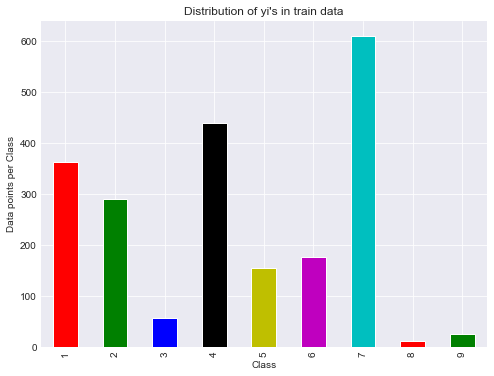

Number of data points in class 7 : 609 ( 28.672 %)
Number of data points in class 4 : 439 ( 20.669 %)
Number of data points in class 1 : 363 ( 17.09 %)
Number of data points in class 2 : 289 ( 13.606 %)
Number of data points in class 6 : 176 ( 8.286 %)
Number of data points in class 5 : 155 ( 7.298 %)
Number of data points in class 3 : 57 ( 2.684 %)
Number of data points in class 9 : 24 ( 1.13 %)
Number of data points in class 8 : 12 ( 0.565 %)


--------------------------------------------------------------------------------


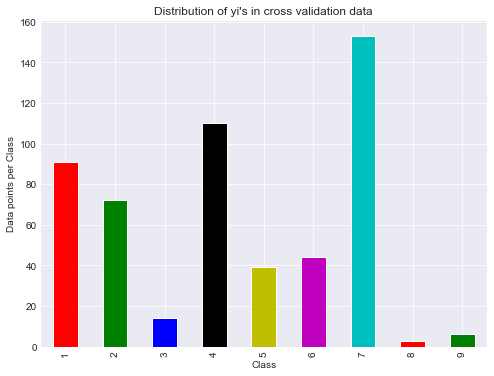

Number of data points in class 7 : 153 ( 28.759 %)
Number of data points in class 4 : 110 ( 20.677 %)
Number of data points in class 1 : 91 ( 17.105 %)
Number of data points in class 2 : 72 ( 13.534 %)
Number of data points in class 6 : 44 ( 8.271 %)
Number of data points in class 5 : 39 ( 7.331 %)
Number of data points in class 3 : 14 ( 2.632 %)
Number of data points in class 9 : 6 ( 1.128 %)
Number of data points in class 8 : 3 ( 0.564 %)


--------------------------------------------------------------------------------


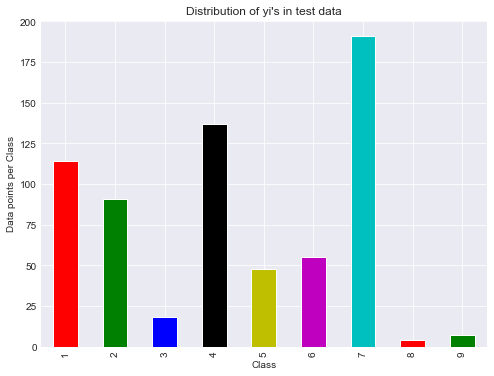

Number of data points in class 7 : 191 ( 28.722 %)
Number of data points in class 4 : 137 ( 20.602 %)
Number of data points in class 1 : 114 ( 17.143 %)
Number of data points in class 2 : 91 ( 13.684 %)
Number of data points in class 6 : 55 ( 8.271 %)
Number of data points in class 5 : 48 ( 7.218 %)
Number of data points in class 3 : 18 ( 2.707 %)
Number of data points in class 9 : 7 ( 1.053 %)
Number of data points in class 8 : 4 ( 0.602 %)


In [88]:
train_class_distribution = train_df['Class'].value_counts().sort_index()
cv_class_distribution = cv_df['Class'].value_counts().sort_index()
test_class_distribution = test_df['Class'].value_counts().sort_index()


my_colors = ['r','g','b','k','y','m','c']

plt.figure(figsize=(8,6))
train_class_distribution.plot(kind='bar',color=my_colors)
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title("Distribution of yi's in train data")
plt.grid(b=bool,which='both',axis='both',fillstyle='full')
plt.show()
                      
# -(train_class_distribution.values): the minus sign will give us the values in decreasing order
sorted_yi = np.argsort(-train_class_distribution.values)
for i in sorted_yi:
    print('Number of data points in class', i+1, ':',train_class_distribution.values[i], '(', np.round((train_class_distribution.values[i]/train_df.shape[0]*100), 3), '%)')


print("\n") 
print('--'*40)

plt.figure(figsize=(8,6))
cv_class_distribution.plot(kind='bar',color=my_colors)
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title("Distribution of yi's in cross validation data")
plt.grid(b=bool,which='both',axis='both',fillstyle='full')
plt.show()

sorted_yi = np.argsort(-cv_class_distribution.values)
for i in sorted_yi:
    print('Number of data points in class', i+1, ':',cv_class_distribution.values[i], '(', np.round((cv_class_distribution.values[i]/cv_df.shape[0]*100), 3), '%)')


print("\n") 
print('--'*40)

plt.figure(figsize=(8,6))
test_class_distribution.plot(kind='bar',color=my_colors)
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title("Distribution of yi's in test data")
plt.grid(b=bool,which='both',axis='both',fillstyle='full')
plt.show()

sorted_yi = np.argsort(-test_class_distribution.values)
for i in sorted_yi:
    print('Number of data points in class', i+1, ':',test_class_distribution.values[i], '(', np.round((test_class_distribution.values[i]/test_df.shape[0]*100), 3), '%)')


### 5.2 'Gene' Feature

Let's have a closer look at the **Gene** feature:-

1. How many categories are there in Gene feature and how are they distributed?
2. Is the Gene feature useful in predicitng y_i?
3. Test and CV coverage - Is the Gene feature stable across train, test and CV datasets? How many data points in Test and CV datasets are covered by the unique genes in train dataset?

##### Q1. How many categories are there in Gene feature and how they are distributed?
**Ans:**

In [89]:
unique_genes = train_df['Gene'].value_counts()
print('Number of Unique Genes in the train data :', unique_genes.shape[0])
# the top 10 genes that occured most
print(unique_genes.head(10))

Number of Unique Genes in the train data : 227
BRCA1     171
TP53      104
EGFR       86
PTEN       79
BRCA2      73
BRAF       65
KIT        58
ALK        47
ERBB2      45
PDGFRA     39
Name: Gene, dtype: int64


In [90]:
print("There are", unique_genes.shape[0] ,"different categories of genes in the train data, and they are distibuted as follows",)

There are 227 different categories of genes in the train data, and they are distibuted as follows


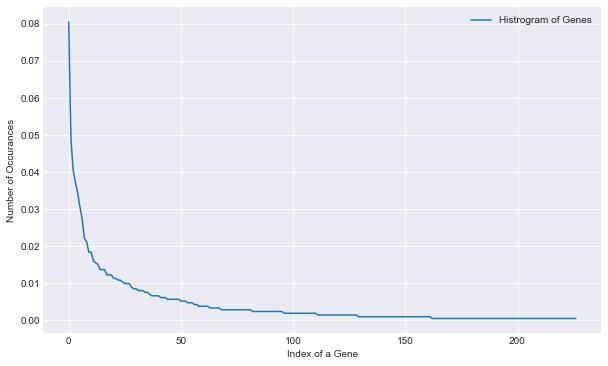

In [91]:
# Distribution of values in Gene Feature

s = sum(unique_genes.values);
h = unique_genes.values/s;
plt.figure(figsize=(10,6))
plt.plot(h, label="Histrogram of Genes")
plt.xlabel('Index of a Gene')
plt.ylabel('Number of Occurances')
plt.legend()
plt.grid(b=bool)
plt.show()

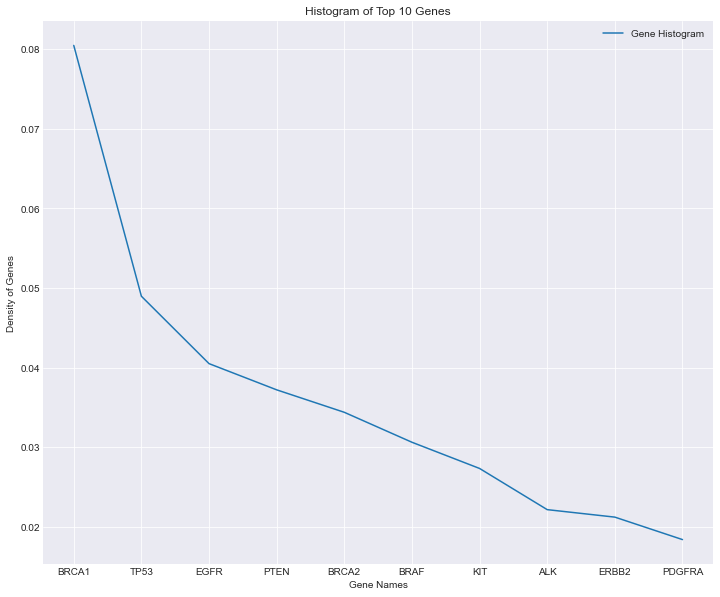

In [92]:
# Distribution of top 10 Gene values

plt.figure(figsize=(12,10))
plt.plot((unique_genes.keys().to_series()).head(10),(pd.Series(h)).head(10), label='Gene Histogram')
plt.title('Histogram of Top 10 Genes')
plt.xlabel('Gene Names')
plt.ylabel('Density of Genes')
plt.legend()
plt.grid(b=bool)
plt.show()

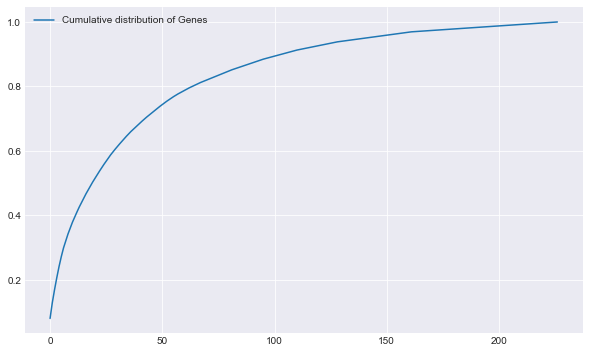

In [93]:
c = np.cumsum(h)
plt.figure(figsize=(10,6))
plt.plot(c,label='Cumulative distribution of Genes')
#plt.grid(b=bool)
plt.legend()
plt.show()

##### Q2. Is the Gene feature useful in predicitng y_i?
**Ans:**
<p>There are many ways to estimate how good a feature is, in predicting y_i. One of the good methods is to build a proper ML model using just this feature. In this case, we will build a logistic regression model using only Gene feature (one hot encoded) to predict y_i.</p>

For values of alpha =  1e-05 The log loss is: 1.1869387104834375
For values of alpha =  0.0001 The log loss is: 1.1738392471108325
For values of alpha =  0.001 The log loss is: 1.221079236137956
For values of alpha =  0.01 The log loss is: 1.3343267706663293
For values of alpha =  0.1 The log loss is: 1.4528376486017445
For values of alpha =  1 The log loss is: 1.4926930094920086
--------------------------------------------------------------------------------


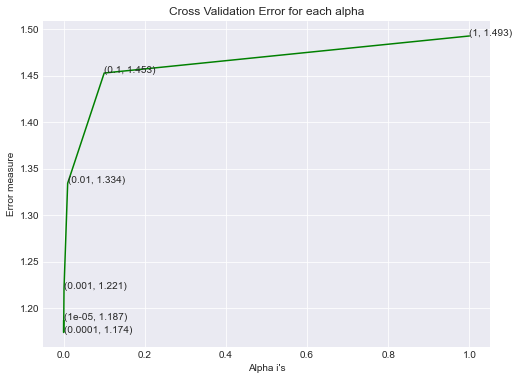

--------------------------------------------------------------------------------
Value of best alpha : 0.0001
--------------------------------------------------------------------------------
For values of best alpha =  0.0001 , The train log loss is: 1.0069990028661941
For values of best alpha =  0.0001 , The cross validation log loss is: 1.1738392471108325
For values of best alpha =  0.0001 , The test log loss is: 1.1693910180325424


In [94]:
alpha = [10 ** x for x in range(-5, 1)] # hyperparam for SGD classifier.

cv_log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_gene_OneHot_arr, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_gene_OneHot_arr, y_train)
    
    predict_y = sig_clf.predict_proba(cv_gene_OneHot_arr)
    
    cv_log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

print("--"*40)
    
fig, ax = plt.subplots(figsize=(8,6))
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

print("--"*40)

best_alpha = np.argmin(cv_log_error_array)
print('Value of best alpha :', alpha[best_alpha])
print("--"*40)

clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_gene_OneHot_arr, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_gene_OneHot_arr, y_train)

predict_y = sig_clf.predict_proba(train_gene_OneHot_arr)
print('For values of best alpha = ', alpha[best_alpha], ", The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_gene_OneHot_arr)
print('For values of best alpha = ', alpha[best_alpha], ", The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_gene_OneHot_arr)
print('For values of best alpha = ', alpha[best_alpha], ", The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))


#### Q3. Is the Gene feature stable across all the data sets (Test, Train, Cross validation)? How many data points in Test and CV datasets are covered by the number of unique genes in train dataset?
**Ans:** Yes, it is. Otherwise, the CV and Test errors would be significantly more than train error. Let's check the train and test coverage below to be more sure.</p>

In [95]:
test_coverage=test_df[test_df['Gene'].isin(list(set(train_df['Gene'])))].shape[0]
cv_coverage=cv_df[cv_df['Gene'].isin(list(set(train_df['Gene'])))].shape[0]

print('1. In test data',test_coverage, 'out of',test_df.shape[0], "i.e.",(test_coverage/test_df.shape[0])*100, "% points are covered")
print('2. In cross validation data',cv_coverage, 'out of ',cv_df.shape[0], "i.e.",(cv_coverage/cv_df.shape[0])*100, "% points are covered")

1. In test data 638 out of 665 i.e. 95.93984962406014 % points are covered
2. In cross validation data 508 out of  532 i.e. 95.48872180451127 % points are covered


### 5.3 'Variation' Feature

Let's have a closer look at the **Variation** feature:-</p>

1. How many categories are there in Variation feature and how are they distributed?
2. Is the Variation feature useful in predicitng output(y_i)?
3. Is the Variation feature stable across train, test and CV datasets?
4. Test and CV coverage - How many data points in Test and CV datasets are covered by the unique values of 'Variation' in train dataset?

##### Q1. How many categories are there in Variation feature and how they are distributed?

**Ans:**

In [96]:
unique_variations = train_df['Variation'].value_counts()
print('Number of Unique Variations :', unique_variations.shape[0])
# the top 10 variations that occured most
print(unique_variations.head(10))

Number of Unique Variations : 1935
Truncating_Mutations    52
Amplification           47
Deletion                42
Fusions                 24
G12V                     4
Overexpression           4
F384L                    2
T167A                    2
Y64A                     2
P130S                    2
Name: Variation, dtype: int64


In [97]:
print("There are", unique_variations.shape[0] ,"different categories of variations in the train data, and they are distibuted as follows",)

There are 1935 different categories of variations in the train data, and they are distibuted as follows


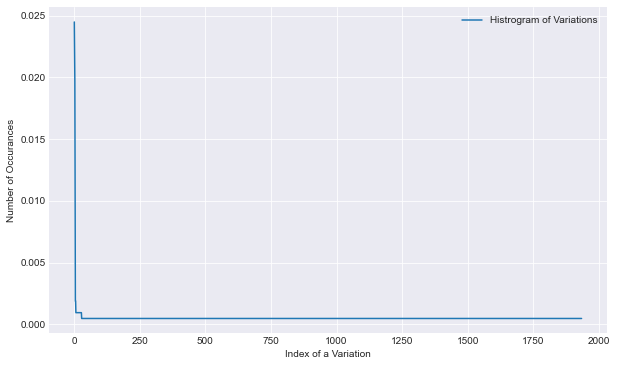

In [98]:
# Distribution of values in Variation Feature
s = sum(unique_variations.values);
h = unique_variations.values/s;
plt.figure(figsize=(10,6))
plt.plot(h, label="Histrogram of Variations")
plt.xlabel('Index of a Variation')
plt.ylabel('Number of Occurances')
plt.legend()
#plt.grid()
plt.show()

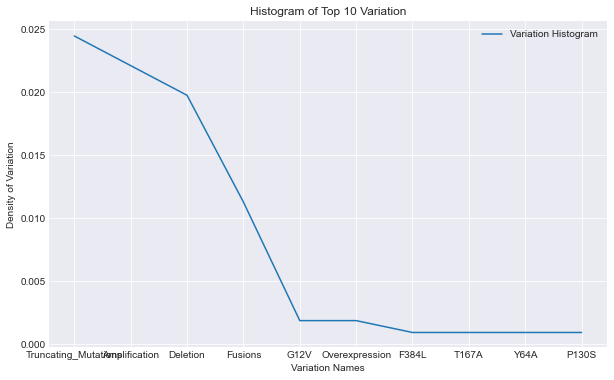

In [99]:
# Distribution of top 10 Variation values

plt.figure(figsize=(10,6))
plt.plot((unique_variations.keys().to_series()).head(10),(pd.Series(h)).head(10), label='Variation Histogram')
plt.title('Histogram of Top 10 Variation')
plt.xlabel('Variation Names')
plt.ylabel('Density of Variation')
plt.legend()
#plt.grid(b=bool)
plt.show()

[0.02448211 0.04661017 0.06638418 ... 0.99905838 0.99952919 1.        ]


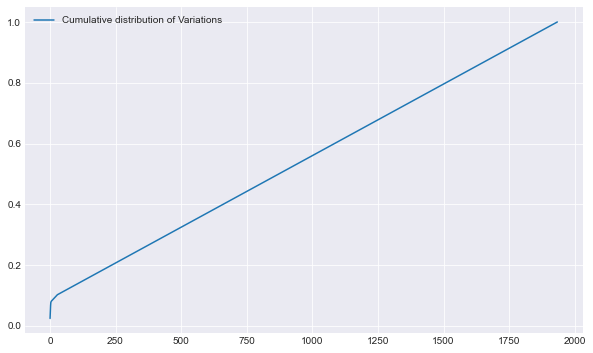

In [100]:
c = np.cumsum(h)
print(c)
plt.figure(figsize=(10,6))
plt.plot(c,label='Cumulative distribution of Variations')
plt.legend()
plt.show()

##### Q2. Is the Variation feature useful in predicting output ( y_i)?
**Ans.** Let's build a model to check this!</p>

For values of alpha =  1e-05 The log loss is: 1.7327129927010796
For values of alpha =  0.0001 The log loss is: 1.7285501699376904
For values of alpha =  0.001 The log loss is: 1.726258459056094
For values of alpha =  0.01 The log loss is: 1.7262608665471546
For values of alpha =  0.1 The log loss is: 1.731221750307942
For values of alpha =  1 The log loss is: 1.7309181409867211
--------------------------------------------------------------------------------


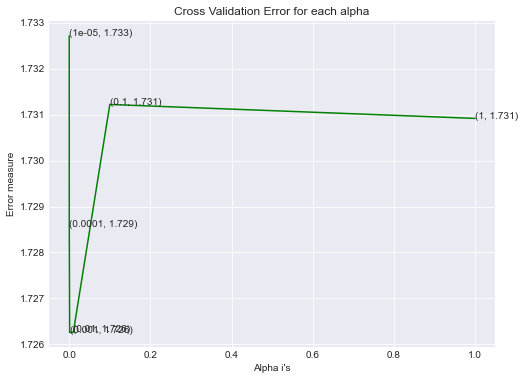

--------------------------------------------------------------------------------
Value of best alpha : 0.001
--------------------------------------------------------------------------------
For values of best alpha =  0.001 , The train log loss is: 1.1845280271792804
For values of best alpha =  0.001 , The cross validation log loss is: 1.726258459056094
For values of best alpha =  0.001 , The test log loss is: 1.7140000254216912


In [101]:
alpha = [10 ** x for x in range(-5, 1)]

cv_log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_var_OneHot_arr, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_var_OneHot_arr, y_train)
    
    predict_y = sig_clf.predict_proba(cv_var_OneHot_arr)
    
    cv_log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

print("--"*40)
    
fig, ax = plt.subplots(figsize=(8,6))
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))

plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

print("--"*40)

best_alpha = np.argmin(cv_log_error_array)
print('Value of best alpha :', alpha[best_alpha])
print("--"*40)

clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_var_OneHot_arr, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_var_OneHot_arr, y_train)

predict_y = sig_clf.predict_proba(train_var_OneHot_arr)
print('For values of best alpha = ', alpha[best_alpha], ", The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_var_OneHot_arr)
print('For values of best alpha = ', alpha[best_alpha], ", The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_var_OneHot_arr)
print('For values of best alpha = ', alpha[best_alpha], ", The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

##### Q3. Is the Variation feature stable across all the data sets (Test, Train, Cross validation)? How many data points in Test and CV datasets are covered by the number of unique Variation values in train dataset?</p>
**Ans.** Not sure! But lets be very sure using the below analysis. </p>

In [102]:
test_coverage=test_df[test_df['Variation'].isin(list(set(train_df['Variation'])))].shape[0]
cv_coverage=cv_df[cv_df['Variation'].isin(list(set(train_df['Variation'])))].shape[0]

print('1. In test data',test_coverage, 'out of',test_df.shape[0], ":",(test_coverage/test_df.shape[0])*100)
print('2. In cross validation data',cv_coverage, 'out of ',cv_df.shape[0],":" ,(cv_coverage/cv_df.shape[0])*100)

1. In test data 79 out of 665 : 11.879699248120302
2. In cross validation data 52 out of  532 : 9.774436090225564


### 5.4 'TEXT' Feature

Let's have a closer look at the **TEXT** feature:-</p>

1. How many unique words are present in the train TEXT data?
2. Is the 'TEXT' feature useful in predicitng output (y_i)?
3. Test and CV coverage - Is the TEXT feature stable across train, test and CV datasets? How many data points in Test and CV datasets are covered by the unique TEXT values in train dataset?

##### Q1. How many unique words are present in the train TEXT data?</p>
**Ans:**

In [103]:
# getting all the feature names (unique words)
train_text_features = text_vectorizer.get_feature_names()

print("Total number of unique words in train data :", len(train_text_features))

Total number of unique words in train data : 46969


In [104]:
#train_text_features[5383:5500]

In [105]:
# train_text_feature_onehotCoding.sum(axis=0).A1 will sum every row and returns (1*number of features) vector
train_text_fea_counts = train_TEXT_OneHot_arr.sum(axis=0).A1

In [106]:
# zip(list(text_features),text_fea_counts) will zip a word with its number of times it occured
text_fea_dict = dict(zip(list(train_text_features),train_text_fea_counts))

In [107]:
#https://stackoverflow.com/a/2258273/4084039
sorted_text_fea_dict = dict(sorted(text_fea_dict.items(), key=lambda x: x[1] , reverse=True))
sorted_text_occur = np.array(list(sorted_text_fea_dict.values()))

In [108]:
# Number of words for a given frequency.
print(Counter(sorted_text_occur))

Counter({1.7320508075688776: 5309, 2.0: 3686, 2.23606797749979: 2281, 2.4494897427831783: 1514, 3.0: 1481, 2.6457513110645907: 1377, 2.82842712474619: 1132, 3.1622776601683795: 864, 3.60555127546399: 661, 1.6329931618554523: 485, 3.3166247903554003: 454, 1.7320508075688772: 427, 3.4641016151377557: 316, 4.0: 294, 1.889822365046136: 280, 2.1213203435596424: 279, 1.6666666666666665: 239, 3.8729833462074157: 221, 3.741657386773941: 188, 1.5075567228888183: 184, 7.280109889280517: 163, 2.5298221281347035: 161, 2.333333333333333: 150, 4.242640687119286: 149, 4.795831523312721: 143, 2.713602101199873: 119, 2.8284271247461907: 110, 2.886751345948129: 109, 1.8973665961010275: 103, 1.7320508075688774: 103, 4.358898943540673: 98, 1.8898223650461359: 96, 1.6059101370939322: 95, 6.48074069840786: 93, 3.0508510792387606: 93, 4.123105625617661: 91, 2.182820625326997: 89, 4.898979485566357: 86, 2.138089935299395: 82, 5.29150262212918: 80, 4.690415759823428: 80, 3.2071349029490923: 80, 2.3094010767585

#### Q2. Is the TEXT feature useful in predicting output ( y_i)?
**Ans.** Let's build a model to check this!</p>

For values of alpha =  1e-05 The log loss is: 1.25797313097555
For values of alpha =  0.0001 The log loss is: 1.0519857664960972
For values of alpha =  0.001 The log loss is: 1.036176624967956
For values of alpha =  0.01 The log loss is: 1.1688284112615195
For values of alpha =  0.1 The log loss is: 1.4536979693727556
For values of alpha =  1 The log loss is: 1.6451601182386721
--------------------------------------------------------------------------------


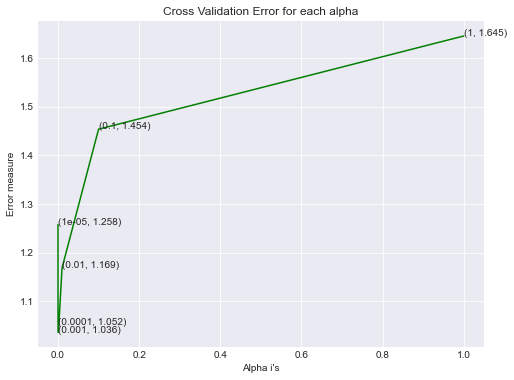

--------------------------------------------------------------------------------
Value of best alpha : 0.001
--------------------------------------------------------------------------------
For values of best alpha =  0.001 The train log loss is: 0.6698654671442057
For values of best alpha =  0.001 The cross validation log loss is: 1.036176624967956
For values of best alpha =  0.001 The test log loss is: 1.1260541701651017


In [109]:
# Train a Logistic regression+Calibration model using text features which are on-hot encoded
alpha = [10 ** x for x in range(-5, 1)]

cv_log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_TEXT_OneHot_arr, y_train)
    
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_TEXT_OneHot_arr, y_train)
    
    predict_y = sig_clf.predict_proba(cv_TEXT_OneHot_arr)
    cv_log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

print("--"*40)

fig, ax = plt.subplots(figsize=(8,6))
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

print("--"*40)

best_alpha = np.argmin(cv_log_error_array)
print('Value of best alpha :', alpha[best_alpha])
print("--"*40)

clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_TEXT_OneHot_arr, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_TEXT_OneHot_arr, y_train)

predict_y = sig_clf.predict_proba(train_TEXT_OneHot_arr)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_TEXT_OneHot_arr)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_TEXT_OneHot_arr)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))


##### Q3. Is the TEXT feature stable across all the data sets (Test, Train, Cross validation)? How many data points in Test and CV datasets are covered by the number of unique TEXT values in train dataset?</p>
**Ans.** Not sure! But lets be sure using the below analysis. </p>

In [110]:
def get_intersec_text(df):
    df_text_vec = CountVectorizer(min_df=3,token_pattern=r'\w+',analyzer='word')
    df_text_fea = df_text_vec.fit_transform(df['CLEAN_TEXT'])
    
    df_text_features = df_text_vec.get_feature_names()
    df_text_fea_counts = df_text_fea.sum(axis=0).A1
    df_text_fea_dict = dict(zip(list(df_text_features),df_text_fea_counts))
    
    len1 = len(set(df_text_features))
    len2 = len(set(train_text_features) & set(df_text_features))
    
    return len1,len2

In [111]:
len1,len2 = get_intersec_text(cv_df)
print(np.round((len2/len1)*100, 3), "% of word of Cross Validation appeared in train data")

len1,len2 = get_intersec_text(test_df)
print(np.round((len2/len1)*100, 3), "% of word of test data appeared in train data")

97.595 % of word of Cross Validation appeared in train data
97.253 % of word of test data appeared in train data


# 6. Data Preparation and Defining methods for modelling and evaluation 

- Prepare the dataset for building and evaluating statistical machine learning models.
- Define methods for model building and evaluation.
- Finally, create a dataframe for storing results.

#### 6.1 Data Preparation for Modelling

- Merging Gene, Variance and TEXT features.
- create dataframes for train, cv and test for reponse_coded features
- Stacking the three types of features - response_coded, one-hot encoded and tf-idf encoded.</p>


In [132]:
# create response coded dataframes for train, cv and test

responseCoded_Gene_col_names = ['Gene' + "_" + str(i) for i in class_labels]
responseCoded_Var_col_names = ['Var' + "_" + str(i) for i in class_labels]
responseCoded_Text_col_names = ['TEXT' + "_" + str(i) for i in class_labels]

train_gene_resp_df = pd.DataFrame(train_gene_responseCoded_arr, columns = responseCoded_Gene_col_names)
train_var_resp_df = pd.DataFrame(train_var_responseCoded_arr, columns = responseCoded_Var_col_names)
train_text_resp_df = pd.DataFrame(train_TEXT_responseCoded_arr, columns = responseCoded_Text_col_names)

cv_gene_resp_df = pd.DataFrame(cv_gene_responseCoded_arr, columns = responseCoded_Gene_col_names)
cv_var_resp_df = pd.DataFrame(cv_var_responseCoded_arr, columns = responseCoded_Var_col_names)
cv_text_resp_df = pd.DataFrame(cv_TEXT_responseCoded_arr, columns = responseCoded_Text_col_names)

test_gene_resp_df = pd.DataFrame(test_gene_responseCoded_arr, columns = responseCoded_Gene_col_names)
test_var_resp_df = pd.DataFrame(test_var_responseCoded_arr, columns = responseCoded_Var_col_names)
test_text_resp_df = pd.DataFrame(test_TEXT_responseCoded_arr, columns = responseCoded_Text_col_names)


train_responseCoded_df = pd.concat([train_gene_resp_df,train_var_resp_df,train_text_resp_df], axis=1)
cv_responseCoded_df = pd.concat([cv_gene_resp_df,cv_var_resp_df,cv_text_resp_df], axis=1)
test_responseCoded_df = pd.concat([test_gene_resp_df,test_var_resp_df,test_text_resp_df], axis=1)



In [136]:
# horizontal stacking of  gene, var and text features - building train, test and cross validation data sets

# a = [[1, 2], 
#      [3, 4]]
# b = [[4, 5], 
#      [6, 7]]
# hstack(a, b) = [[1, 2, 4, 5],
#                [ 3, 4, 6, 7]]


# creating response coded features input for modelling
train_gene_var_responseCoding = np.hstack((train_gene_responseCoded_arr, train_var_responseCoded_arr))
cv_gene_var_responseCoding = np.hstack((cv_gene_responseCoded_arr, cv_var_responseCoded_arr))
test_gene_var_responseCoding = np.hstack((test_gene_responseCoded_arr, test_var_responseCoded_arr))

train_x_responseCoding = np.hstack((train_gene_var_responseCoding, train_TEXT_responseCoded_arr))
cv_x_responseCoding = np.hstack((cv_gene_var_responseCoding, cv_TEXT_responseCoded_arr))
test_x_responseCoding = np.hstack((test_gene_var_responseCoding, test_TEXT_responseCoded_arr))


# creating one-hot encoded features input for modelling
train_gene_var_onehotCoding = hstack((train_gene_OneHot_arr, train_var_OneHot_arr))
cv_gene_var_onehotCoding = hstack((cv_gene_OneHot_arr, cv_var_OneHot_arr))
test_gene_var_onehotCoding = hstack((test_gene_OneHot_arr, test_var_OneHot_arr))

train_x_onehotCoding = hstack((train_gene_var_onehotCoding, train_TEXT_OneHot_arr)).tocsr()
cv_x_onehotCoding = hstack((cv_gene_var_onehotCoding, cv_TEXT_OneHot_arr)).tocsr()
test_x_onehotCoding = hstack((test_gene_var_onehotCoding, test_TEXT_OneHot_arr)).tocsr()


# creating tf-idf  encoded features input for modelling
train_gene_var_tfidf = hstack((train_gene_tfidf_arr, train_var_tfidf_arr))
cv_gene_var_tfidf = hstack((cv_gene_tfidf_arr, cv_var_tfidf_arr))
test_gene_var_tfidf = hstack((test_gene_tfidf_arr, test_var_tfidf_arr))

# uni-gram TF-IDF
train_x_tfidf_uni = hstack((train_gene_var_tfidf, train_TEXT_tfidf_uni_arr)).tocsr()
cv_x_tfidf_uni = hstack((cv_gene_var_tfidf, cv_TEXT_tfidf_uni_arr)).tocsr()
test_x_tfidf_uni = hstack((test_gene_var_tfidf, test_TEXT_tfidf_uni_arr)).tocsr()

# bi-gram TF-IDF
train_x_tfidf_bi = hstack((train_gene_var_tfidf, train_TEXT_tfidf_bi_arr)).tocsr()
cv_x_tfidf_bi = hstack((cv_gene_var_tfidf, cv_TEXT_tfidf_bi_arr)).tocsr()
test_x_tfidf_bi = hstack((test_gene_var_tfidf, test_TEXT_tfidf_bi_arr)).tocsr()


# creating output features for modelling
train_y = np.array(list(train_df['Class']))
cv_y = np.array(list(cv_df['Class']))
test_y = np.array(list(test_df['Class']))


print(" Response encoding features :\n")
print("(number of data points * number of features) in train data = ", train_x_responseCoding.shape)
print("(number of data points * number of features) in test data = ", test_x_responseCoding.shape)
print("(number of data points * number of features) in cross validation data =", cv_x_responseCoding.shape)

print("\n")
print("--"*50)

print("One hot encoding features :\n")
print("(number of data points * number of features) in train data = ", train_x_onehotCoding.shape)
print("(number of data points * number of features) in test data = ", test_x_onehotCoding.shape)
print("(number of data points * number of features) in cross validation data = ", cv_x_onehotCoding.shape)

print("\n")
print("--"*50)

print("Tf Idf encoding Uni-gram features :\n")
print("(number of data points * number of features) in train data = ", train_x_tfidf_uni.shape)
print("(number of data points * number of features) in test data = ", test_x_tfidf_uni.shape)
print("(number of data points * number of features) in cross validation data = ", cv_x_tfidf_uni.shape)

print("\n")
print("--"*50)

print("Tf Idf encoding Bi-gram features :\n")
print("(number of data points * number of features) in train data = ", train_x_tfidf_bi.shape)
print("(number of data points * number of features) in test data = ", test_x_tfidf_bi.shape)
print("(number of data points * number of features) in cross validation data = ", cv_x_tfidf_bi.shape)

 Response encoding features :

(number of data points * number of features) in train data =  (2124, 27)
(number of data points * number of features) in test data =  (665, 27)
(number of data points * number of features) in cross validation data = (532, 27)


----------------------------------------------------------------------------------------------------
One hot encoding features :

(number of data points * number of features) in train data =  (2124, 49131)
(number of data points * number of features) in test data =  (665, 49131)
(number of data points * number of features) in cross validation data =  (532, 49131)


----------------------------------------------------------------------------------------------------
Tf Idf encoding Uni-gram features :

(number of data points * number of features) in train data =  (2124, 49131)
(number of data points * number of features) in test data =  (665, 49131)
(number of data points * number of features) in cross validation data =  (532, 49131)

#### 6.2 Defining Methods for Model Building and Evaluation:

In [149]:
# Creating a single Generic Class for model fitting, prediction, evaluation and hyperparameter tuning.
# defining static methods enables using them across the notebook without creating class instance.

class Modelling_and_Evaluation:

    @staticmethod
    def generate_random_model_probs(inp_df, no_of_target_classes = 2):
        """
        This function returns the randomly simulated probabilities for a random model
        """
        # no. of rows of the X_train data
        x_samples = inp_df.shape[0]

        # create an output array of probabilities that has exactly same size as the input train data
        x_random_probs = np.zeros(shape=(x_samples, no_of_target_classes))

        # generate randomly simulated probabilities
        for i in range(x_samples):
            rand_probabs = np.random.rand(1, no_of_target_classes)

            # this will ensure the sum of the randomly generated probabilities will be equal to 1 for both the classes
            x_random_probs[i] = (rand_probabs/np.sum(rand_probabs))[0]

        return x_random_probs

   
    @staticmethod
    def get_model_eval_metrics(y_true, y_labels, y_probs, average='binary'):
        """
        This function returns the model evaluation metrics like log-loss, accuracy, auc, precision, recall and F1-score.
        """

        accuracy = round(accuracy_score(y_true, y_labels), 3)
        precision = round(precision_score(y_true, y_labels, average = average), 3)
        recall = round(recall_score(y_true, y_labels, average = average), 3)
        f1 = round(f1_score(y_true, y_labels, average = average), 3)
        Lg_Loss = round(log_loss(y_true, y_probs), 3)
        auc_score = round(roc_auc_score(y_true, y_probs, average = average, multi_class = 'ovr'), 3)
        
        #print("Classification Report :\n\n",classification_report(y_true,y_labels,labels=[0,1]))
        #print("=="*50)
        print("Log_Loss : {:.3f}".format(Lg_Loss), end="\n")
        print("Accuracy : {:.3f}".format(accuracy), end="\n")
        print("AUC score : {:.3f}".format(auc_score), end="\n")
        print("Precision : {:.3f}".format(precision), end="\n")
        print("Recall : {:.3f}".format(recall), end="\n")
        print("F1_score : {:.3f}".format(f1))
        
        return accuracy, precision, recall, f1, Lg_Loss, auc_score
    
    
    @staticmethod
    def plot_confusion_matrix(y_true, y_predict, class_labels):  
        """
        This function plots the confusion, precision and recall matrices given y_i, y_i_hat.
        """

        #Confusion Matrix
        C = confusion_matrix(y_true, y_predict)
        # C = 9,9 matrix, each cell (i,j) represents the number of points of class i are predicted class j

        #Precision Matrix
        P =(C/C.sum(axis=0))
        #divide each element of the confusion matrix with the sum of elements in that column
        #axis=0 corresonds to columns in two diamensional array
        #sum of column elements = 1

        #Recall Matrix
        R =(((C.T)/(C.sum(axis=1))).T)
        #divide each element of the confusion matrix with the sum of elements in that row
        #axis=1 corresponds to rows in two diamensional array
        #sum of row elements = 1


        # representing C(Confusion Matrix) in heatmap format
        print("=="*20, "Confusion matrix ", "=="*20)
        plt.figure(figsize=(20,7))
        sns.heatmap(C, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=class_labels, yticklabels=class_labels)
        plt.xlabel('Predicted Class')
        plt.ylabel('Original Class')
        plt.show()

        print("\n")

        # representing P(Precision Matrix) in heatmap format
        print("=="*20, "Precision matrix (Columm Sum=1) ", "=="*10)
        plt.figure(figsize=(20,7))
        sns.heatmap(P, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=class_labels, yticklabels=class_labels)
        plt.xlabel('Predicted Class')
        plt.ylabel('Original Class')
        plt.show()

        print("\n")

        # representing R (Recall Matrix) in heatmap format
        print("=="*20, "Recall matrix (Row sum=1) ", "=="*10)
        plt.figure(figsize=(20,7))
        sns.heatmap(R, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=class_labels, yticklabels=class_labels)
        plt.xlabel('Predicted Class')
        plt.ylabel('Original Class')
        plt.show()
    


# Creating an instnace of the class
Cls_Mod = Modelling_and_Evaluation()    

#### 6.3 Create a dataframe for storing results

In [80]:
col_names = ['Model','Text_Preprocessing','Log_Loss','Accuracy','AUC','Precision','Recall','F1-score','Execution_Time','Percentage_Missclassified']
Result_final = pd.DataFrame(columns = col_names)
Result_final

,Model,Text_Preprocessing,Log_Loss,Accuracy,AUC,Precision,Recall,F1-score,Execution_Time,Percentage_Missclassified


# 7. Model Building and Evaluation using statistical models

- We define **'Log_loss' and 'Confusion_Matrix'** as a baseline for evaluating different models.
- We will use these baseline **'Log_loss' and 'Confusion_Matrix'** scores as a benchmark for comparing different statistical models.

## 7.1 Prediction using a 'Random' Model 

- We define a baseline using a **Random Model** for model Building and Evaluation.
- In a **'Random' Model**, we generate the **9 class probabilites** randomly such that they sum to 1.
- We then evaluate this **'Random' Model** based on the **Log_loss** and **Confusion_Matrix**.

Log loss on Cross Validation Data using Random Model: 2.459589972280271
Log loss on Test Data using Random Model: 2.4732916062009567
Execution time : 0.028340400000161026
======================================== Confusion matrix  ========================================


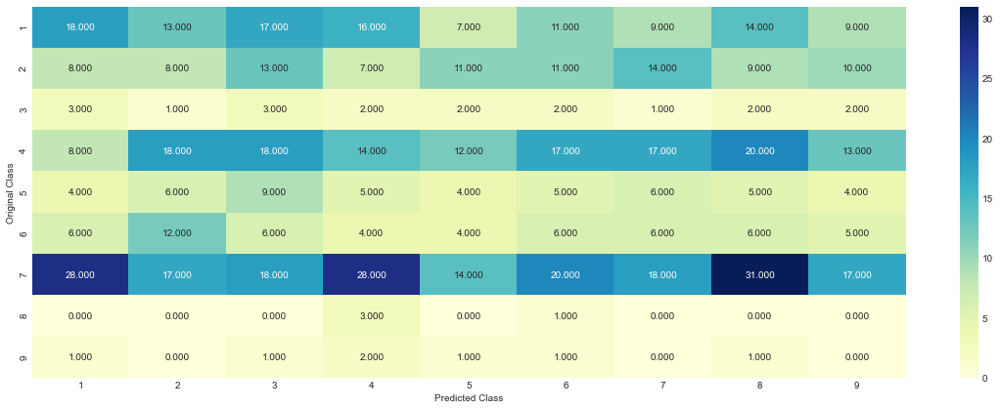



======================================== Precision matrix (Columm Sum=1)  ====================


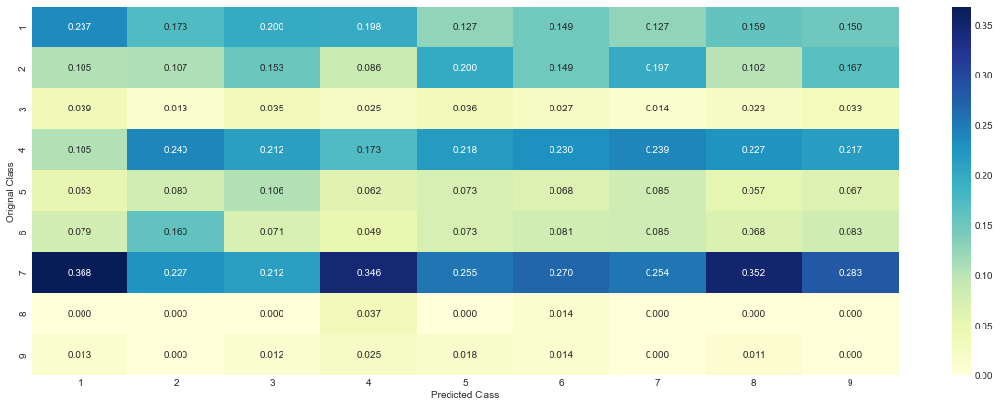



======================================== Recall matrix (Row sum=1)  ====================


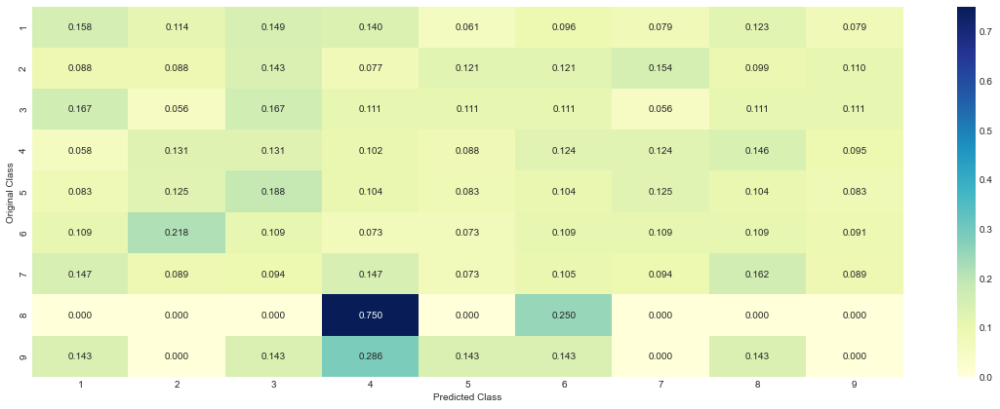

--------------------------------------------------------------------------------
Log_Loss : 2.473
Accuracy : 0.107
AUC score : 0.498
Precision : 0.177
Recall : 0.107
F1_score : 0.126
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.8932330827067669 %




In [151]:
# ref: https://stackoverflow.com/a/18662466/4084039

# no. of classes in target data
no_of_target_classes = merge_data.nunique(axis=0)['Class']

# CrossValidation-Set error.
# generate randomly simulated probabilities for Cross-Validaton set
cv_predicted_y = Cls_Mod.generate_random_model_probs(cv_df, no_of_target_classes)    
print("=="*50)
print("Log loss on Cross Validation Data using Random Model:",log_loss(y_cv, cv_predicted_y, eps=1e-15))
#print("\n")


start_time = time.clock()

# Test-Set error.
# generate randomly simulated probabilities for Cross-Validaton set
test_predicted_y = Cls_Mod.generate_random_model_probs(test_df, no_of_target_classes) 
print("=="*50)
print("Log loss on Test Data using Random Model:",log_loss(y_test,test_predicted_y, eps=1e-15))
#print("\n")
print("=="*50)

# we extract the actual output class label array for Test set based on the index values 
#corresponding to maximum probability value for each row in the test_predicted_y array.
y_predicted = np.argmax(test_predicted_y, axis=1)

# Correcting the index for actual output class labels i.e correction from (0 to 8) to (1 to 9).
y_predicted += 1

# compute execution time
run_time_randm = time.clock() - start_time
print("Execution time :", run_time_randm)


# actual class labels 
class_labels = sorted(merge_data.Class.unique())

# plot the confusion matrix, precision matrix and recall matrix.
Cls_Mod.plot_confusion_matrix(y_test, y_predicted, class_labels)

print("--"*40)

# random model evaluation
accuracy_randm, precision_randm, recall_randm, f1_randm, Lg_Loss_randm, auc_score_randm = Cls_Mod.get_model_eval_metrics(y_test, y_predicted, test_predicted_y, 'weighted')
print("--"*40)

# number of miss-classified points
misclassified_randm = np.count_nonzero(y_predicted - test_y)/test_y.shape[0]
print("Percentage of misclassified points :", misclassified_randm, "%")
print("=="*40)
print("\n")

# save the results
Result_randm = pd.DataFrame([{'Model': 'Random Model',
                              'Text_Preprocessing' : '--',
                              'Log_Loss' : Lg_Loss_randm,
                              'Accuracy': accuracy_randm,
                              'AUC' : auc_score_randm,
                              'Precision': precision_randm, 
                              'Recall': recall_randm,
                              'F1-score': f1_randm,
                              'Execution_Time' : run_time_randm, 
                              'Percentage_Missclassified' : misclassified_randm}])

Result_final = Result_final.append(Result_randm, ignore_index = True)

**Observation:**

- Random model has largely mis-classified the data points and this can be evident from the confusion, precision and recall matrices.
- As expected, the Random  model is performing very poorly on our dataset as ideally we would need a log loss of **'0'** or close to **'0'**.

## 7.2 Base Line Model - Naive Bayes

In [152]:
def train_naive_bayes(train_x, train_y, cv_x, cv_y, test_x, test_y, model_nm, vectorization):
    
    print("Analyzing {} Model using '{}' Approach:-".format(model_nm, vectorization))
    print("\n")
    # hyper parameter tuning
    alpha = [0.00001, 0.0001, 0.001, 0.1, 1, 10, 100,1000]

    cv_log_error_array = []
    for i in alpha:
        print("for alpha =", i)
        clf = MultinomialNB(alpha=i)
        clf.fit(train_x, train_y)

        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(train_x, train_y)

        sig_clf_probs = sig_clf.predict_proba(cv_x)

        cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
        print("Log Loss :",log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15)) 

    print("--"*40)

    # plot the log-error for each alpha
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    fig, ax = plt.subplots(figsize=(8,6))
    ax.plot(np.log10(alpha), cv_log_error_array, c='g')
    for i, txt in enumerate(np.round(cv_log_error_array,3)):
        ax.annotate((alpha[i],str(txt)), (np.log10(alpha[i]),cv_log_error_array[i]))
    plt.xticks(np.log10(alpha))
    plt.title("Cross Validation Error for each alpha")
    plt.xlabel("Alpha i's")
    plt.ylabel("Error measure")
    plt.show()

    print("--"*40)

    # get the value of best alpha
    best_alpha = np.argmin(cv_log_error_array)
    print('Value of best alpha :', alpha[best_alpha])

    print("--"*40)

    start_time = time.clock()

    # retrain the model using best alpha
    clf = MultinomialNB(alpha=alpha[best_alpha])
    clf.fit(train_x, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x, train_y)

    # predict the log_loss using best alpha
    predict_y_test = sig_clf.predict(test_x)
    predict_probs_y_test = sig_clf.predict_proba(test_x)

    # compute execution time
    run_time_nb = time.clock() - start_time
    print("Execution time :", run_time_nb)
    print("--"*40)

    predict_probs_y_train = sig_clf.predict_proba(train_x)
    print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(train_y, predict_probs_y_train, labels=clf.classes_, eps=1e-15))

    predict_probs_y_cv = sig_clf.predict_proba(cv_x)
    print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(cv_y, predict_probs_y_cv, labels=clf.classes_, eps=1e-15))

    print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(test_y, predict_probs_y_test, labels=clf.classes_, eps=1e-15))

    print("--"*40)

    # plot the confusion matrix, precision matrix and recall matrix.
    Cls_Mod.plot_confusion_matrix(y_test, predict_y_test, class_labels)
    print("--"*40)

    # complete model evaluation
    accuracy_nb, precision_nb, recall_nb, f1_nb, Lg_Loss_nb, auc_score_nb = Cls_Mod.get_model_eval_metrics(test_y, predict_y_test, predict_probs_y_test, 'weighted')
    print("--"*40)

    # number of miss-classified points
    misclassified_nb = np.count_nonzero(predict_y_test - test_y)/test_y.shape[0]
    print("Percentage of misclassified points :", misclassified_nb, "%")
    print("=="*40)
    print("\n")

    # Save the results of the model
    Result_nb = pd.DataFrame([{'Model': model_nm,
                              'Text_Preprocessing' : vectorization,
                              'Log_Loss' : Lg_Loss_nb,
                              'Accuracy': accuracy_nb,
                              'AUC' : auc_score_nb,
                              'Precision': precision_nb, 
                              'Recall': recall_nb,
                              'F1-score': f1_nb,
                              'Execution_Time' : run_time_nb,
                              'Percentage_Missclassified' : misclassified_nb}])
    
    return Result_nb

Analyzing Naive Bayes Model using 'Response Coding' Approach:-


for alpha = 1e-05
Log Loss : 1.2063089231563056
for alpha = 0.0001
Log Loss : 1.2063073212447455
for alpha = 0.001
Log Loss : 1.2062912247081463
for alpha = 0.1
Log Loss : 1.204313925650149
for alpha = 1
Log Loss : 1.205787406258268
for alpha = 10
Log Loss : 1.2572011183762621
for alpha = 100
Log Loss : 1.2709760736353468
for alpha = 1000
Log Loss : 1.2764158226044398
--------------------------------------------------------------------------------


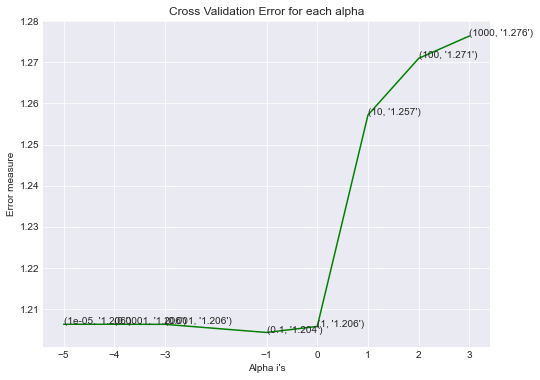

--------------------------------------------------------------------------------
Value of best alpha : 0.1
--------------------------------------------------------------------------------
Execution time : 0.29406120000021474
--------------------------------------------------------------------------------
For values of best alpha =  0.1 The train log loss is: 1.1951945089039804
For values of best alpha =  0.1 The cross validation log loss is: 1.204313925650149
For values of best alpha =  0.1 The test log loss is: 1.2315593629852157
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


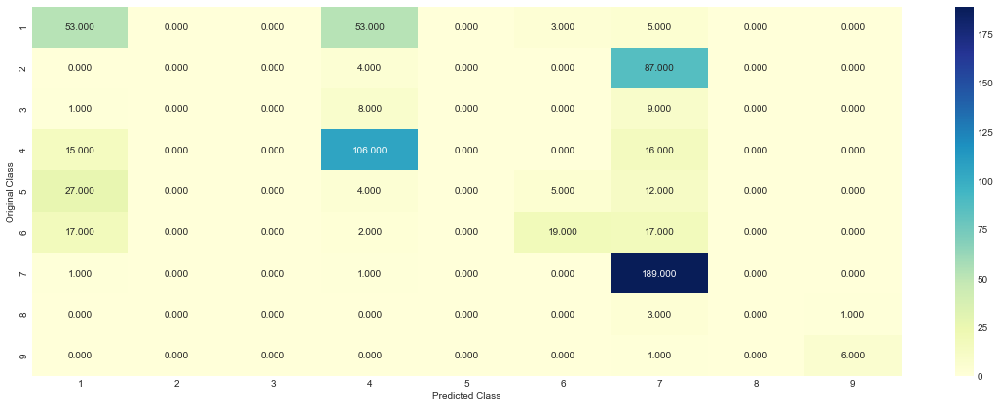



======================================== Precision matrix (Columm Sum=1)  ====================


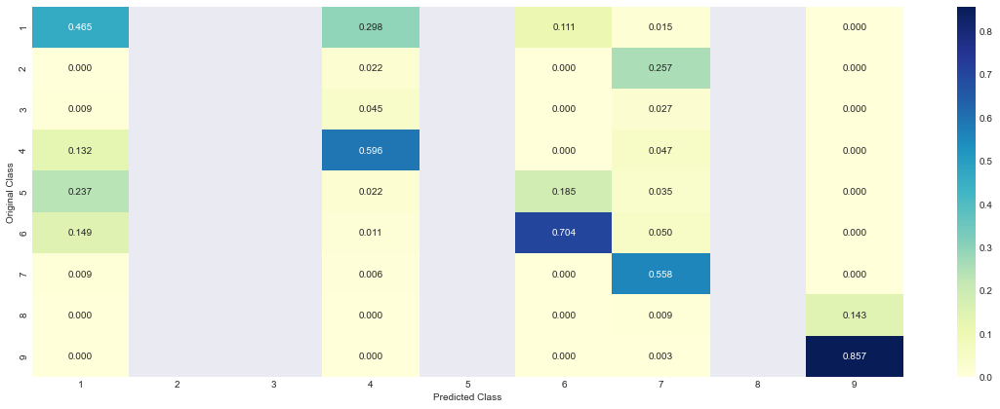



======================================== Recall matrix (Row sum=1)  ====================


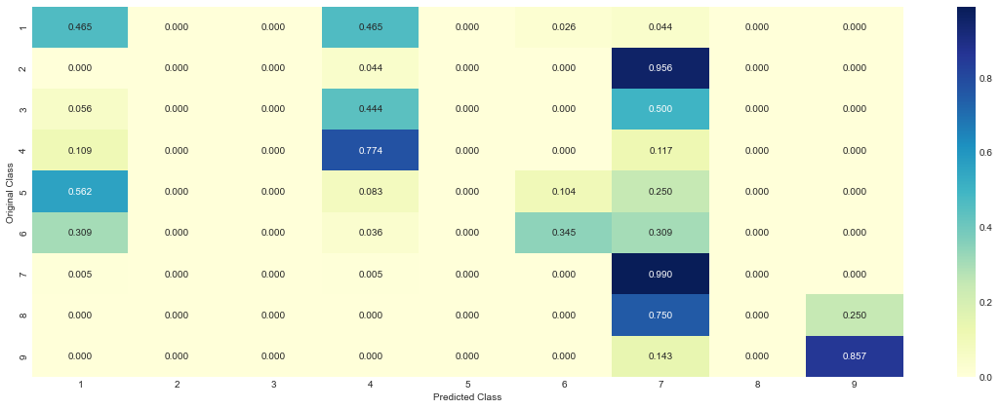

--------------------------------------------------------------------------------
Log_Loss : 1.232
Accuracy : 0.561
AUC score : 0.856
Precision : 0.430
Recall : 0.561
F1_score : 0.471
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.43909774436090226 %


Analyzing Naive Bayes Model using 'BOW 1-gram' Approach:-


for alpha = 1e-05
Log Loss : 1.2280972846062679
for alpha = 0.0001
Log Loss : 1.220088684508173
for alpha = 0.001
Log Loss : 1.2146173973222956
for alpha = 0.1
Log Loss : 1.2375352207078514
for alpha = 1
Log Loss : 1.2205348654885737
for alpha = 10
Log Loss : 1.3199529424983936
for alpha = 100
Log Loss : 1.3118261928874178
for alpha = 1000
Log Loss : 1.2450305486339963
--------------------------------------------------------------------------------


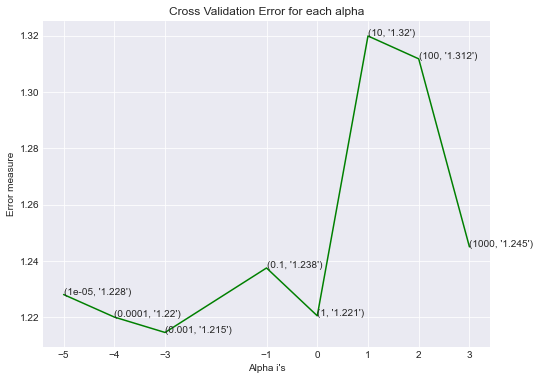

--------------------------------------------------------------------------------
Value of best alpha : 0.001
--------------------------------------------------------------------------------
Execution time : 0.7892475000007835
--------------------------------------------------------------------------------
For values of best alpha =  0.001 The train log loss is: 0.8477842391491563
For values of best alpha =  0.001 The cross validation log loss is: 1.2146173973222956
For values of best alpha =  0.001 The test log loss is: 1.2481089014216975
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


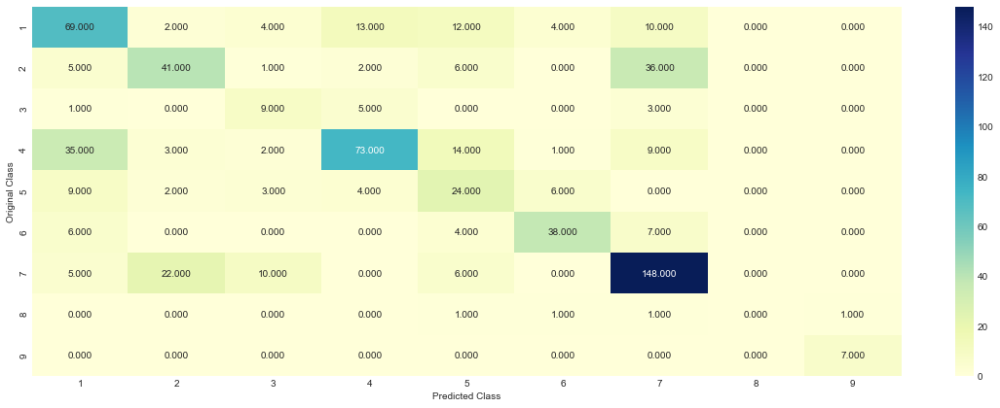



======================================== Precision matrix (Columm Sum=1)  ====================


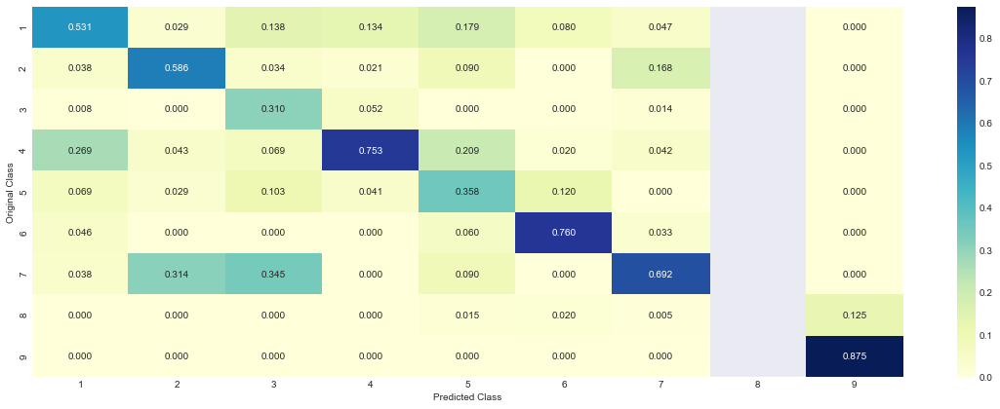



======================================== Recall matrix (Row sum=1)  ====================


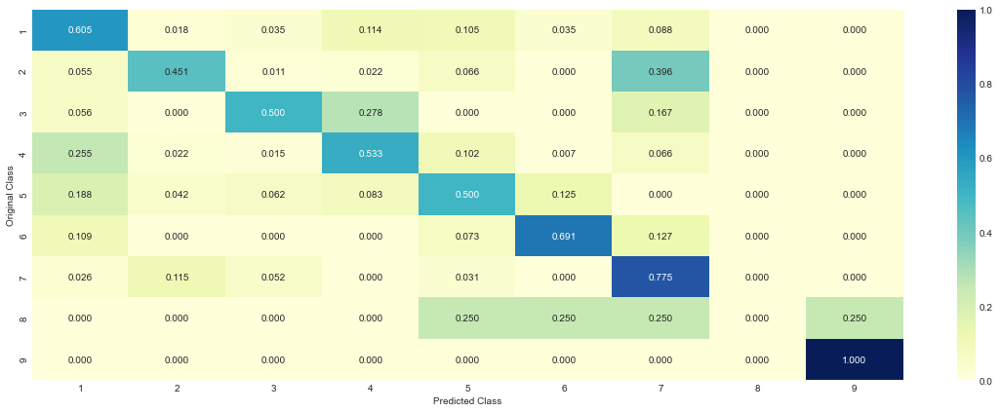

--------------------------------------------------------------------------------
Log_Loss : 1.248
Accuracy : 0.615
AUC score : 0.843
Precision : 0.631
Recall : 0.615
F1_score : 0.615
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3849624060150376 %


Analyzing Naive Bayes Model using 'TF-IDF 1-gram' Approach:-


for alpha = 1e-05
Log Loss : 1.138775974921637
for alpha = 0.0001
Log Loss : 1.1331563570877916
for alpha = 0.001
Log Loss : 1.1214175995519748
for alpha = 0.1
Log Loss : 1.175593353234574
for alpha = 1
Log Loss : 1.297472005805596
for alpha = 10
Log Loss : 1.2947194375347901
for alpha = 100
Log Loss : 1.2508203757034821
for alpha = 1000
Log Loss : 1.2526158262777873
--------------------------------------------------------------------------------


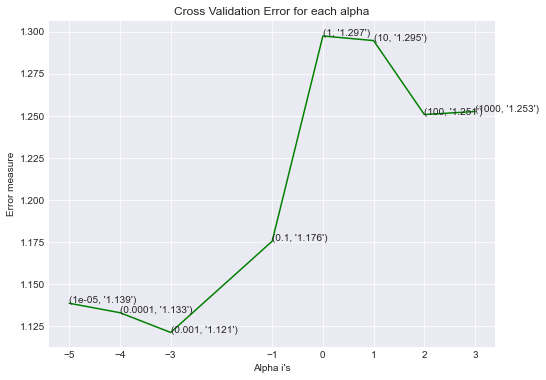

--------------------------------------------------------------------------------
Value of best alpha : 0.001
--------------------------------------------------------------------------------
Execution time : 0.7001145000012912
--------------------------------------------------------------------------------
For values of best alpha =  0.001 The train log loss is: 0.6723547423884448
For values of best alpha =  0.001 The cross validation log loss is: 1.1214175995519748
For values of best alpha =  0.001 The test log loss is: 1.1628036231226018
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


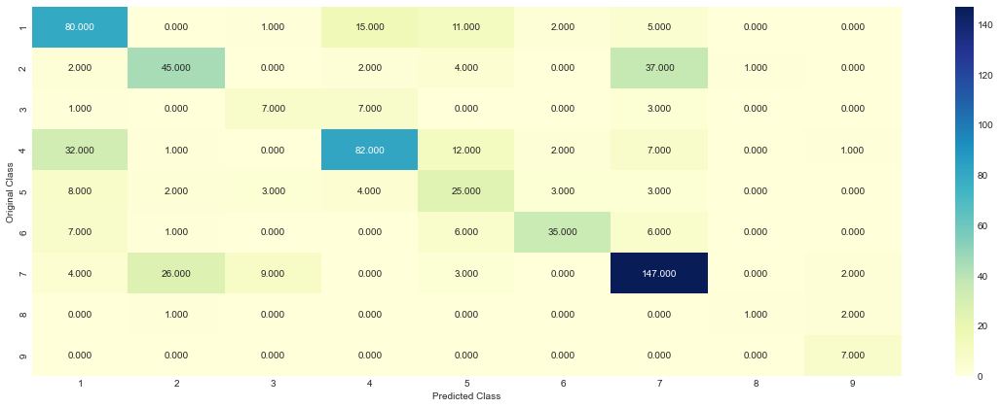



======================================== Precision matrix (Columm Sum=1)  ====================


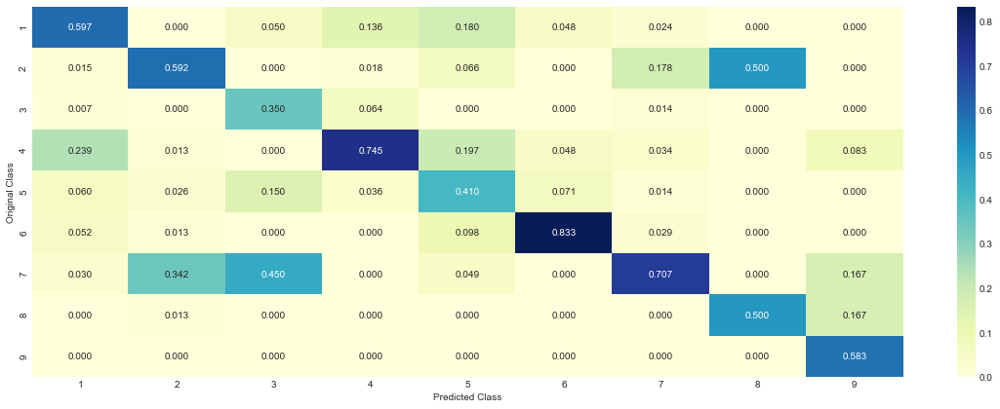



======================================== Recall matrix (Row sum=1)  ====================


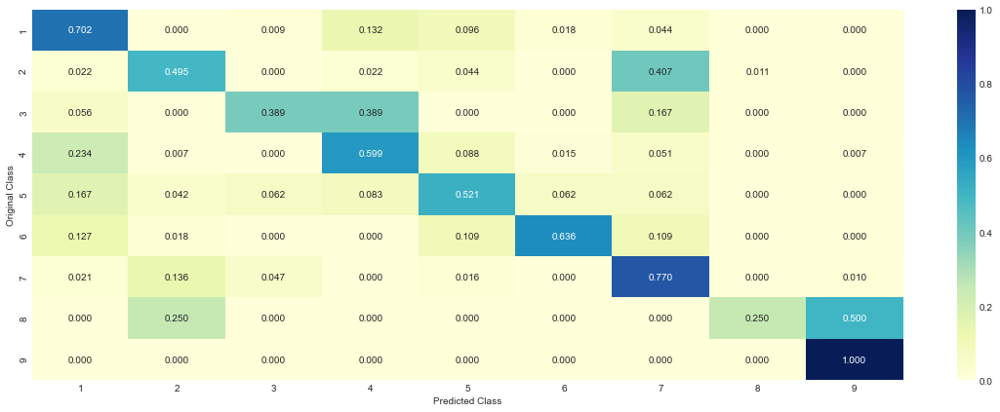

--------------------------------------------------------------------------------
Log_Loss : 1.163
Accuracy : 0.645
AUC score : 0.868
Precision : 0.657
Recall : 0.645
F1_score : 0.645
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3548872180451128 %


Analyzing Naive Bayes Model using 'TF-IDF 2-gram' Approach:-


for alpha = 1e-05
Log Loss : 1.159442088255548
for alpha = 0.0001
Log Loss : 1.1627479931315825
for alpha = 0.001
Log Loss : 1.1706515752149258
for alpha = 0.1
Log Loss : 1.1697410399783572
for alpha = 1
Log Loss : 1.2384439263579083
for alpha = 10
Log Loss : 1.2210692062357955
for alpha = 100
Log Loss : 1.2184276065533297
for alpha = 1000
Log Loss : 1.2274718804089029
--------------------------------------------------------------------------------


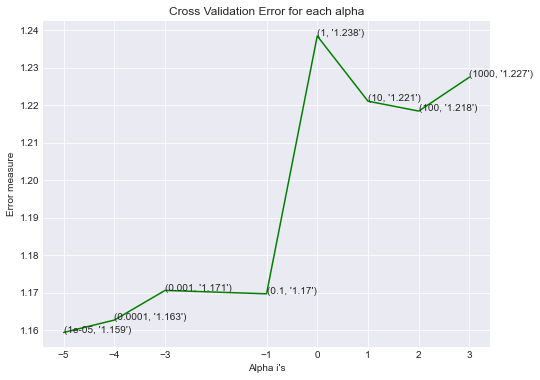

--------------------------------------------------------------------------------
Value of best alpha : 1e-05
--------------------------------------------------------------------------------
Execution time : 1.709566100000302
--------------------------------------------------------------------------------
For values of best alpha =  1e-05 The train log loss is: 0.7325030619503482
For values of best alpha =  1e-05 The cross validation log loss is: 1.159442088255548
For values of best alpha =  1e-05 The test log loss is: 1.2028778473561372
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


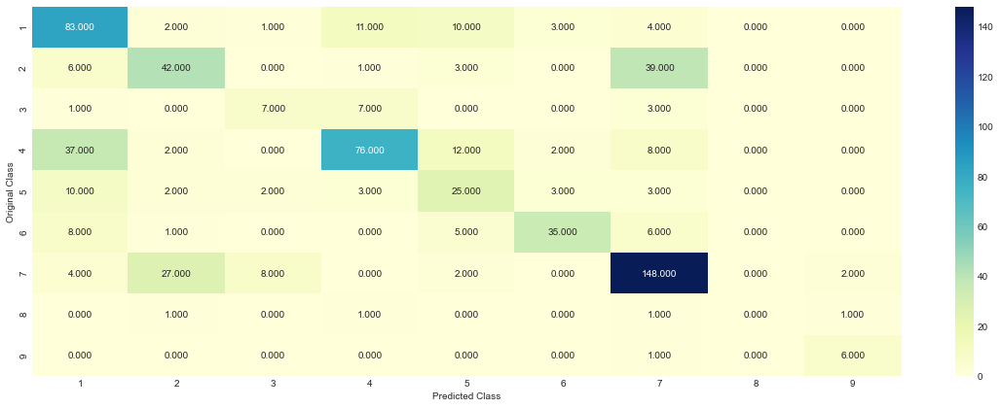



======================================== Precision matrix (Columm Sum=1)  ====================


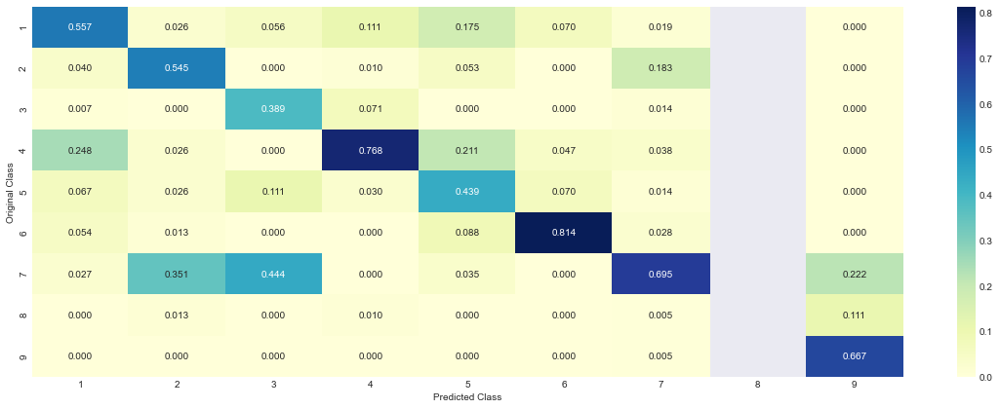



======================================== Recall matrix (Row sum=1)  ====================


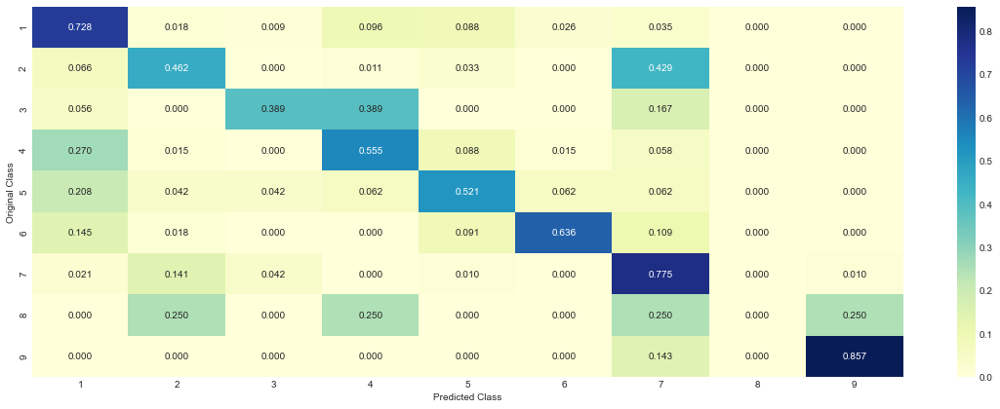

--------------------------------------------------------------------------------
Log_Loss : 1.203
Accuracy : 0.635
AUC score : 0.855
Precision : 0.644
Recall : 0.635
F1_score : 0.632
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.36541353383458647 %




In [153]:
# Fit and Evaluate Naive Bayes Model
model_nm = 'Naive Bayes'
for vectorization in ['Response Coding','BOW 1-gram','TF-IDF 1-gram','TF-IDF 2-gram']: 
    if vectorization == 'Response Coding':
        Result_final = Result_final.append(train_naive_bayes(train_x_responseCoding, train_y, cv_x_responseCoding, cv_y, test_x_responseCoding, test_y, model_nm, vectorization),ignore_index = True)
    elif vectorization == 'BOW 1-gram':
        Result_final = Result_final.append(train_naive_bayes(train_x_onehotCoding, train_y, cv_x_onehotCoding, cv_y, test_x_onehotCoding, test_y, model_nm, vectorization),ignore_index = True)
    elif vectorization == 'TF-IDF 1-gram':
        Result_final = Result_final.append(train_naive_bayes(train_x_tfidf_uni, train_y, cv_x_tfidf_uni, cv_y, test_x_tfidf_uni, test_y, model_nm, vectorization),ignore_index = True)
    else:
        Result_final = Result_final.append(train_naive_bayes(train_x_tfidf_bi, train_y, cv_x_tfidf_bi, cv_y, test_x_tfidf_bi, test_y, model_nm, vectorization),ignore_index = True)

## 7.3 K-Nearest Neighbour

In [154]:
def train_KNN(train_x, train_y, cv_x, cv_y, test_x, test_y, model_nm, vectorization):
    
    print("Analyzing {} Model using '{}' Approach:-".format(model_nm, vectorization))
    print("\n")
    # hyper parameter tuning
    alpha = [5, 11, 15, 21, 31, 41, 51, 99]

    cv_log_error_array = []
    
    for i in alpha:
        print("for alpha =", i)
        clf = KNeighborsClassifier(n_neighbors=i)
        clf.fit(train_x, train_y)
        
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(train_x, train_y)
        
        sig_clf_probs = sig_clf.predict_proba(cv_x)
        
        cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
        print("Log Loss :",log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15)) 

    print("--"*40)

    # plot the log-error for each alpha
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    fig, ax = plt.subplots(figsize=(8,6))
    ax.plot(np.log10(alpha), cv_log_error_array, c='g')
    for i, txt in enumerate(np.round(cv_log_error_array,3)):
        ax.annotate((alpha[i],str(txt)), (np.log10(alpha[i]),cv_log_error_array[i]))
    plt.xticks(np.log10(alpha))
    plt.title("Cross Validation Error for each alpha")
    plt.xlabel("Alpha i's")
    plt.ylabel("Error measure")
    plt.show()

    print("--"*40)

    # get the value of best alpha
    best_alpha = np.argmin(cv_log_error_array)
    print('Value of best alpha :', alpha[best_alpha])

    print("--"*40)


    start_time = time.clock()

    # retrain the model using best alpha
    clf = KNeighborsClassifier(n_neighbors=alpha[best_alpha])
    clf.fit(train_x, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x, train_y)

    # predict the log_loss using best alpha
    predict_y_test = sig_clf.predict(test_x)
    predict_probs_y_test = sig_clf.predict_proba(test_x)

    # compute execution time
    run_time_knn = time.clock() - start_time
    print("Execution time :", run_time_knn)
    print("--"*40)

    predict_probs_y_train = sig_clf.predict_proba(train_x)
    print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(train_y, predict_probs_y_train, labels=clf.classes_, eps=1e-15))

    predict_probs_y_cv = sig_clf.predict_proba(cv_x)
    print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(cv_y, predict_probs_y_cv, labels=clf.classes_, eps=1e-15))

    print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(test_y, predict_probs_y_test, labels=clf.classes_, eps=1e-15))

    print("--"*40)

    # plot the confusion matrix, precision matrix and recall matrix.
    Cls_Mod.plot_confusion_matrix(y_test, predict_y_test, class_labels)
    print("--"*40)

    # complete model evaluation
    accuracy_knn, precision_knn, recall_knn, f1_knn, Lg_Loss_knn, auc_score_knn = Cls_Mod.get_model_eval_metrics(test_y, predict_y_test, predict_probs_y_test, 'weighted')
    print("--"*40)

    # number of miss-classified points
    misclassified_knn = np.count_nonzero(predict_y_test - test_y)/test_y.shape[0]
    print("Percentage of misclassified points :", misclassified_knn, "%")
    print("=="*40)
    print("\n")

    # Save the results of the model
    Result_knn = pd.DataFrame([{'Model': model_nm,
                                'Text_Preprocessing' : vectorization,
                                'Log_Loss' : Lg_Loss_knn,
                                'Accuracy': accuracy_knn,
                                'AUC' : auc_score_knn,
                                'Precision': precision_knn, 
                                'Recall': recall_knn,
                                'F1-score': f1_knn,
                                'Execution_Time' : run_time_knn,
                                'Percentage_Missclassified' : misclassified_knn}])
    return Result_knn

Analyzing K-Nearest Neighbours Model using 'Response Coding' Approach:-


for alpha = 5
Log Loss : 1.0301939804129876
for alpha = 11
Log Loss : 1.0174736136452862
for alpha = 15
Log Loss : 1.0264932116752563
for alpha = 21
Log Loss : 1.048011737278688
for alpha = 31
Log Loss : 1.0403251303723173
for alpha = 41
Log Loss : 1.0595794571137036
for alpha = 51
Log Loss : 1.0703612721776568
for alpha = 99
Log Loss : 1.0957817764744269
--------------------------------------------------------------------------------


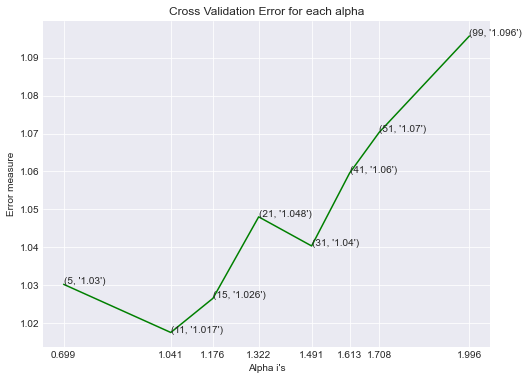

--------------------------------------------------------------------------------
Value of best alpha : 11
--------------------------------------------------------------------------------
Execution time : 0.5949349000002258
--------------------------------------------------------------------------------
For values of best alpha =  11 The train log loss is: 0.635266993905844
For values of best alpha =  11 The cross validation log loss is: 1.0174736136452862
For values of best alpha =  11 The test log loss is: 1.0305850675889354
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


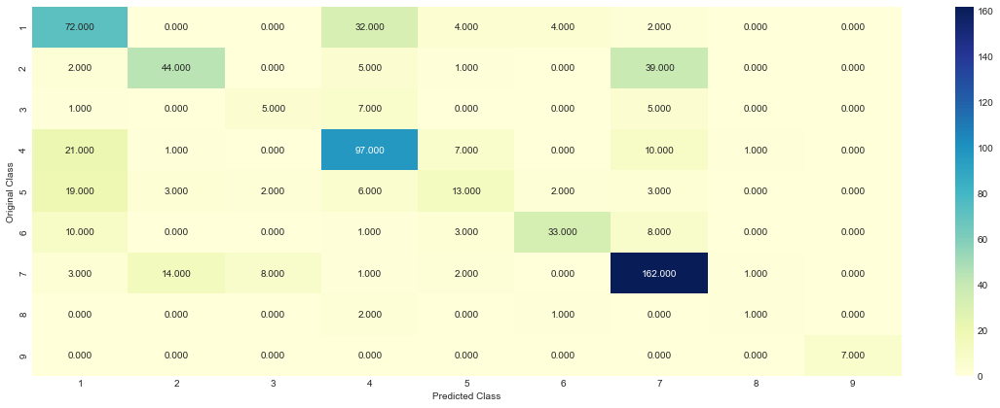



======================================== Precision matrix (Columm Sum=1)  ====================


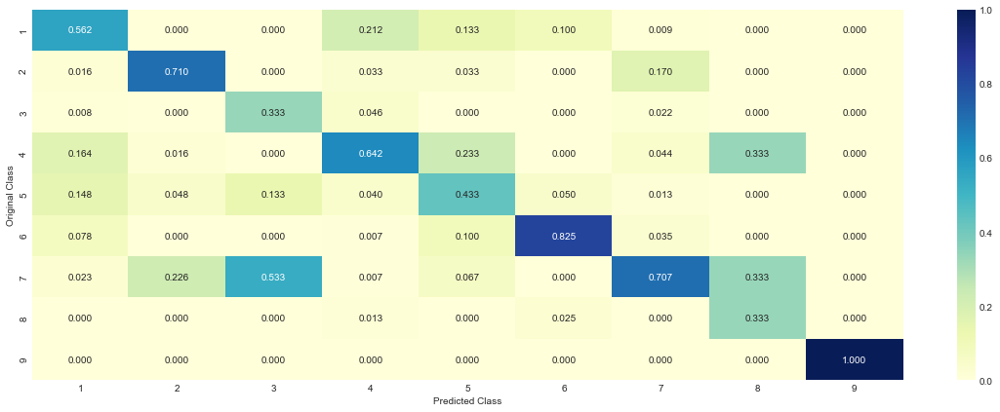



======================================== Recall matrix (Row sum=1)  ====================


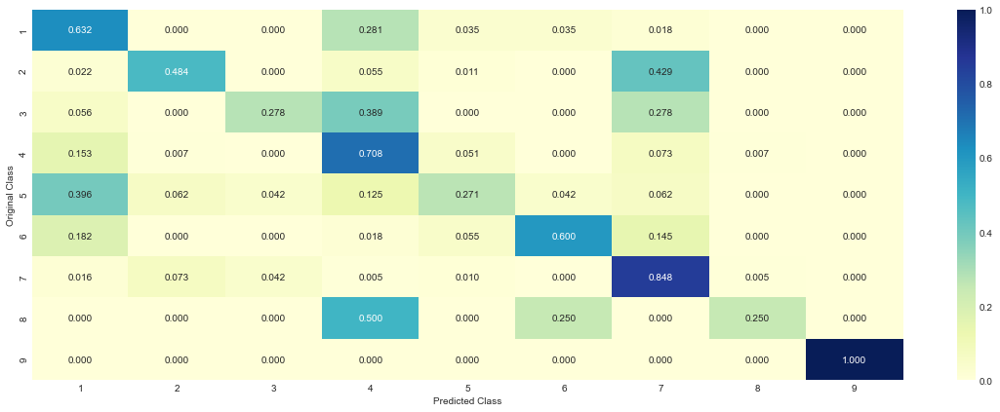

--------------------------------------------------------------------------------
Log_Loss : 1.031
Accuracy : 0.653
AUC score : 0.903
Precision : 0.650
Recall : 0.653
F1_score : 0.643
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3473684210526316 %


Analyzing K-Nearest Neighbours Model using 'BOW 1-gram' Approach:-


for alpha = 5
Log Loss : 1.196198421909928
for alpha = 11
Log Loss : 1.2370473952269279
for alpha = 15
Log Loss : 1.2616230109305226
for alpha = 21
Log Loss : 1.3036225237549122
for alpha = 31
Log Loss : 1.3796095473430208
for alpha = 41
Log Loss : 1.3451101375353445
for alpha = 51
Log Loss : 1.3639671469951469
for alpha = 99
Log Loss : 1.3932355812852215
--------------------------------------------------------------------------------


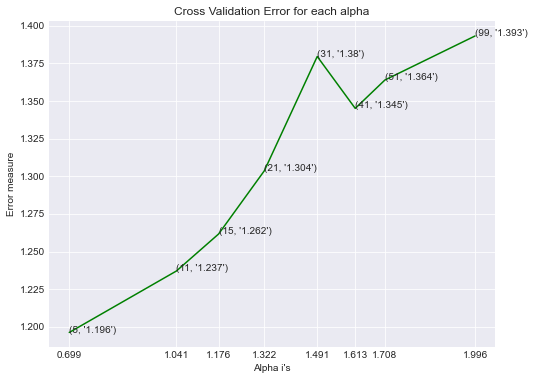

--------------------------------------------------------------------------------
Value of best alpha : 5
--------------------------------------------------------------------------------
Execution time : 16.59145829999943
--------------------------------------------------------------------------------
For values of best alpha =  5 The train log loss is: 0.9366429460104668
For values of best alpha =  5 The cross validation log loss is: 1.196198421909928
For values of best alpha =  5 The test log loss is: 1.2338726079270323
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


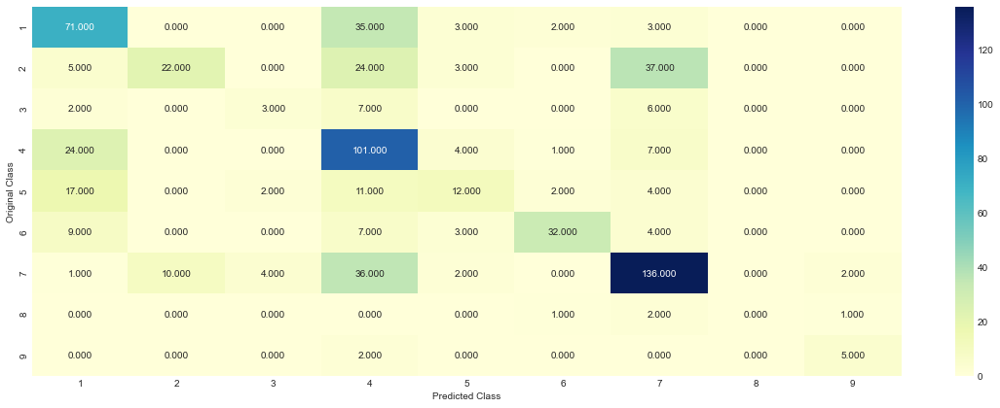



======================================== Precision matrix (Columm Sum=1)  ====================


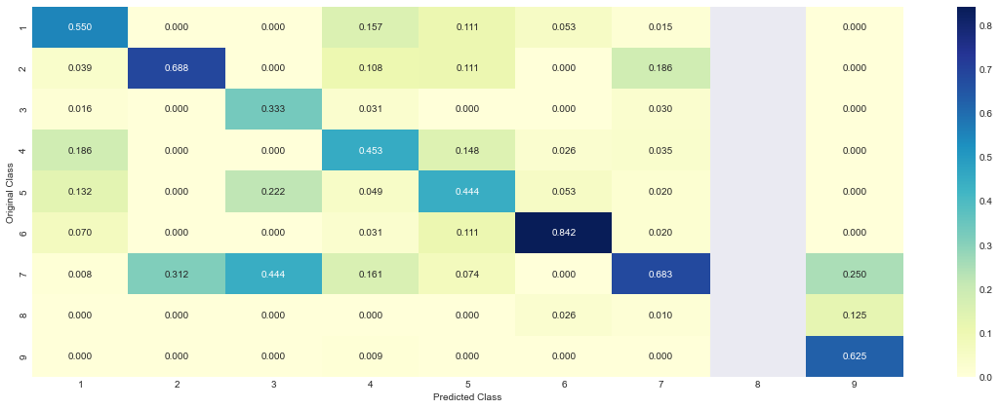



======================================== Recall matrix (Row sum=1)  ====================


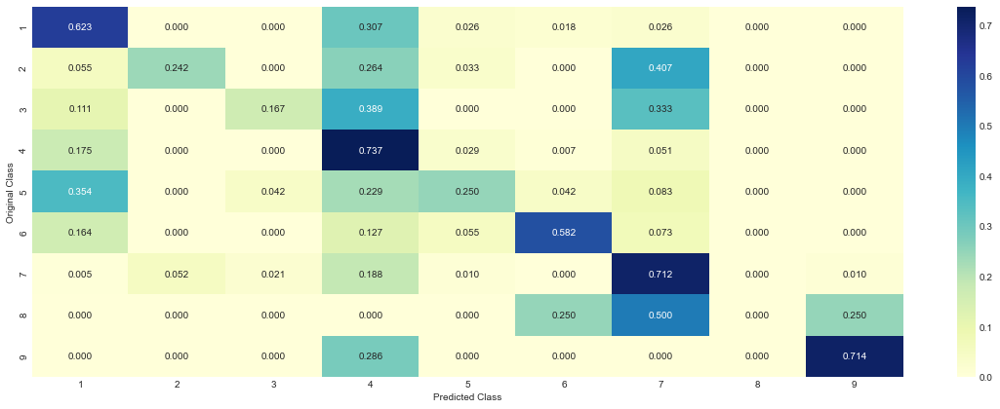

--------------------------------------------------------------------------------
Log_Loss : 1.234
Accuracy : 0.574
AUC score : 0.865
Precision : 0.595
Recall : 0.574
F1_score : 0.558
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.4255639097744361 %


Analyzing K-Nearest Neighbours Model using 'TF-IDF 1-gram' Approach:-


for alpha = 5
Log Loss : 1.0522585021123028
for alpha = 11
Log Loss : 1.07700045808213
for alpha = 15
Log Loss : 1.0888195583526017
for alpha = 21
Log Loss : 1.1140356233449242
for alpha = 31
Log Loss : 1.1507843055889964
for alpha = 41
Log Loss : 1.1729991631399588
for alpha = 51
Log Loss : 1.1871735202626208
for alpha = 99
Log Loss : 1.2199463753226467
--------------------------------------------------------------------------------


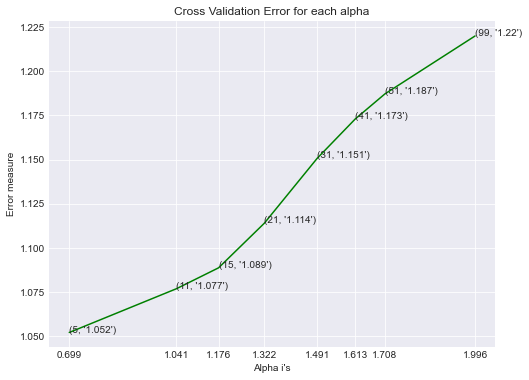

--------------------------------------------------------------------------------
Value of best alpha : 5
--------------------------------------------------------------------------------
Execution time : 16.21691930000088
--------------------------------------------------------------------------------
For values of best alpha =  5 The train log loss is: 0.83916877184472
For values of best alpha =  5 The cross validation log loss is: 1.0522585021123028
For values of best alpha =  5 The test log loss is: 1.0752619156591698
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


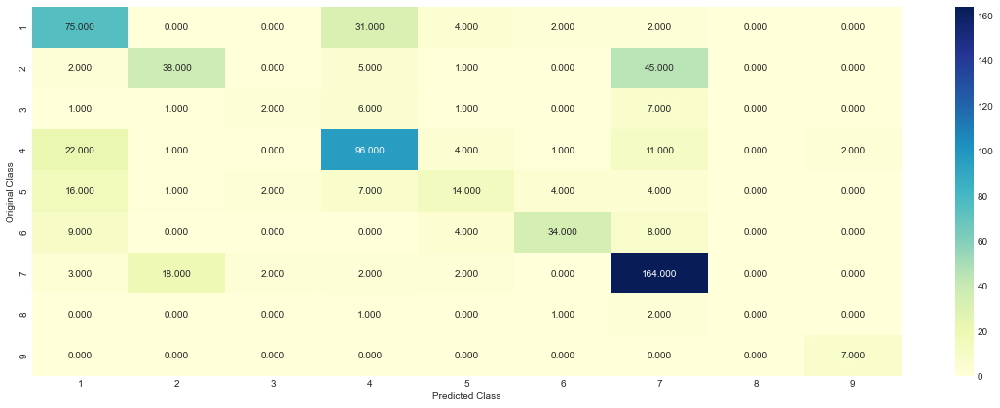



======================================== Precision matrix (Columm Sum=1)  ====================


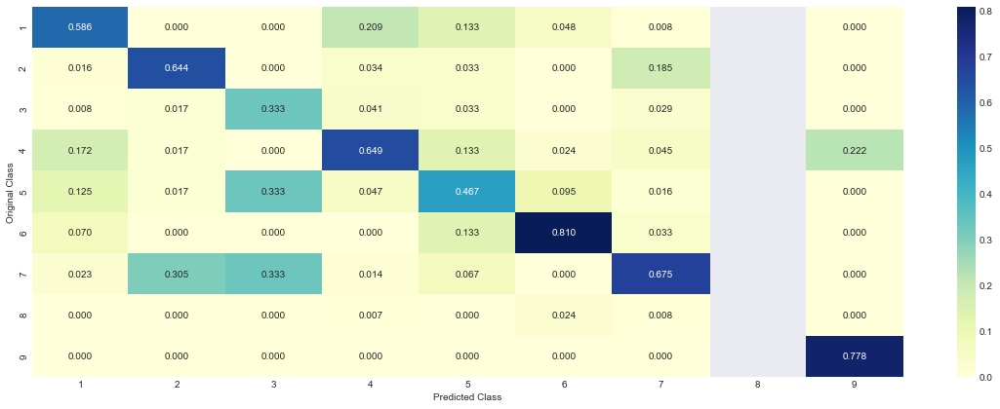



======================================== Recall matrix (Row sum=1)  ====================


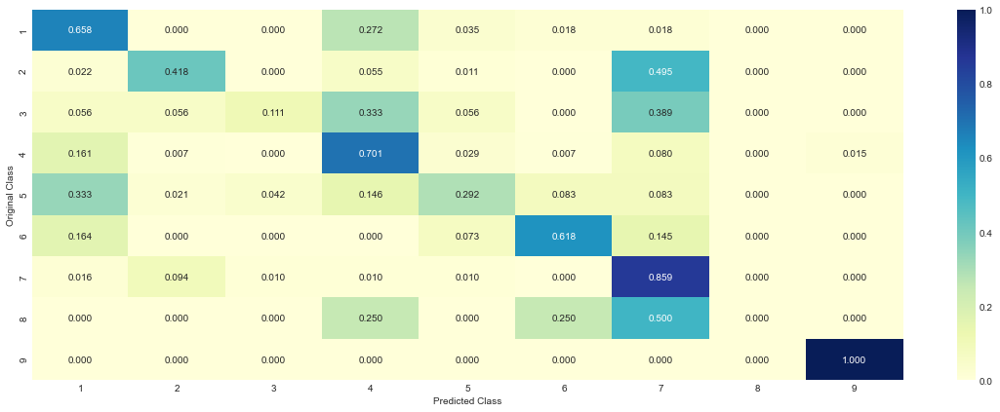

--------------------------------------------------------------------------------
Log_Loss : 1.075
Accuracy : 0.647
AUC score : 0.892
Precision : 0.634
Recall : 0.647
F1_score : 0.629
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3533834586466165 %




In [155]:
# Fit and Evaluate K-NN Model
model_nm = 'K-Nearest Neighbours'
#vectorization = 'Response Coding'
#Result_final = Result_final.append(train_KNN(train_x_responseCoding, train_y, cv_x_responseCoding, cv_y, test_x_responseCoding, test_y, model_nm, vectorization),ignore_index = True)
#,'TF-IDF 2-gram'
for vectorization in ['Response Coding','BOW 1-gram','TF-IDF 1-gram']: 
    if vectorization == 'Response Coding':
        Result_final = Result_final.append(train_KNN(train_x_responseCoding, train_y, cv_x_responseCoding, cv_y, test_x_responseCoding, test_y, model_nm, vectorization),ignore_index = True)
    elif vectorization == 'BOW 1-gram':
        Result_final = Result_final.append(train_KNN(train_x_onehotCoding, train_y, cv_x_onehotCoding, cv_y, test_x_onehotCoding, test_y, model_nm, vectorization),ignore_index = True)
    else:
        Result_final = Result_final.append(train_KNN(train_x_tfidf_uni, train_y, cv_x_tfidf_uni, cv_y, test_x_tfidf_uni, test_y, model_nm, vectorization),ignore_index = True)
#     else:
#         Result_final = Result_final.append(train_KNN(train_x_tfidf_bi, train_y, cv_x_tfidf_bi, cv_y, test_x_tfidf_bi, test_y, model_nm, vectorization),ignore_index = True)

<h2>7.4 Logistic Regression</h2>

In [156]:
def train_LR(train_x, train_y, cv_x, cv_y, test_x, test_y, class_weight, model_nm, vectorization):
    
    print("Analyzing {} Model using '{}' Approach:-".format(model_nm, vectorization))
    print("\n")
    # hyper parameter tuning
    alpha = [10 ** x for x in range(-6, 3)]

    cv_log_error_array = []
    
    for i in alpha:
        print("for alpha =", i)
        clf = SGDClassifier(class_weight= class_weight, alpha=i, penalty='l2', loss='log', random_state=42)
        clf.fit(train_x, train_y)
        
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(train_x, train_y)
        
        sig_clf_probs = sig_clf.predict_proba(cv_x)
        
        cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
        print("Log Loss :",log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15)) 

    print("--"*40)

    # plot the log-error for each alpha
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    fig, ax = plt.subplots(figsize=(8,6))
    ax.plot(np.log10(alpha), cv_log_error_array, c='g')
    for i, txt in enumerate(np.round(cv_log_error_array,3)):
        ax.annotate((alpha[i],str(txt)), (np.log10(alpha[i]),cv_log_error_array[i]))
    plt.xticks(np.log10(alpha))
    plt.title("Cross Validation Error for each alpha")
    plt.xlabel("Alpha i's")
    plt.ylabel("Error measure")
    plt.show()

    print("--"*40)

    # get the value of best alpha
    best_alpha = np.argmin(cv_log_error_array)
    print('Value of best alpha :', alpha[best_alpha])

    print("--"*40)


    start_time = time.clock()

    # retrain the model using best alpha
    clf = SGDClassifier(class_weight= class_weight, alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
    clf.fit(train_x, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x, train_y)

    # predict the log_loss using best alpha
    predict_y_test = sig_clf.predict(test_x)
    predict_probs_y_test = sig_clf.predict_proba(test_x)

    # compute execution time
    run_time_lr = time.clock() - start_time
    print("Execution time :", run_time_lr)
    print("--"*40)

    predict_probs_y_train = sig_clf.predict_proba(train_x)
    print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(train_y, predict_probs_y_train, labels=clf.classes_, eps=1e-15))

    predict_probs_y_cv = sig_clf.predict_proba(cv_x)
    print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(cv_y, predict_probs_y_cv, labels=clf.classes_, eps=1e-15))

    print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(test_y, predict_probs_y_test, labels=clf.classes_, eps=1e-15))

    print("--"*40)

    # plot the confusion matrix, precision matrix and recall matrix.
    Cls_Mod.plot_confusion_matrix(y_test, predict_y_test, class_labels)
    print("--"*40)

    # complete model evaluation
    accuracy_lr, precision_lr, recall_lr, f1_lr, Lg_Loss_lr, auc_score_lr = Cls_Mod.get_model_eval_metrics(test_y, predict_y_test, predict_probs_y_test, 'weighted')
    print("--"*40)

    # number of miss-classified points
    misclassified_lr = np.count_nonzero(predict_y_test - test_y)/test_y.shape[0]
    print("Percentage of misclassified points :", misclassified_lr, "%")
    print("=="*40)
    print("\n")

    # Save the results of the model
    Result_lr = pd.DataFrame([{'Model': model_nm,
                              'Text_Preprocessing' : vectorization,
                              'Log_Loss' : Lg_Loss_lr,
                              'Accuracy': accuracy_lr,
                              'AUC' : auc_score_lr,
                              'Precision': precision_lr, 
                              'Recall': recall_lr,
                              'F1-score': f1_lr,
                              'Execution_Time' : run_time_lr,
                              'Percentage_Missclassified' : misclassified_lr}])
    
    return Result_lr

<h3>7.4.1 With Class balancing</h3>

Analyzing Logistic Regression Balanced Classes Model using 'Response Coding' Approach:-


for alpha = 1e-06
Log Loss : 1.0826642473196326
for alpha = 1e-05
Log Loss : 1.0179229250747943
for alpha = 0.0001
Log Loss : 1.0465233059645822
for alpha = 0.001
Log Loss : 1.1346827850439896
for alpha = 0.01
Log Loss : 1.2114993341529106
for alpha = 0.1
Log Loss : 1.2308004800010757
for alpha = 1
Log Loss : 1.2950924499713574
for alpha = 10
Log Loss : 1.5212098187591803
for alpha = 100
Log Loss : 1.5671831141520614
--------------------------------------------------------------------------------


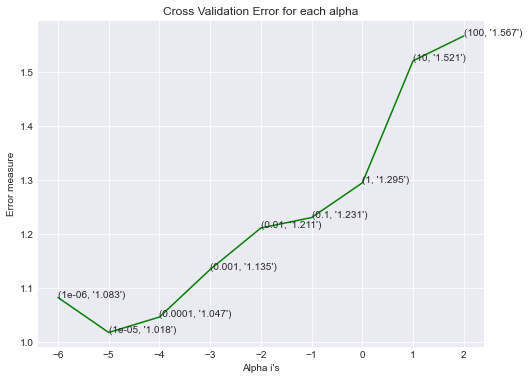

--------------------------------------------------------------------------------
Value of best alpha : 1e-05
--------------------------------------------------------------------------------
Execution time : 1.1404500999997254
--------------------------------------------------------------------------------
For values of best alpha =  1e-05 The train log loss is: 0.6294769025123391
For values of best alpha =  1e-05 The cross validation log loss is: 1.0179229250747943
For values of best alpha =  1e-05 The test log loss is: 1.0355160134018593
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


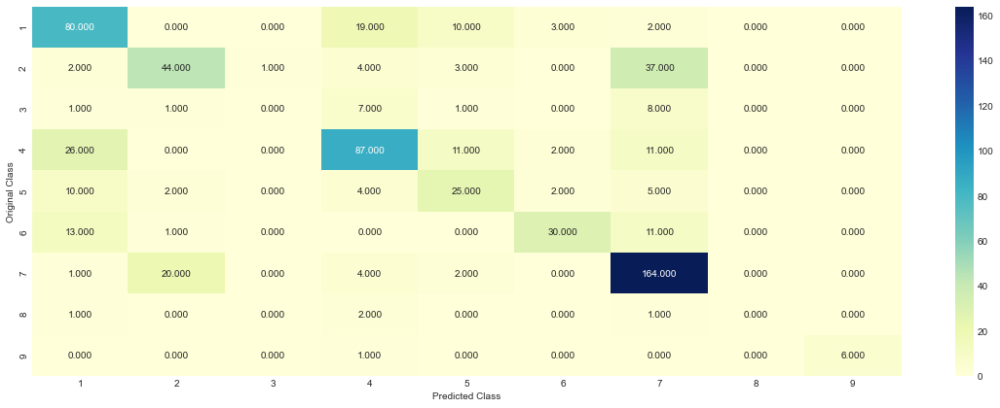



======================================== Precision matrix (Columm Sum=1)  ====================


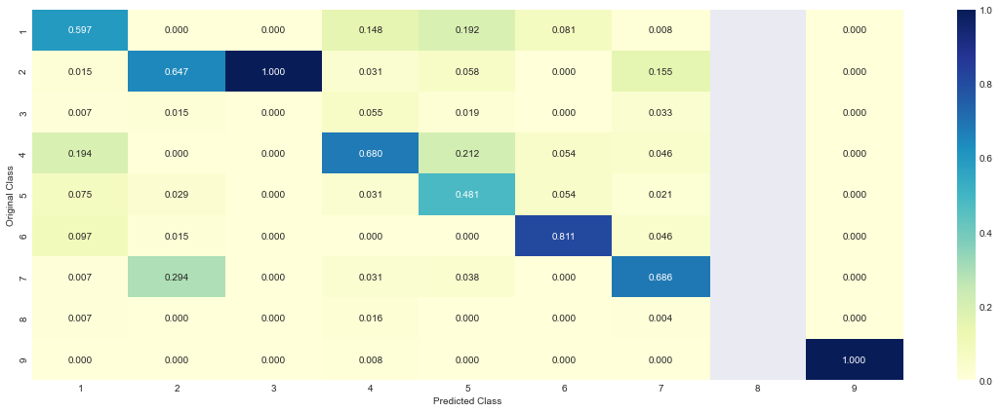



======================================== Recall matrix (Row sum=1)  ====================


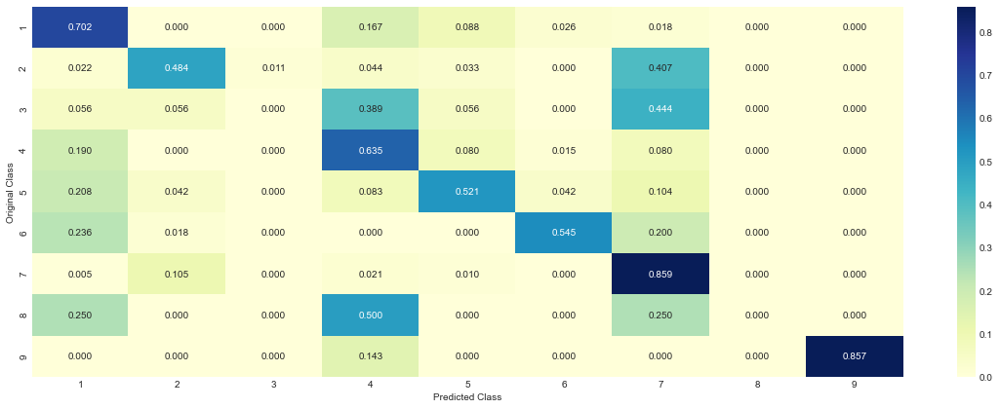

--------------------------------------------------------------------------------
Log_Loss : 1.036
Accuracy : 0.656
AUC score : 0.898
Precision : 0.640
Recall : 0.656
F1_score : 0.640
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3443609022556391 %


Analyzing Logistic Regression Balanced Classes Model using 'BOW 1-gram' Approach:-


for alpha = 1e-06
Log Loss : 1.2920162277608747
for alpha = 1e-05
Log Loss : 1.223252190262528
for alpha = 0.0001
Log Loss : 1.0085420576393171
for alpha = 0.001
Log Loss : 0.9677659575843041
for alpha = 0.01
Log Loss : 1.0603887519393993
for alpha = 0.1
Log Loss : 1.3892963106825682
for alpha = 1
Log Loss : 1.6256213622982358
for alpha = 10
Log Loss : 1.6565872345073862
for alpha = 100
Log Loss : 1.6599486619500985
--------------------------------------------------------------------------------


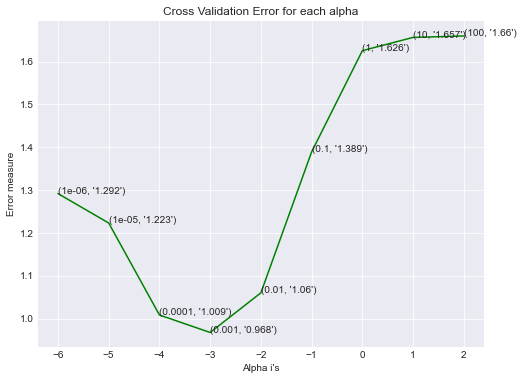

--------------------------------------------------------------------------------
Value of best alpha : 0.001
--------------------------------------------------------------------------------
Execution time : 12.057947400000558
--------------------------------------------------------------------------------
For values of best alpha =  0.001 The train log loss is: 0.535365104046666
For values of best alpha =  0.001 The cross validation log loss is: 0.9677659575843041
For values of best alpha =  0.001 The test log loss is: 1.0292979043939
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


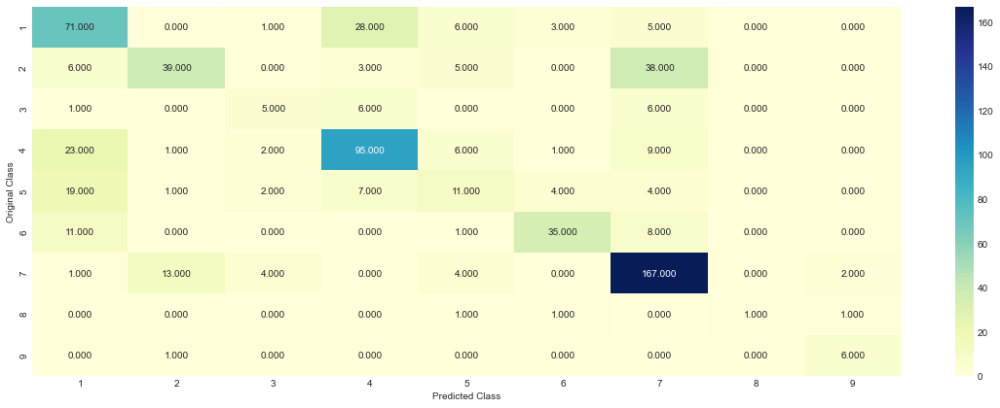



======================================== Precision matrix (Columm Sum=1)  ====================


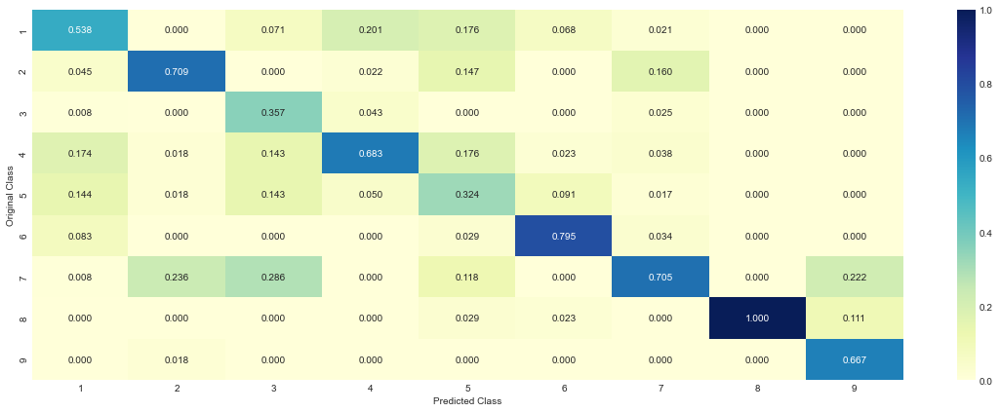



======================================== Recall matrix (Row sum=1)  ====================


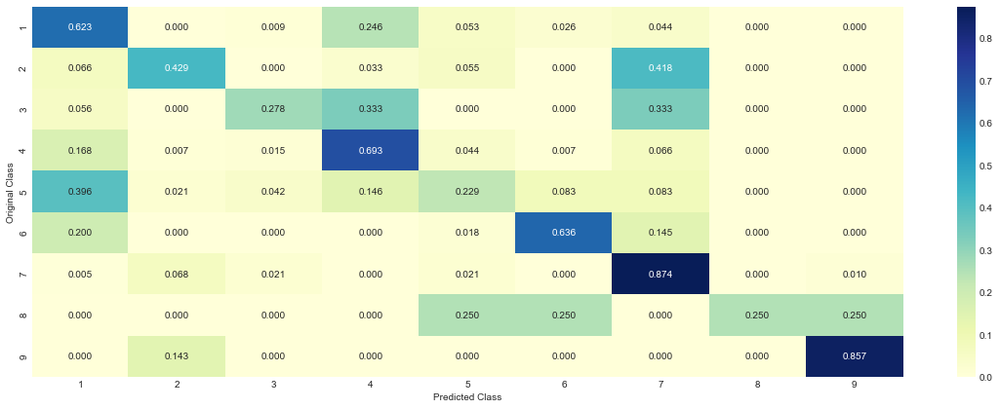

--------------------------------------------------------------------------------
Log_Loss : 1.029
Accuracy : 0.647
AUC score : 0.901
Precision : 0.644
Recall : 0.647
F1_score : 0.635
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3533834586466165 %


Analyzing Logistic Regression Balanced Classes Model using 'TF-IDF 1-gram' Approach:-


for alpha = 1e-06
Log Loss : 1.0343679710074927
for alpha = 1e-05
Log Loss : 0.9223275871059747
for alpha = 0.0001
Log Loss : 0.8933839787424717
for alpha = 0.001
Log Loss : 0.970545631424711
for alpha = 0.01
Log Loss : 1.1424587751331754
for alpha = 0.1
Log Loss : 1.41001825111812
for alpha = 1
Log Loss : 1.5327200095724294
for alpha = 10
Log Loss : 1.5492883550587406
for alpha = 100
Log Loss : 1.551212253599275
--------------------------------------------------------------------------------


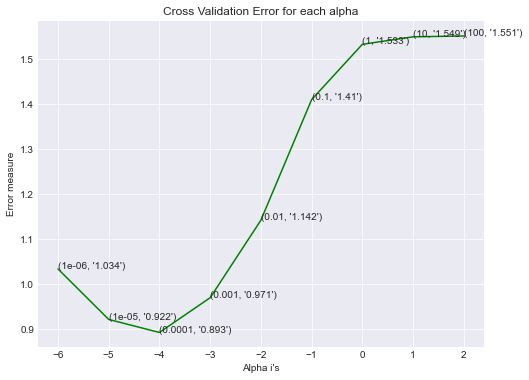

--------------------------------------------------------------------------------
Value of best alpha : 0.0001
--------------------------------------------------------------------------------
Execution time : 6.856926399999793
--------------------------------------------------------------------------------
For values of best alpha =  0.0001 The train log loss is: 0.3564071191208433
For values of best alpha =  0.0001 The cross validation log loss is: 0.8933839787424717
For values of best alpha =  0.0001 The test log loss is: 0.9068033972156491
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


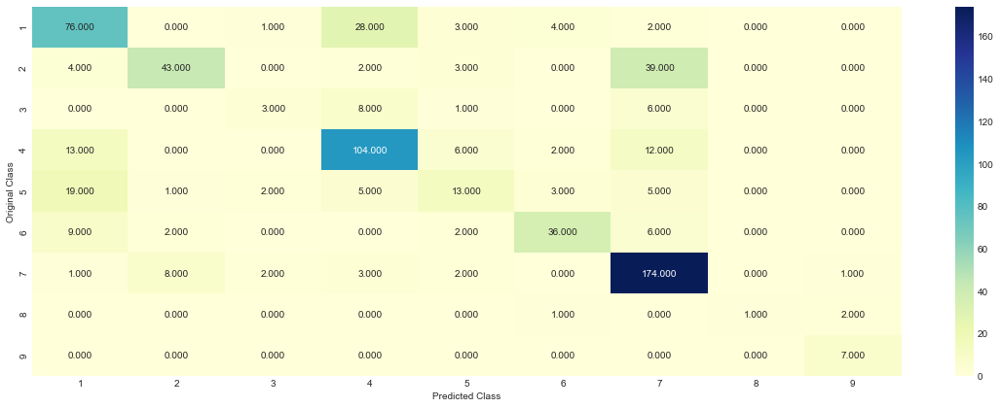



======================================== Precision matrix (Columm Sum=1)  ====================


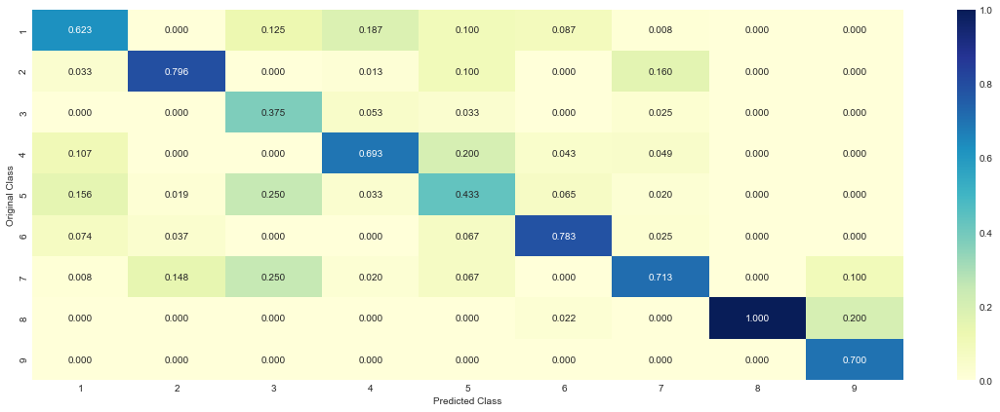



======================================== Recall matrix (Row sum=1)  ====================


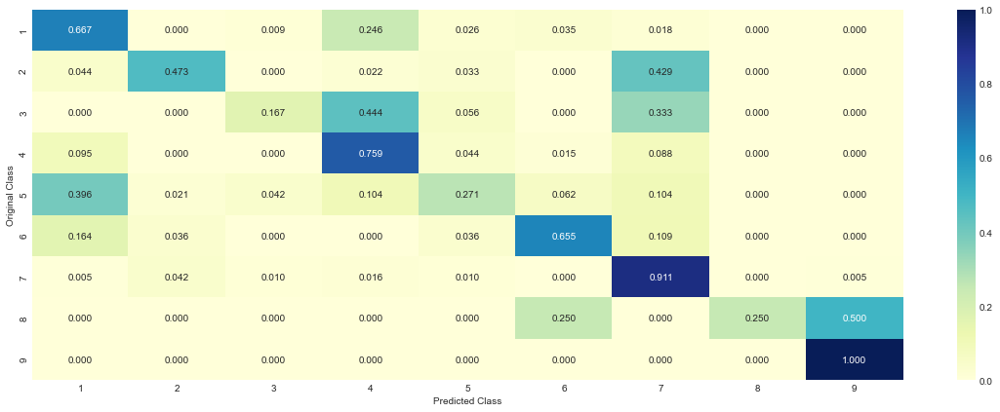

--------------------------------------------------------------------------------
Log_Loss : 0.907
Accuracy : 0.687
AUC score : 0.926
Precision : 0.683
Recall : 0.687
F1_score : 0.671
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.31278195488721805 %


Analyzing Logistic Regression Balanced Classes Model using 'TF-IDF 2-gram' Approach:-


for alpha = 1e-06
Log Loss : 1.0502028314070686
for alpha = 1e-05
Log Loss : 0.930947077305026
for alpha = 0.0001
Log Loss : 0.8920001737656151
for alpha = 0.001
Log Loss : 0.9676584526809192
for alpha = 0.01
Log Loss : 1.1209468755926308
for alpha = 0.1
Log Loss : 1.324048976927165
for alpha = 1
Log Loss : 1.4159003805604913
for alpha = 10
Log Loss : 1.429770737391168
for alpha = 100
Log Loss : 1.4314548147948067
--------------------------------------------------------------------------------


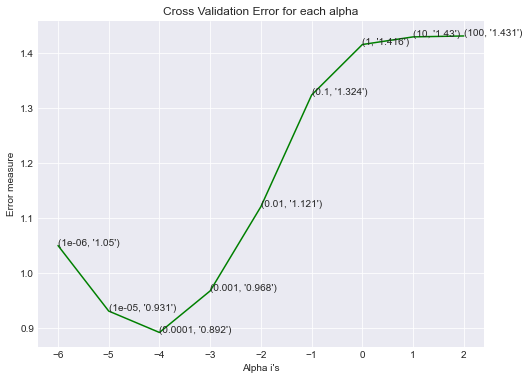

--------------------------------------------------------------------------------
Value of best alpha : 0.0001
--------------------------------------------------------------------------------
Execution time : 15.614128499997605
--------------------------------------------------------------------------------
For values of best alpha =  0.0001 The train log loss is: 0.35421276064650964
For values of best alpha =  0.0001 The cross validation log loss is: 0.8920001737656151
For values of best alpha =  0.0001 The test log loss is: 0.9084223666874982
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


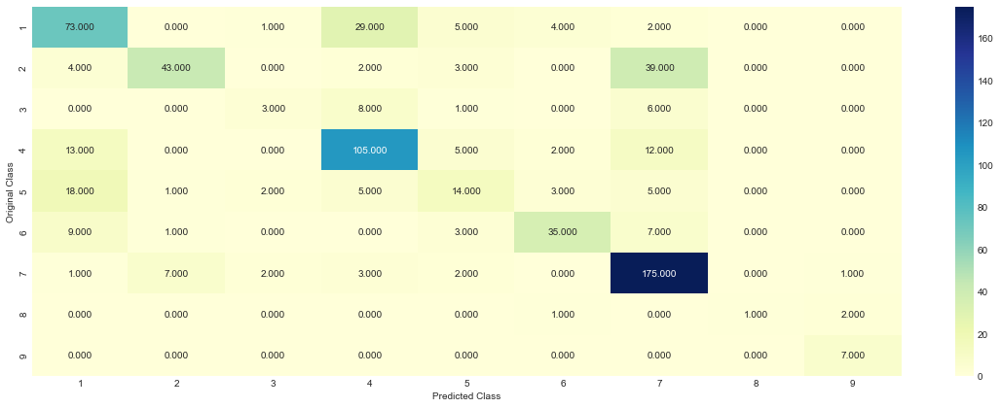



======================================== Precision matrix (Columm Sum=1)  ====================


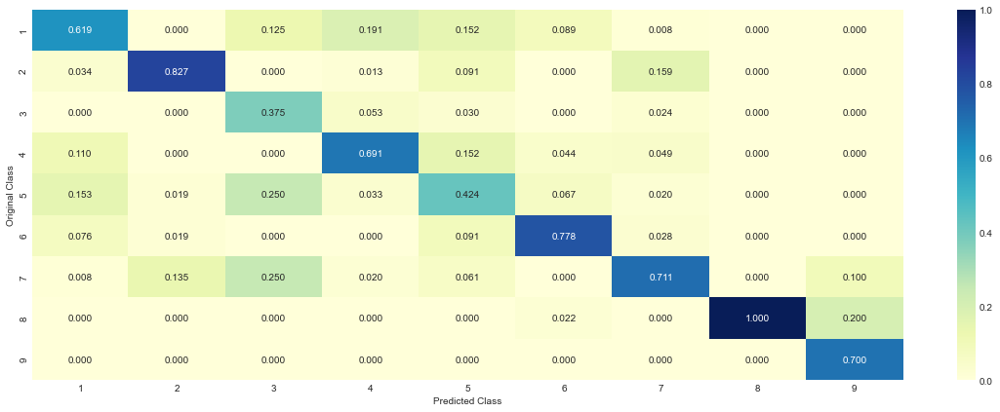



======================================== Recall matrix (Row sum=1)  ====================


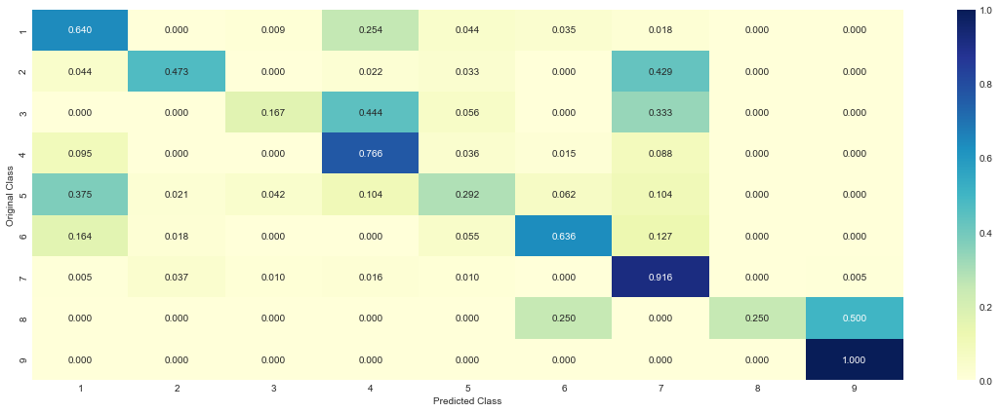

--------------------------------------------------------------------------------
Log_Loss : 0.908
Accuracy : 0.686
AUC score : 0.925
Precision : 0.684
Recall : 0.686
F1_score : 0.670
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3142857142857143 %




In [157]:
# Fit and Evaluate Logistic Regression Model
model_nm = 'Logistic Regression_Class Balanced '
class_weight = 'balanced'
for vectorization in ['Response Coding','BOW 1-gram','TF-IDF 1-gram','TF-IDF 2-gram']: 
    if vectorization == 'Response Coding':
        Result_final = Result_final.append(train_LR(train_x_responseCoding, train_y, cv_x_responseCoding, cv_y, test_x_responseCoding, test_y, class_weight, model_nm, vectorization),ignore_index = True)
    elif vectorization == 'BOW 1-gram':
        Result_final = Result_final.append(train_LR(train_x_onehotCoding, train_y, cv_x_onehotCoding, cv_y, test_x_onehotCoding, test_y, class_weight, model_nm, vectorization),ignore_index = True)
    elif vectorization == 'TF-IDF 1-gram':
        Result_final = Result_final.append(train_LR(train_x_tfidf_uni, train_y, cv_x_tfidf_uni, cv_y, test_x_tfidf_uni, test_y, class_weight, model_nm, vectorization),ignore_index = True)
    else:
        Result_final = Result_final.append(train_LR(train_x_tfidf_bi, train_y, cv_x_tfidf_bi, cv_y, test_x_tfidf_bi, test_y, class_weight, model_nm, vectorization),ignore_index = True)

### 7.4.2 Without Class balancing

Analyzing Logistic Regression Unbalanced Class Model using 'Response Coding' Approach:-


for alpha = 1e-06
Log Loss : 1.1037113274004662
for alpha = 1e-05
Log Loss : 1.0266987471029962
for alpha = 0.0001
Log Loss : 1.0569875394145671
for alpha = 0.001
Log Loss : 1.1392921652844705
for alpha = 0.01
Log Loss : 1.2095005455695484
for alpha = 0.1
Log Loss : 1.2603423021125768
for alpha = 1
Log Loss : 1.2831695220398276
for alpha = 10
Log Loss : 1.4253296672021
for alpha = 100
Log Loss : 1.4569717750086908
--------------------------------------------------------------------------------


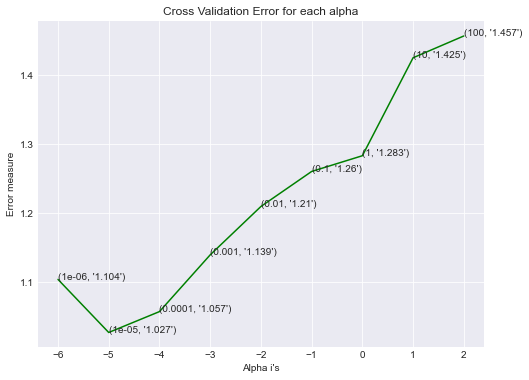

--------------------------------------------------------------------------------
Value of best alpha : 1e-05
--------------------------------------------------------------------------------
Execution time : 0.8637377000013657
--------------------------------------------------------------------------------
For values of best alpha =  1e-05 The train log loss is: 0.6278945260805131
For values of best alpha =  1e-05 The cross validation log loss is: 1.0266987471029962
For values of best alpha =  1e-05 The test log loss is: 1.0401719309919413
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


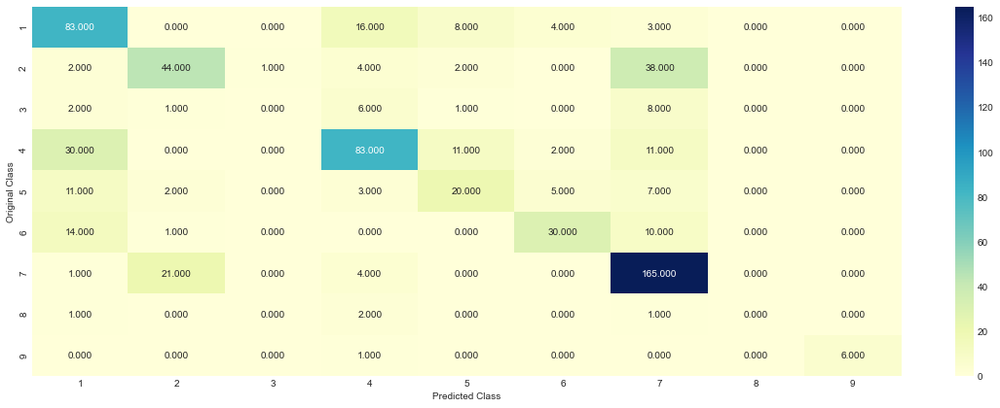



======================================== Precision matrix (Columm Sum=1)  ====================


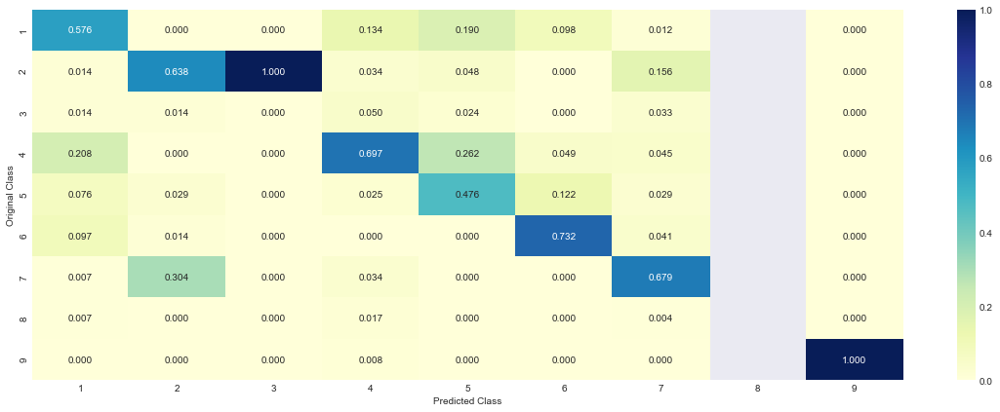



======================================== Recall matrix (Row sum=1)  ====================


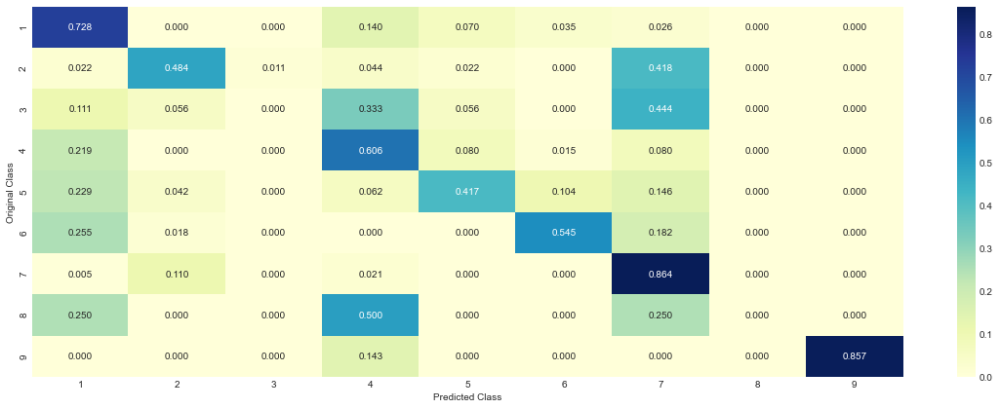

--------------------------------------------------------------------------------
Log_Loss : 1.040
Accuracy : 0.648
AUC score : 0.898
Precision : 0.630
Recall : 0.648
F1_score : 0.631
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3518796992481203 %


Analyzing Logistic Regression Unbalanced Class Model using 'BOW 1-gram' Approach:-


for alpha = 1e-06
Log Loss : 1.2604789456651386
for alpha = 1e-05
Log Loss : 1.197750713647665
for alpha = 0.0001
Log Loss : 1.009204218905771
for alpha = 0.001
Log Loss : 0.9757988072927802
for alpha = 0.01
Log Loss : 1.0905727350363421
for alpha = 0.1
Log Loss : 1.363206791753921
for alpha = 1
Log Loss : 1.5938360587724276
for alpha = 10
Log Loss : 1.627555365798949
for alpha = 100
Log Loss : 1.6312450419024045
--------------------------------------------------------------------------------


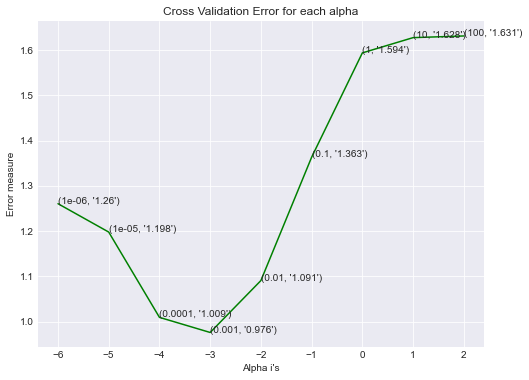

--------------------------------------------------------------------------------
Value of best alpha : 0.001
--------------------------------------------------------------------------------
Execution time : 11.622997700000269
--------------------------------------------------------------------------------
For values of best alpha =  0.001 The train log loss is: 0.5303504965558422
For values of best alpha =  0.001 The cross validation log loss is: 0.9757988072927802
For values of best alpha =  0.001 The test log loss is: 1.0387436539036083
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


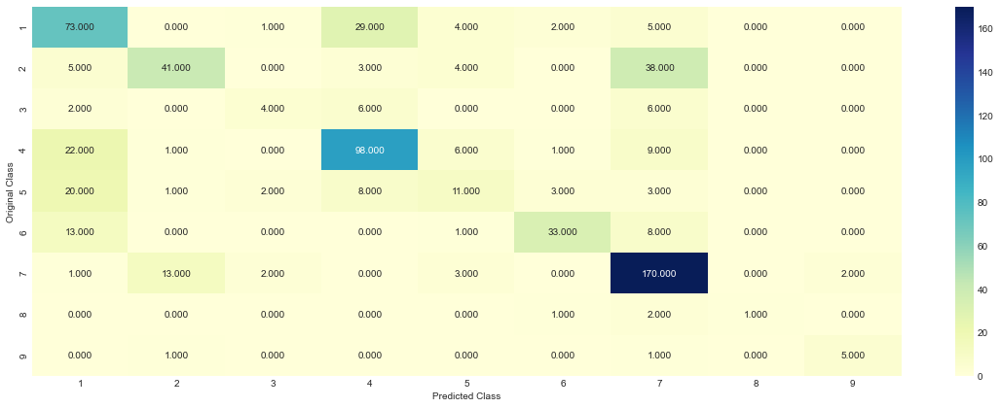



======================================== Precision matrix (Columm Sum=1)  ====================


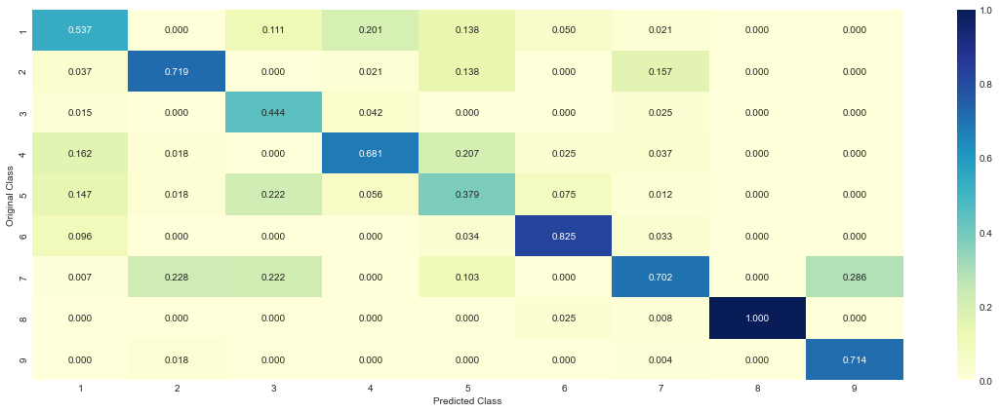



======================================== Recall matrix (Row sum=1)  ====================


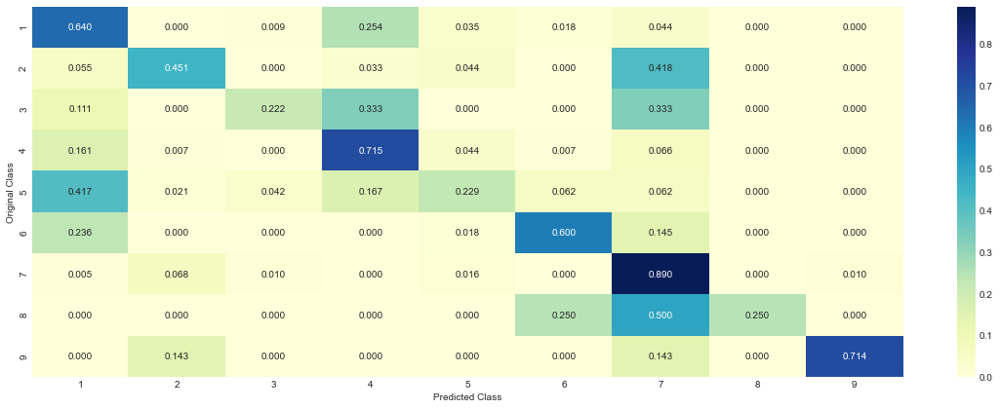

--------------------------------------------------------------------------------
Log_Loss : 1.039
Accuracy : 0.656
AUC score : 0.900
Precision : 0.654
Recall : 0.656
F1_score : 0.641
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3443609022556391 %


Analyzing Logistic Regression Unbalanced Class Model using 'TF-IDF 1-gram' Approach:-


for alpha = 1e-06
Log Loss : 1.0209807997614395
for alpha = 1e-05
Log Loss : 0.9296557282897251
for alpha = 0.0001
Log Loss : 0.8945200998349353
for alpha = 0.001
Log Loss : 0.9660411311628335
for alpha = 0.01
Log Loss : 1.147685259898742
for alpha = 0.1
Log Loss : 1.3507727567091714
for alpha = 1
Log Loss : 1.4618657257439254
for alpha = 10
Log Loss : 1.4783101084850783
for alpha = 100
Log Loss : 1.4802773997045144
--------------------------------------------------------------------------------


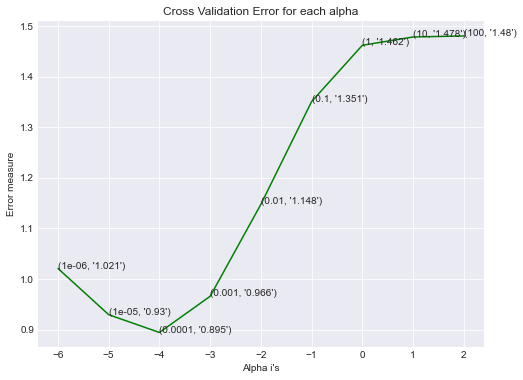

--------------------------------------------------------------------------------
Value of best alpha : 0.0001
--------------------------------------------------------------------------------
Execution time : 7.252269699998578
--------------------------------------------------------------------------------
For values of best alpha =  0.0001 The train log loss is: 0.3496065613388178
For values of best alpha =  0.0001 The cross validation log loss is: 0.8945200998349353
For values of best alpha =  0.0001 The test log loss is: 0.9078780647971756
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


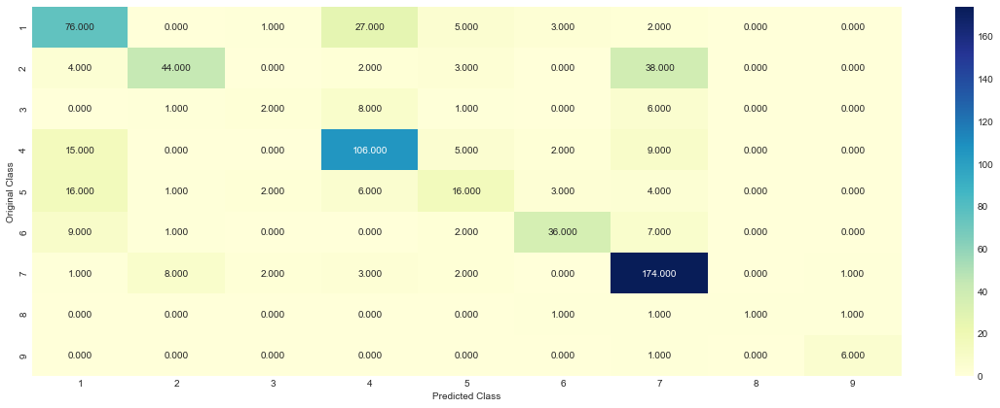



======================================== Precision matrix (Columm Sum=1)  ====================


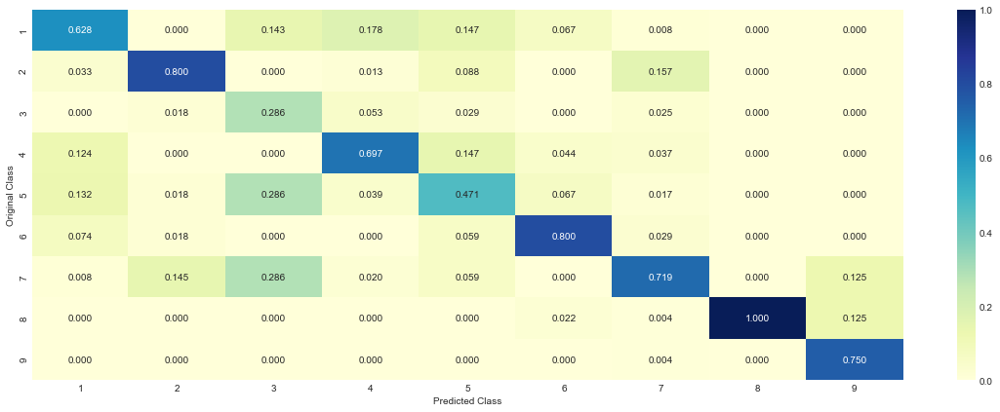



======================================== Recall matrix (Row sum=1)  ====================


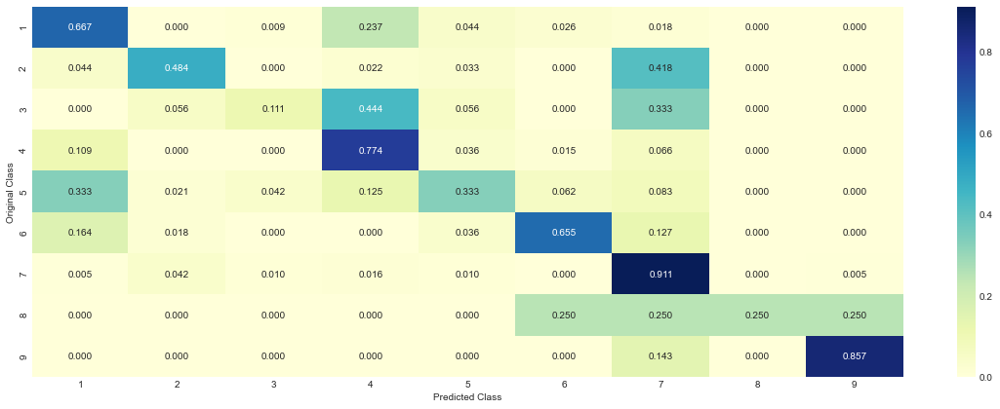

--------------------------------------------------------------------------------
Log_Loss : 0.908
Accuracy : 0.693
AUC score : 0.926
Precision : 0.689
Recall : 0.693
F1_score : 0.678
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3067669172932331 %


Analyzing Logistic Regression Unbalanced Class Model using 'TF-IDF 2-gram' Approach:-


for alpha = 1e-06
Log Loss : 1.0406387612969143
for alpha = 1e-05
Log Loss : 0.9316678128387923
for alpha = 0.0001
Log Loss : 0.8928969020706967
for alpha = 0.001
Log Loss : 0.9614290085884247
for alpha = 0.01
Log Loss : 1.1251639714132118
for alpha = 0.1
Log Loss : 1.2912811153874222
for alpha = 1
Log Loss : 1.3735671754552123
for alpha = 10
Log Loss : 1.3859189012971418
for alpha = 100
Log Loss : 1.3874125030733582
--------------------------------------------------------------------------------


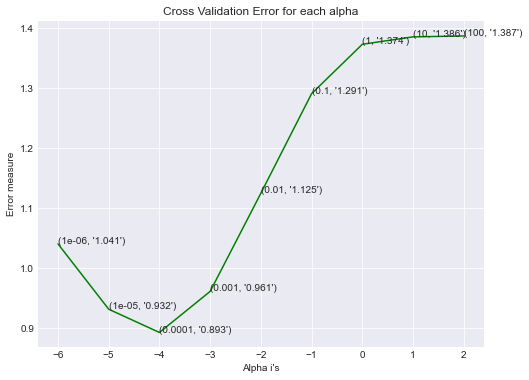

--------------------------------------------------------------------------------
Value of best alpha : 0.0001
--------------------------------------------------------------------------------
Execution time : 23.718982099999266
--------------------------------------------------------------------------------
For values of best alpha =  0.0001 The train log loss is: 0.3464429348685755
For values of best alpha =  0.0001 The cross validation log loss is: 0.8928969020706967
For values of best alpha =  0.0001 The test log loss is: 0.9088910198050898
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


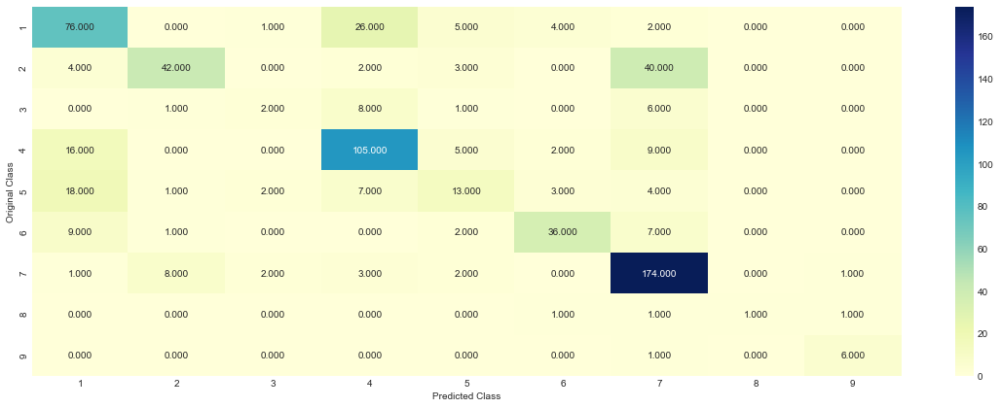



======================================== Precision matrix (Columm Sum=1)  ====================


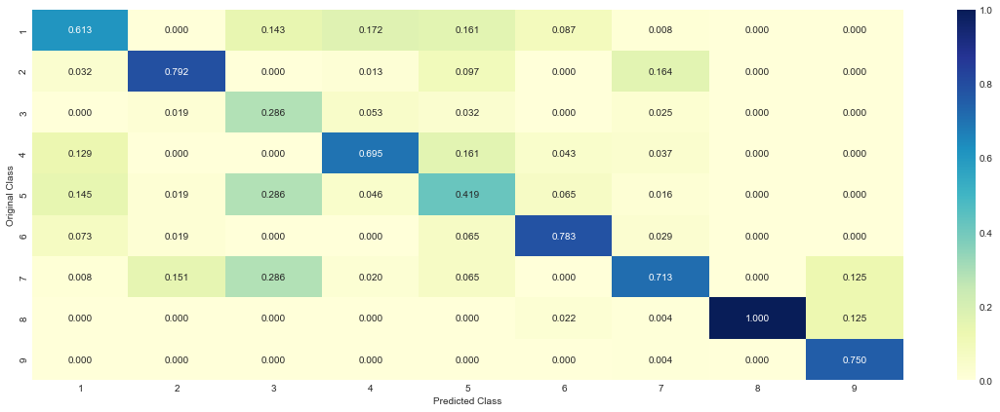



======================================== Recall matrix (Row sum=1)  ====================


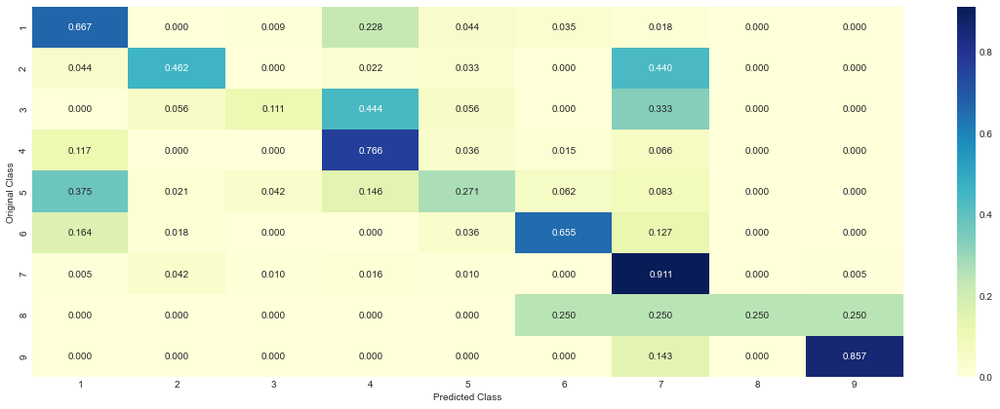

--------------------------------------------------------------------------------
Log_Loss : 0.909
Accuracy : 0.684
AUC score : 0.925
Precision : 0.678
Recall : 0.684
F1_score : 0.667
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3157894736842105 %




In [158]:
# Fit and Evaluate Logistic Regression Model
model_nm = 'Logistic Regression_Class Unbalanced '
class_weight = None
for vectorization in ['Response Coding','BOW 1-gram','TF-IDF 1-gram','TF-IDF 2-gram']: 
    if vectorization == 'Response Coding':
        Result_final = Result_final.append(train_LR(train_x_responseCoding, train_y, cv_x_responseCoding, cv_y, test_x_responseCoding, test_y, class_weight, model_nm, vectorization),ignore_index = True)
    elif vectorization == 'BOW 1-gram':
        Result_final = Result_final.append(train_LR(train_x_onehotCoding, train_y, cv_x_onehotCoding, cv_y, test_x_onehotCoding, test_y, class_weight, model_nm, vectorization),ignore_index = True)
    elif vectorization == 'TF-IDF 1-gram':
        Result_final = Result_final.append(train_LR(train_x_tfidf_uni, train_y, cv_x_tfidf_uni, cv_y, test_x_tfidf_uni, test_y, class_weight, model_nm, vectorization),ignore_index = True)
    else:
        Result_final = Result_final.append(train_LR(train_x_tfidf_bi, train_y, cv_x_tfidf_bi, cv_y, test_x_tfidf_bi, test_y, class_weight, model_nm, vectorization),ignore_index = True)

## 7.5 Linear Support Vector Machines

In [159]:
def train_SVM(train_x, train_y, cv_x, cv_y, test_x, test_y, model_nm, vectorization):
    
    print("Analyzing {} Model using '{}' Approach:-".format(model_nm, vectorization))
    print("\n")
    # hyper parameter tuning
    alpha = [10 ** x for x in range(-5, 3)]

    cv_log_error_array = []
    
    for i in alpha:
        print("for C =", i)
#         clf = SVC(C=i,kernel='linear',probability=True, class_weight='balanced')
        clf = SGDClassifier(class_weight='balanced', alpha=i, penalty='l2', loss='hinge', random_state=42)
        clf.fit(train_x, train_y)
        
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(train_x, train_y)
        
        sig_clf_probs = sig_clf.predict_proba(cv_x)
        
        cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
        print("Log Loss :",log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15)) 

    print("--"*40)

    # plot the log-error for each alpha
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    fig, ax = plt.subplots(figsize=(8,6))
    ax.plot(np.log10(alpha), cv_log_error_array, c='g')
    for i, txt in enumerate(np.round(cv_log_error_array,3)):
        ax.annotate((alpha[i],str(txt)), (np.log10(alpha[i]),cv_log_error_array[i]))
    plt.xticks(np.log10(alpha))
    plt.title("Cross Validation Error for each alpha")
    plt.xlabel("Alpha i's")
    plt.ylabel("Error measure")
    plt.show()

    print("--"*40)

    # get the value of best alpha
    best_alpha = np.argmin(cv_log_error_array)
    print('Value of best alpha :', alpha[best_alpha])

    print("--"*40)


    start_time = time.clock()

    # retrain the model using best alpha
#     clf = SVC(class_weight='balanced', C=alpha[best_alpha], kernel='linear', probability=True)
    clf = SGDClassifier(class_weight= 'balanced', alpha=alpha[best_alpha], penalty='l2', loss='hinge', random_state=42)
    clf.fit(train_x, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x, train_y)

    # predict the log_loss using best alpha
    predict_y_test = sig_clf.predict(test_x)
    predict_probs_y_test = sig_clf.predict_proba(test_x)

    # compute execution time
    run_time_svm = time.clock() - start_time
    print("Execution time :", run_time_svm)
    print("--"*40)

    predict_probs_y_train = sig_clf.predict_proba(train_x)
    print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(train_y, predict_probs_y_train, labels=clf.classes_, eps=1e-15))

    predict_probs_y_cv = sig_clf.predict_proba(cv_x)
    print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(cv_y, predict_probs_y_cv, labels=clf.classes_, eps=1e-15))

    print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(test_y, predict_probs_y_test, labels=clf.classes_, eps=1e-15))

    print("--"*40)

    # plot the confusion matrix, precision matrix and recall matrix.
    Cls_Mod.plot_confusion_matrix(y_test, predict_y_test, class_labels)
    print("--"*40)

    # complete model evaluation
    accuracy_svm, precision_svm, recall_svm, f1_svm, Lg_Loss_svm, auc_score_svm = Cls_Mod.get_model_eval_metrics(test_y, predict_y_test, predict_probs_y_test, 'weighted')
    print("--"*40)

    # number of miss-classified points
    misclassified_svm = np.count_nonzero(predict_y_test - test_y)/test_y.shape[0]
    print("Percentage of misclassified points :", misclassified_svm, "%")
    print("=="*40)
    print("\n")

    # Save the results of the model
    Result_svm = pd.DataFrame([{'Model': model_nm,
                              'Text_Preprocessing' : vectorization,
                              'Log_Loss' : Lg_Loss_svm,
                              'Accuracy': accuracy_svm,
                              'AUC' : auc_score_svm,
                              'Precision': precision_svm, 
                              'Recall': recall_svm,
                              'F1-score': f1_svm,
                              'Execution_Time' : run_time_svm,
                              'Percentage_Missclassified' : misclassified_svm}])
    return Result_svm

Analyzing SVM Model using 'Response Coding' Approach:-


for C = 1e-05
Log Loss : 1.0580458752973152
for C = 0.0001
Log Loss : 1.0688257143777555
for C = 0.001
Log Loss : 1.1185730131380143
for C = 0.01
Log Loss : 1.1188304134556184
for C = 0.1
Log Loss : 1.1173478895559688
for C = 1
Log Loss : 1.1200200342515187
for C = 10
Log Loss : 1.2094290363952909
for C = 100
Log Loss : 1.5806617428561556
--------------------------------------------------------------------------------


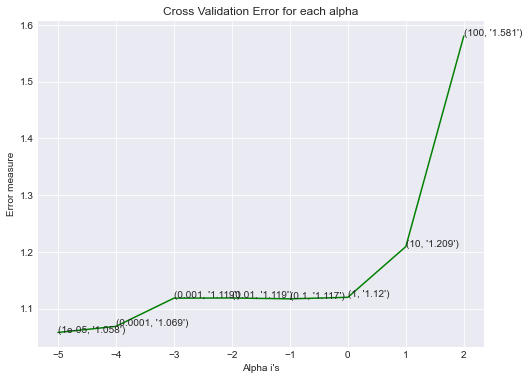

--------------------------------------------------------------------------------
Value of best alpha : 1e-05
--------------------------------------------------------------------------------
Execution time : 1.0866093000004184
--------------------------------------------------------------------------------
For values of best alpha =  1e-05 The train log loss is: 0.5492944104852349
For values of best alpha =  1e-05 The cross validation log loss is: 1.0580458752973152
For values of best alpha =  1e-05 The test log loss is: 1.0675347969622337
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


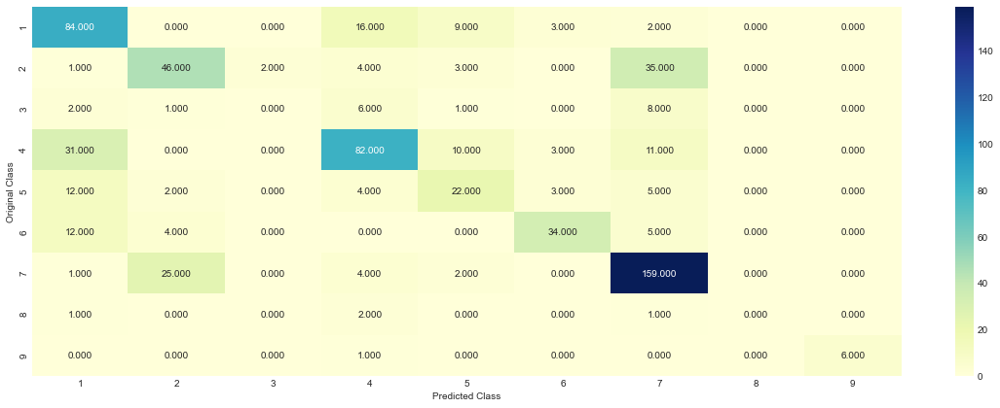



======================================== Precision matrix (Columm Sum=1)  ====================


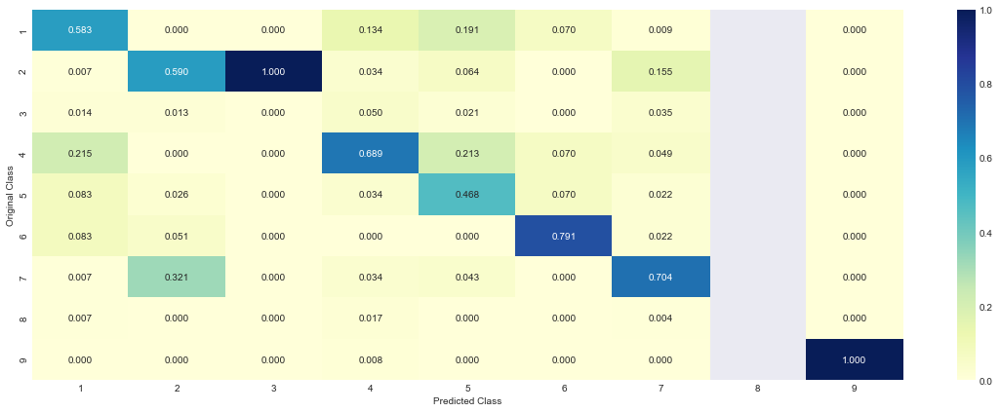



======================================== Recall matrix (Row sum=1)  ====================


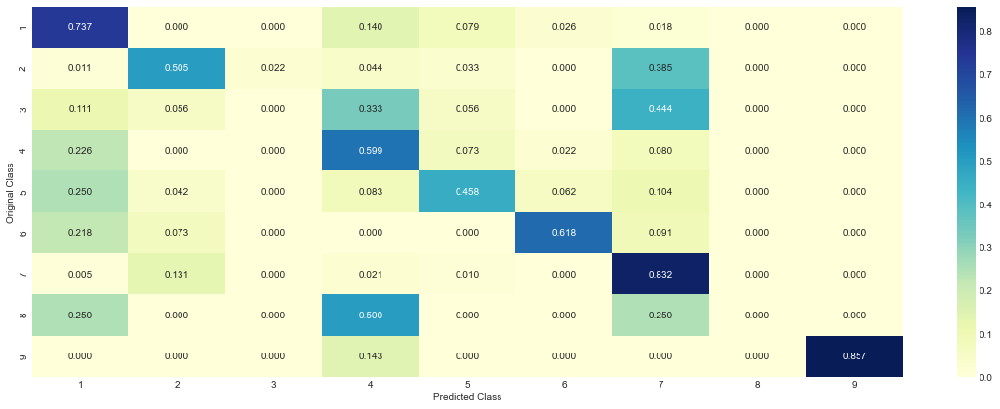

--------------------------------------------------------------------------------
Log_Loss : 1.068
Accuracy : 0.651
AUC score : 0.895
Precision : 0.634
Recall : 0.651
F1_score : 0.638
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.34887218045112783 %


Analyzing SVM Model using 'BOW 1-gram' Approach:-


for C = 1e-05
Log Loss : 1.2854511480234059
for C = 0.0001
Log Loss : 1.1922765040400067
for C = 0.001
Log Loss : 1.0801345660247599
for C = 0.01
Log Loss : 1.0966462107276664
for C = 0.1
Log Loss : 1.3292359202779154
for C = 1
Log Loss : 1.6511284524110117
for C = 10
Log Loss : 1.6605738528806266
for C = 100
Log Loss : 1.6605738804162238
--------------------------------------------------------------------------------


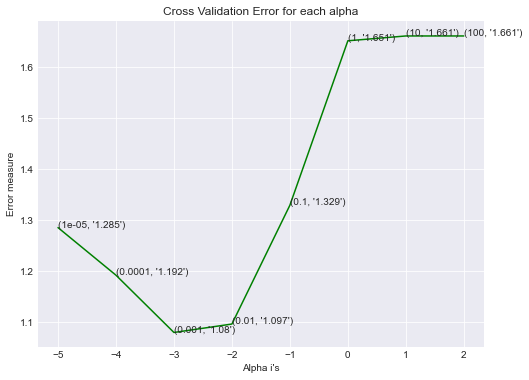

--------------------------------------------------------------------------------
Value of best alpha : 0.001
--------------------------------------------------------------------------------
Execution time : 14.923550900002738
--------------------------------------------------------------------------------
For values of best alpha =  0.001 The train log loss is: 0.5383038180799194
For values of best alpha =  0.001 The cross validation log loss is: 1.0801345660247599
For values of best alpha =  0.001 The test log loss is: 1.1001806249238064
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


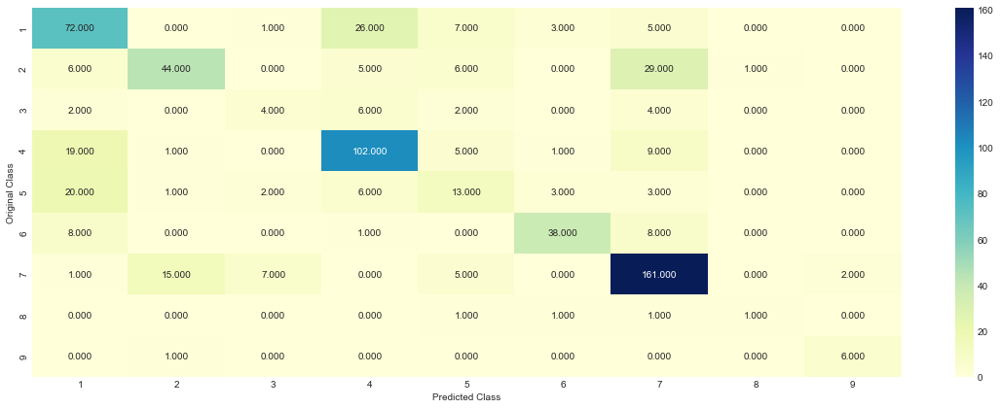



======================================== Precision matrix (Columm Sum=1)  ====================


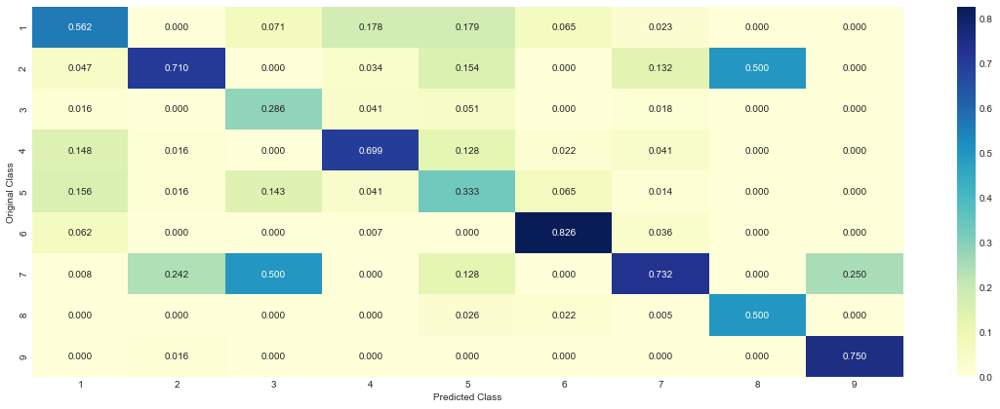



======================================== Recall matrix (Row sum=1)  ====================


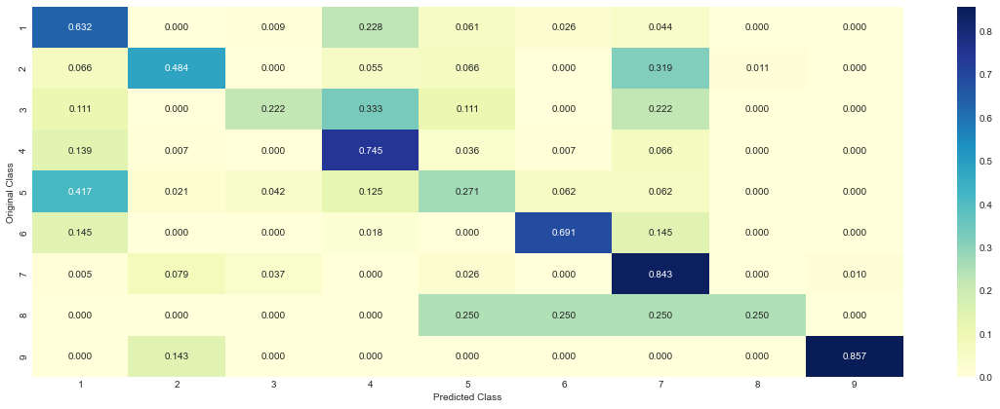

--------------------------------------------------------------------------------
Log_Loss : 1.100
Accuracy : 0.663
AUC score : 0.886
Precision : 0.659
Recall : 0.663
F1_score : 0.655
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3368421052631579 %


Analyzing SVM Model using 'TF-IDF 1-gram' Approach:-


for C = 1e-05
Log Loss : 1.0027362267184612
for C = 0.0001
Log Loss : 0.9384643949355176
for C = 0.001
Log Loss : 1.0144835953685727
for C = 0.01
Log Loss : 1.218891077343746
for C = 0.1
Log Loss : 1.4721386605817348
for C = 1
Log Loss : 1.5517114958760112
for C = 10
Log Loss : 1.5517117466692683
for C = 100
Log Loss : 1.5517117095439554
--------------------------------------------------------------------------------


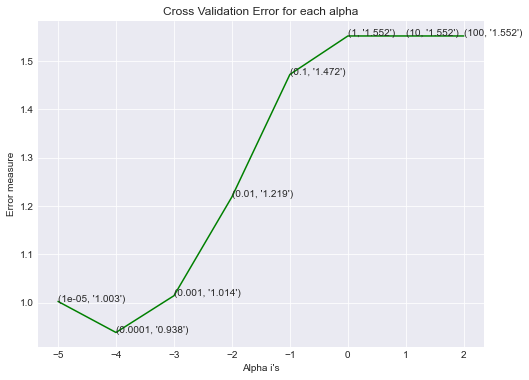

--------------------------------------------------------------------------------
Value of best alpha : 0.0001
--------------------------------------------------------------------------------
Execution time : 6.886153999999806
--------------------------------------------------------------------------------
For values of best alpha =  0.0001 The train log loss is: 0.3006875031592856
For values of best alpha =  0.0001 The cross validation log loss is: 0.9384643949355176
For values of best alpha =  0.0001 The test log loss is: 0.9581570479840005
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


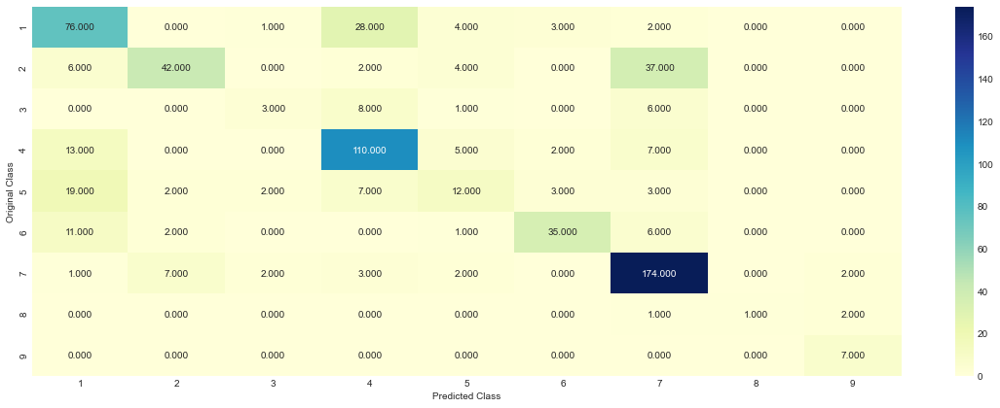



======================================== Precision matrix (Columm Sum=1)  ====================


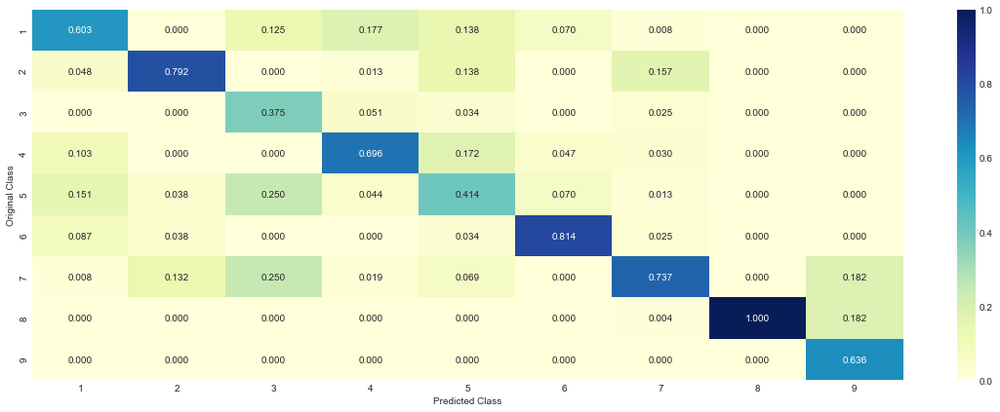



======================================== Recall matrix (Row sum=1)  ====================


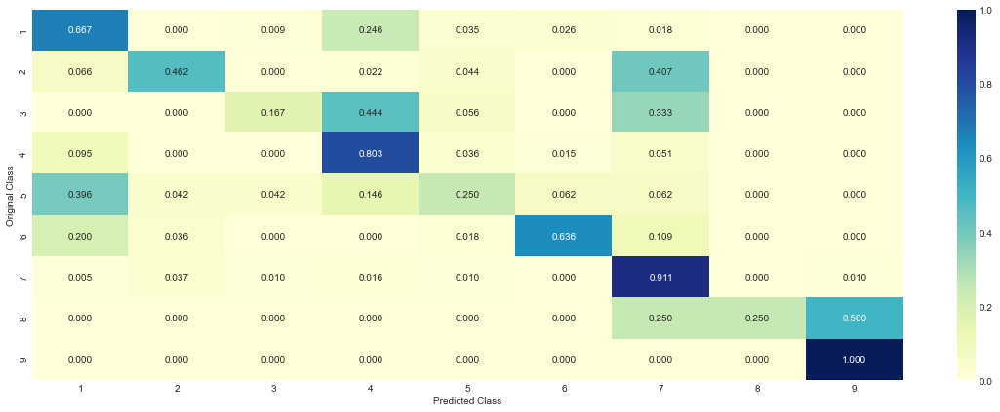

--------------------------------------------------------------------------------
Log_Loss : 0.958
Accuracy : 0.692
AUC score : 0.918
Precision : 0.687
Recall : 0.692
F1_score : 0.675
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3082706766917293 %


Analyzing SVM Model using 'TF-IDF 2-gram' Approach:-


for C = 1e-05
Log Loss : 1.0062425052908992
for C = 0.0001
Log Loss : 0.9404163977796715
for C = 0.001
Log Loss : 1.0152717350344174
for C = 0.01
Log Loss : 1.2213253588739406
for C = 0.1
Log Loss : 1.390362972199274
for C = 1
Log Loss : 1.4319409842349786
for C = 10
Log Loss : 1.431940733632308
for C = 100
Log Loss : 1.4319355677392702
--------------------------------------------------------------------------------


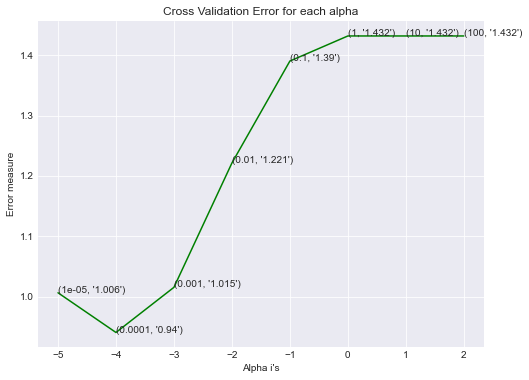

--------------------------------------------------------------------------------
Value of best alpha : 0.0001
--------------------------------------------------------------------------------
Execution time : 12.797248200000467
--------------------------------------------------------------------------------
For values of best alpha =  0.0001 The train log loss is: 0.3008572466621528
For values of best alpha =  0.0001 The cross validation log loss is: 0.9404163977796715
For values of best alpha =  0.0001 The test log loss is: 0.9655121513587367
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


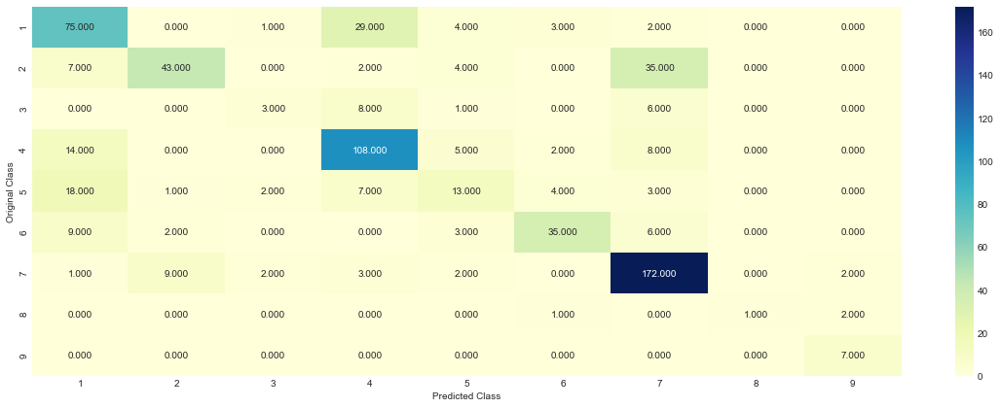



======================================== Precision matrix (Columm Sum=1)  ====================


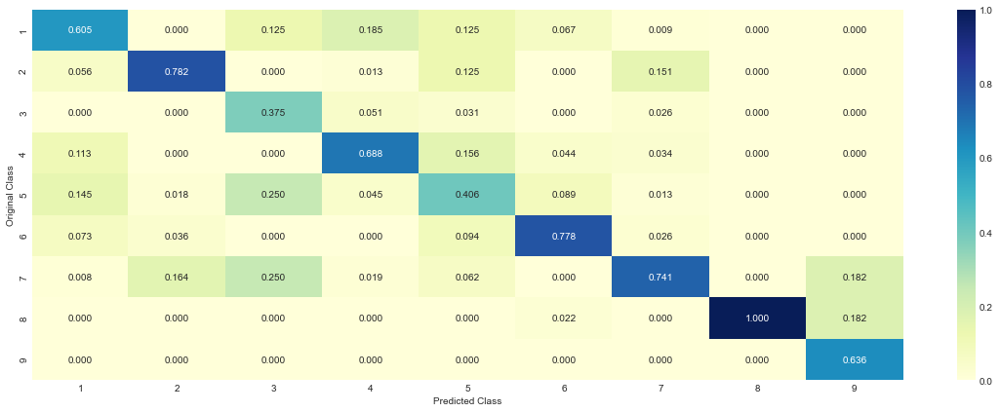



======================================== Recall matrix (Row sum=1)  ====================


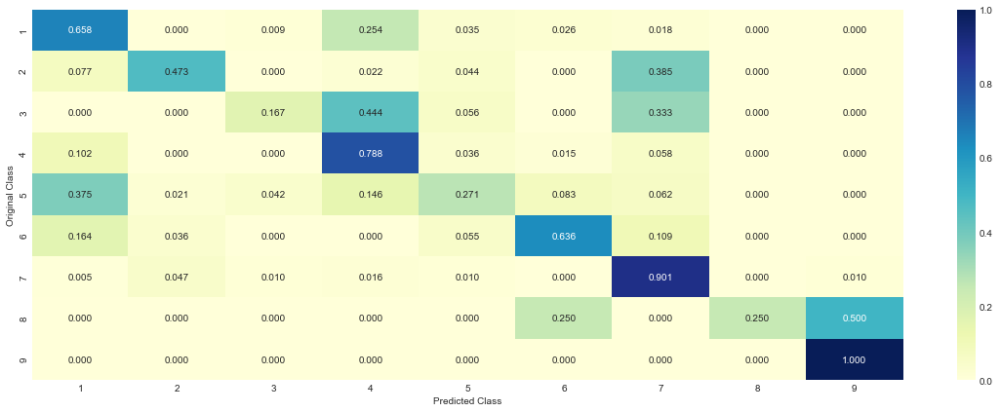

--------------------------------------------------------------------------------
Log_Loss : 0.966
Accuracy : 0.687
AUC score : 0.916
Precision : 0.682
Recall : 0.687
F1_score : 0.672
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.31278195488721805 %




In [160]:
# Fit and Evaluate Support Vector Machine Model
model_nm = 'SVM'
for vectorization in ['Response Coding','BOW 1-gram','TF-IDF 1-gram','TF-IDF 2-gram']: 
    if vectorization == 'Response Coding':
        Result_final = Result_final.append(train_SVM(train_x_responseCoding, train_y, cv_x_responseCoding, cv_y, test_x_responseCoding, test_y, model_nm, vectorization),ignore_index = True)
    elif vectorization == 'BOW 1-gram':
        Result_final = Result_final.append(train_SVM(train_x_onehotCoding, train_y, cv_x_onehotCoding, cv_y, test_x_onehotCoding, test_y, model_nm, vectorization),ignore_index = True)
    elif vectorization == 'TF-IDF 1-gram':
        Result_final = Result_final.append(train_SVM(train_x_tfidf_uni, train_y, cv_x_tfidf_uni, cv_y, test_x_tfidf_uni, test_y, model_nm, vectorization),ignore_index = True)
    else:
        Result_final = Result_final.append(train_SVM(train_x_tfidf_bi, train_y, cv_x_tfidf_bi, cv_y, test_x_tfidf_bi, test_y, model_nm, vectorization),ignore_index = True)

## 7.6 Random Forest Classifier

In [161]:
def train_RF(train_x, train_y, cv_x, cv_y, test_x, test_y, model_nm, vectorization):
    
    print("Analyzing {} Model using '{}' Approach:-".format(model_nm, vectorization))
    print("\n")
    # hyper parameter tuning
    n_estimators = [500,1000,1500,2000]
    max_depth = [5,8,10]

    cv_log_error_array = []
    
    for i in n_estimators:
        for j in max_depth:
            print("for n_estimators =", i, "and max depth = ", j)
            clf = RandomForestClassifier(n_estimators=i, criterion='gini', max_depth=j, random_state=42, n_jobs=-1)
            clf.fit(train_x, train_y)

            sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
            sig_clf.fit(train_x, train_y)

            sig_clf_probs = sig_clf.predict_proba(cv_x)

            cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
            print("Log Loss :",log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15)) 

    print("--"*40)

    # plot the log-error for each n_estimator and max_depth
#     fig, ax = plt.subplots(figsize=(8,6))
#     ax.plot(np.log10(alpha), cv_log_error_array, c='g')
#     for i, txt in enumerate(np.round(cv_log_error_array,3)):
#         ax.annotate((alpha[i],str(txt)), (np.log10(alpha[i]),cv_log_error_array[i]))
#     plt.xticks(np.log10(alpha))
#     plt.title("Cross Validation Error for each n_estimator")
#     plt.xlabel("Number of estimator's")
#     plt.ylabel("Error measure")
#     plt.show()
    
    # fig, ax = plt.subplots(figsize=(8,6))
    # features = np.dot(np.array(n_estimators)[:,None], np.array(max_depth)[None]).ravel()
    # ax.plot(features, cv_log_error_array, c='g')
    # for i, txt in enumerate(np.round(cv_log_error_array,3)):
    #     ax.annotate((alpha[int(i/4)],max_depth[int(i%4)],str(txt)), (features[i],cv_log_error_array[i]))
    # plt.title("Cross Validation Error for each n_estimator")
    # plt.xlabel("Hyper params")
    # plt.ylabel("Error measure")
    # plt.show()

#     print("--"*40)

    # get the value of best hyperparameters
    best_alpha = np.argmin(cv_log_error_array)
    print('Value of best n_estimators :', n_estimators[int(best_alpha/4)])
    print('Value of best max_depth :', max_depth[int(best_alpha%4)])

    print("--"*40)

    start_time = time.clock()

    # retrain the model using best alpha
    clf = RandomForestClassifier(n_estimators=n_estimators[int(best_alpha/4)], criterion='gini', max_depth=max_depth[int(best_alpha%4)], random_state=42, n_jobs=-1)
    clf.fit(train_x, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x, train_y)

    # predict the log_loss using best alpha
    predict_y_test = sig_clf.predict(test_x)
    predict_probs_y_test = sig_clf.predict_proba(test_x)

    # compute execution time
    run_time_rf = time.clock() - start_time
    print("Execution time :", run_time_rf)
    print("--"*40)

    predict_probs_y_train = sig_clf.predict_proba(train_x)
    print("For values of best estimator = ", n_estimators[int(best_alpha/4)], "and best max depth = ", max_depth[int(best_alpha%4)], "The train log loss is:",log_loss(train_y, predict_probs_y_train, labels=clf.classes_, eps=1e-15))
    
    predict_probs_y_cv = sig_clf.predict_proba(cv_x)
    print("For values of best estimator = ", n_estimators[int(best_alpha/4)], "and best max depth = ", max_depth[int(best_alpha%4)], "The cross validation log loss is:",log_loss(cv_y, predict_probs_y_cv, labels=clf.classes_, eps=1e-15))

    print("For values of best estimator = ", n_estimators[int(best_alpha/4)], "and best max depth = ", max_depth[int(best_alpha%4)], "The test log loss is:",log_loss(test_y, predict_probs_y_test, labels=clf.classes_, eps=1e-15))

    print("--"*40)

    # plot the confusion matrix, precision matrix and recall matrix.
    Cls_Mod.plot_confusion_matrix(y_test, predict_y_test, class_labels)
    print("--"*40)

    # complete model evaluation
    accuracy_rf, precision_rf, recall_rf, f1_rf, Lg_Loss_rf, auc_score_rf = Cls_Mod.get_model_eval_metrics(test_y, predict_y_test, predict_probs_y_test, 'weighted')
    print("--"*40)

    # number of miss-classified points
    misclassified_rf =  np.count_nonzero(predict_y_test - test_y)/test_y.shape[0]
    print("Percentage of misclassified points :", misclassified_rf, "%")
    print("=="*40)
    print("\n")

    # Save the results of the model
    Result_rf = pd.DataFrame([{'Model': model_nm,
                              'Text_Preprocessing' : vectorization,
                              'Log_Loss' : Lg_Loss_rf,
                              'Accuracy': accuracy_rf,
                              'AUC' : auc_score_rf,
                              'Precision': precision_rf, 
                              'Recall': recall_rf,
                              'F1-score': f1_rf,
                              'Execution_Time' : run_time_rf,
                              'Percentage_Missclassified' : misclassified_rf}])
    
    return Result_rf

Analyzing Random Forest Model using 'Response Coding' Approach:-


for n_estimators = 100 and max depth =  2
Log Loss : 1.4380959271106946
for n_estimators = 100 and max depth =  3
Log Loss : 1.4042594393513645
for n_estimators = 100 and max depth =  5
Log Loss : 1.2402247163778128
for n_estimators = 100 and max depth =  10
Log Loss : 1.7280960352906114
for n_estimators = 200 and max depth =  2
Log Loss : 1.4936441612869726
for n_estimators = 200 and max depth =  3
Log Loss : 1.3979854785855523
for n_estimators = 200 and max depth =  5
Log Loss : 1.278502183987002
for n_estimators = 200 and max depth =  10
Log Loss : 1.7106423394496384
for n_estimators = 500 and max depth =  2
Log Loss : 1.548935334170779
for n_estimators = 500 and max depth =  3
Log Loss : 1.4515099799906657
for n_estimators = 500 and max depth =  5
Log Loss : 1.3151928728570952
for n_estimators = 500 and max depth =  10
Log Loss : 1.7190762496180614
for n_estimators = 800 and max depth =  2
Log Loss : 1.5256583376397

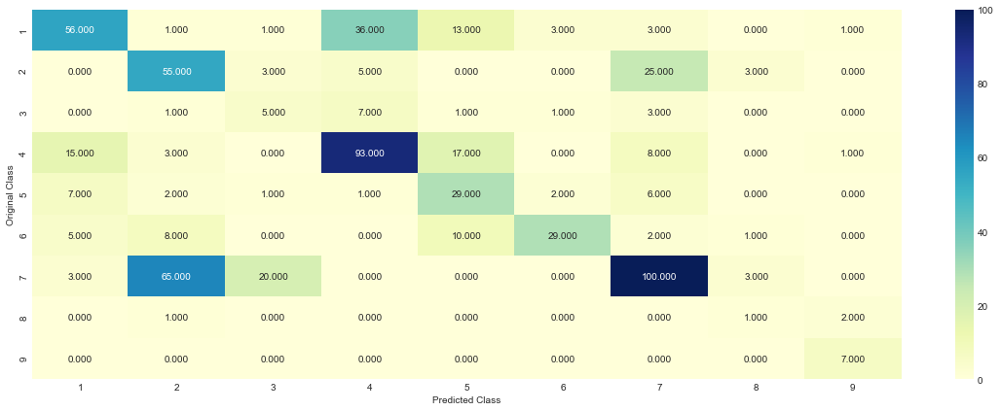



======================================== Precision matrix (Columm Sum=1)  ====================


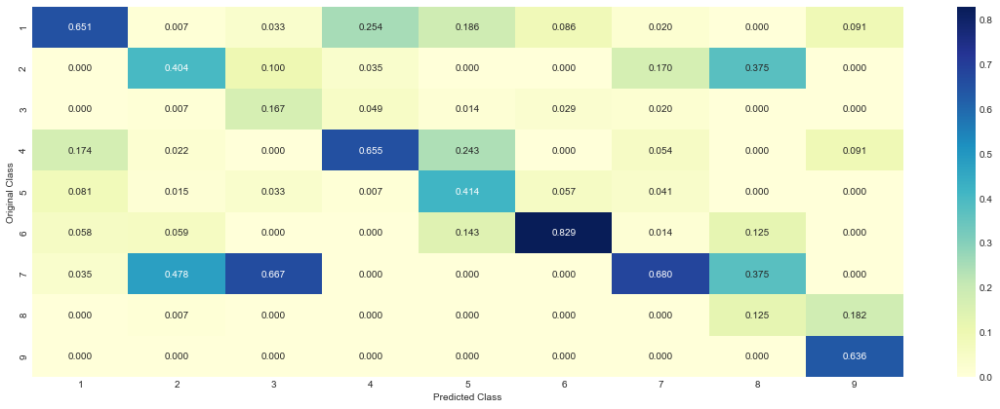



======================================== Recall matrix (Row sum=1)  ====================


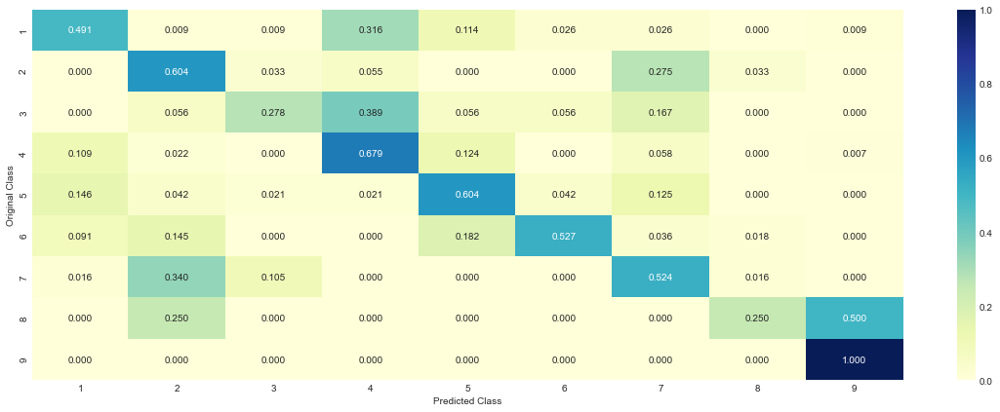

--------------------------------------------------------------------------------
Log_Loss : 1.263
Accuracy : 0.564
AUC score : 0.893
Precision : 0.608
Recall : 0.564
F1_score : 0.573
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.43609022556390975 %


Analyzing Random Forest Model using 'BOW 1-gram' Approach:-


for n_estimators = 100 and max depth =  2
Log Loss : 1.360768735524207
for n_estimators = 100 and max depth =  3
Log Loss : 1.3004989377443084
for n_estimators = 100 and max depth =  5
Log Loss : 1.217327920027264
for n_estimators = 100 and max depth =  10
Log Loss : 1.1485833871544875
for n_estimators = 200 and max depth =  2
Log Loss : 1.349029917549861
for n_estimators = 200 and max depth =  3
Log Loss : 1.2881173868008986
for n_estimators = 200 and max depth =  5
Log Loss : 1.2063526366075847
for n_estimators = 200 and max depth =  10
Log Loss : 1.137447849897372
for n_estimators = 500 and max depth = 

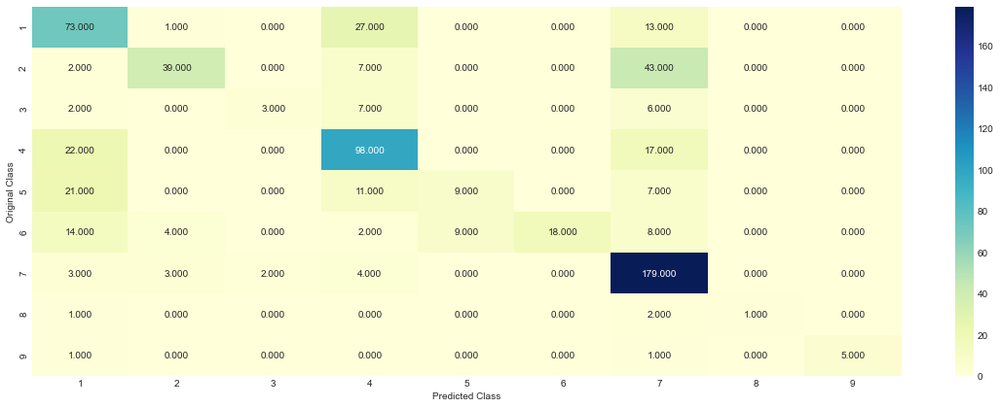



======================================== Precision matrix (Columm Sum=1)  ====================


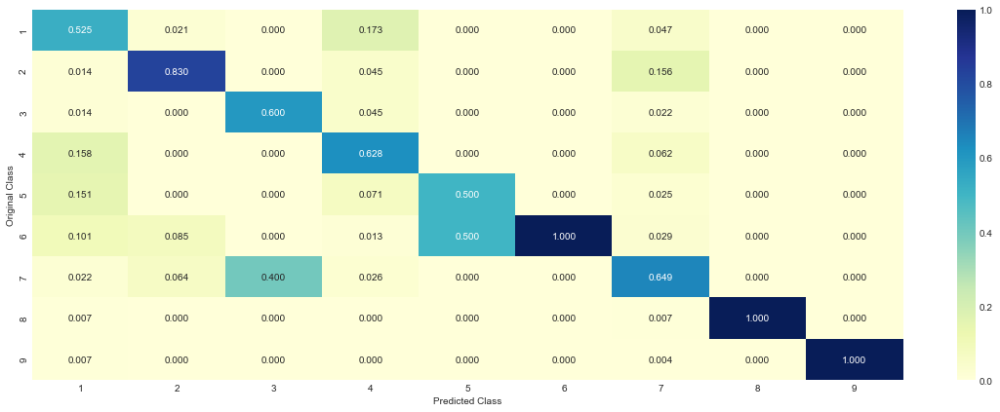



======================================== Recall matrix (Row sum=1)  ====================


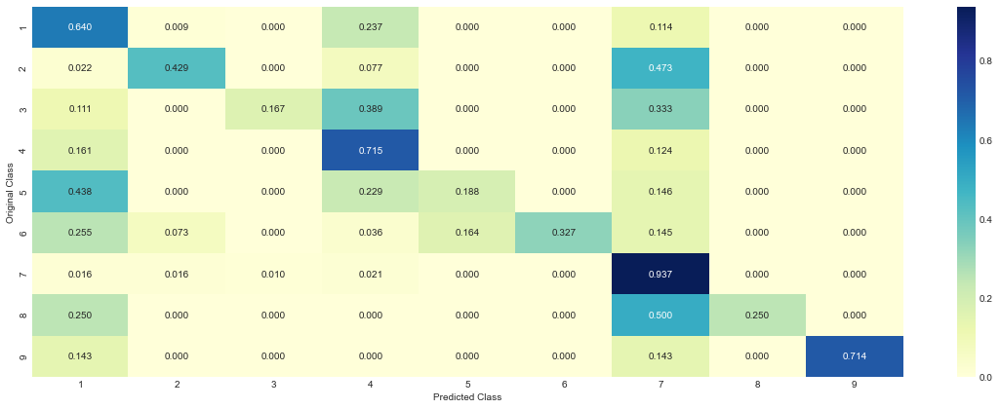

--------------------------------------------------------------------------------
Log_Loss : 1.124
Accuracy : 0.639
AUC score : 0.893
Precision : 0.671
Recall : 0.639
F1_score : 0.613
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3609022556390977 %


Analyzing Random Forest Model using 'TF-IDF 1-gram' Approach:-


for n_estimators = 100 and max depth =  2
Log Loss : 1.2866857847956148
for n_estimators = 100 and max depth =  3
Log Loss : 1.2284578122133742
for n_estimators = 100 and max depth =  5
Log Loss : 1.147594020434329
for n_estimators = 100 and max depth =  10
Log Loss : 1.0590158302478225
for n_estimators = 200 and max depth =  2
Log Loss : 1.2680259008239756
for n_estimators = 200 and max depth =  3
Log Loss : 1.2133228443887512
for n_estimators = 200 and max depth =  5
Log Loss : 1.1388575093770263
for n_estimators = 200 and max depth =  10
Log Loss : 1.0497643343333123
for n_estimators = 500 and max dep

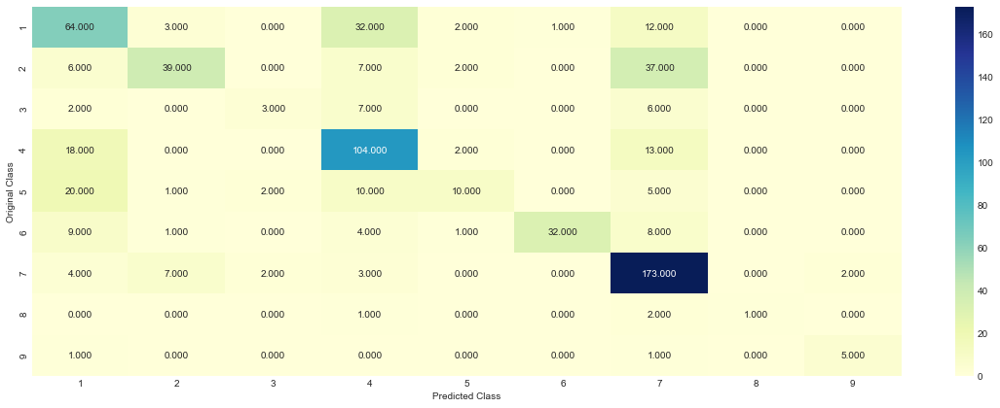



======================================== Precision matrix (Columm Sum=1)  ====================


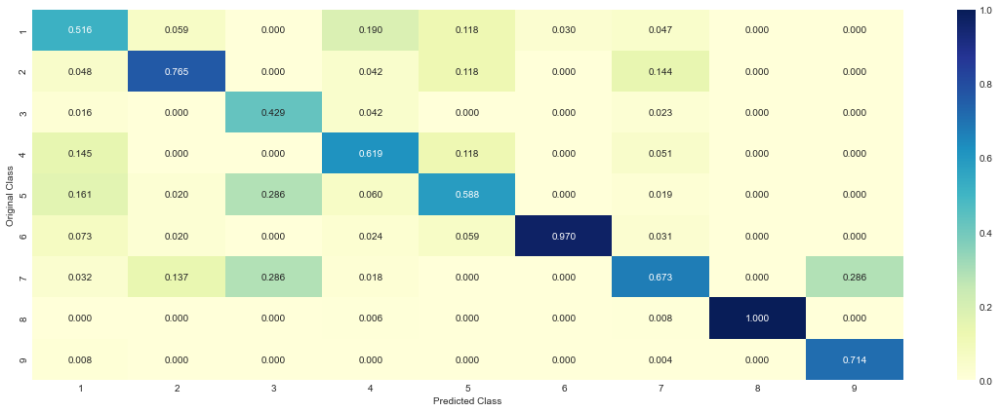



======================================== Recall matrix (Row sum=1)  ====================


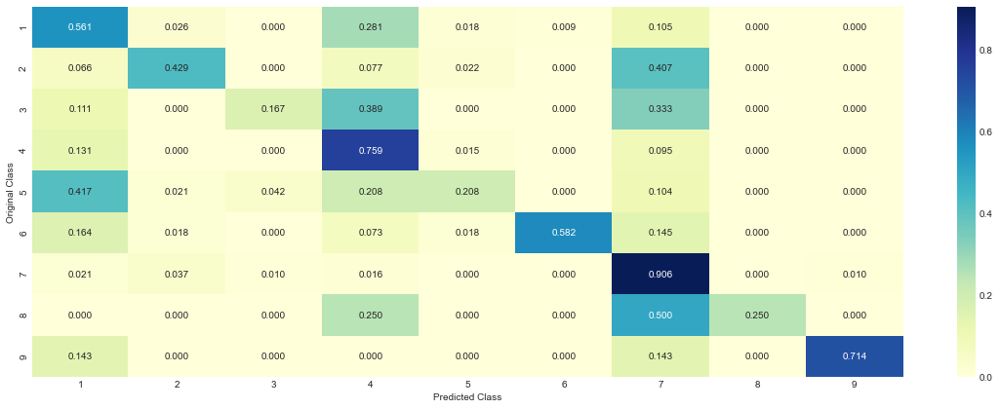

--------------------------------------------------------------------------------
Log_Loss : 1.064
Accuracy : 0.648
AUC score : 0.899
Precision : 0.662
Recall : 0.648
F1_score : 0.628
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3518796992481203 %


Analyzing Random Forest Model using 'TF-IDF 2-gram' Approach:-


for n_estimators = 100 and max depth =  2
Log Loss : 1.2827720536249732
for n_estimators = 100 and max depth =  3
Log Loss : 1.230209157194073
for n_estimators = 100 and max depth =  5
Log Loss : 1.1528808395935581
for n_estimators = 100 and max depth =  10
Log Loss : 1.0502722150291064
for n_estimators = 200 and max depth =  2
Log Loss : 1.2729568472625847
for n_estimators = 200 and max depth =  3
Log Loss : 1.220105321100871
for n_estimators = 200 and max depth =  5
Log Loss : 1.1405555933178195
for n_estimators = 200 and max depth =  10
Log Loss : 1.0484383540993838
for n_estimators = 500 and max dept

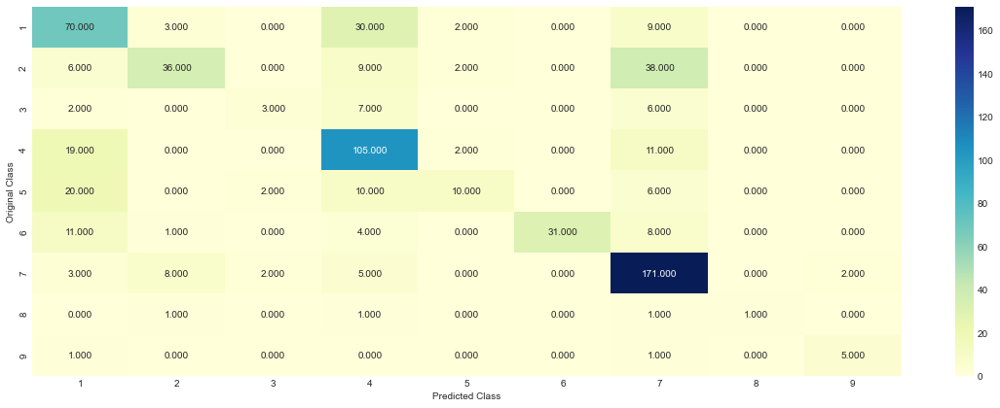



======================================== Precision matrix (Columm Sum=1)  ====================


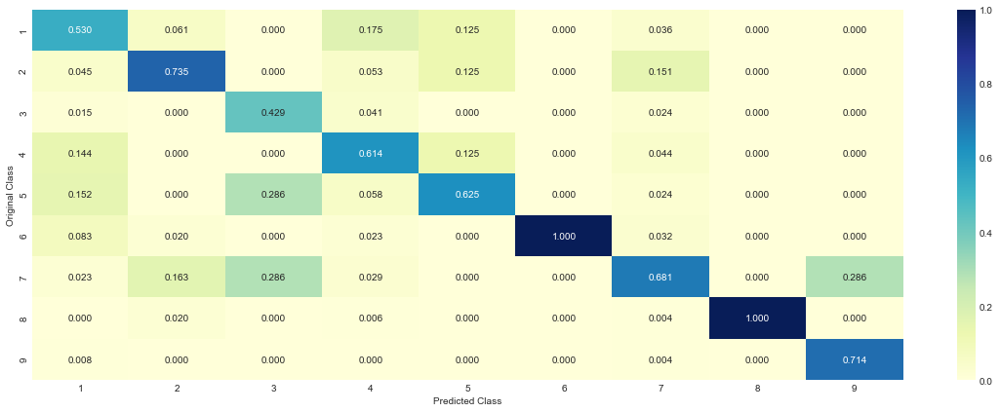



======================================== Recall matrix (Row sum=1)  ====================


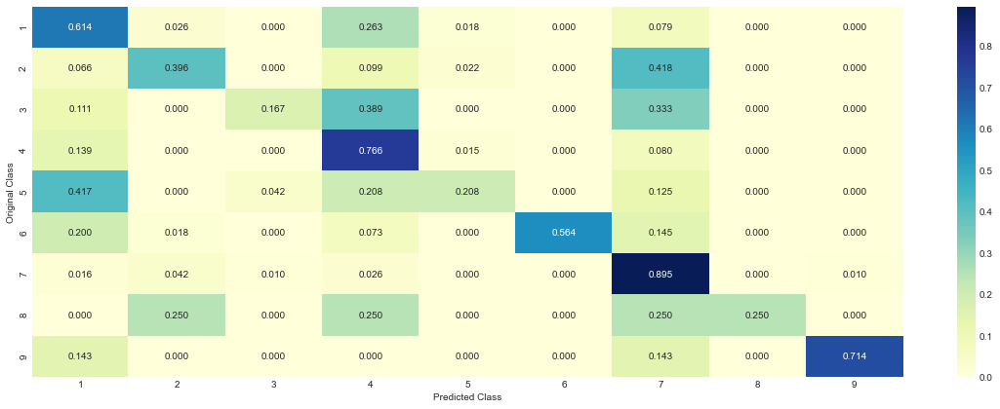

--------------------------------------------------------------------------------
Log_Loss : 1.070
Accuracy : 0.650
AUC score : 0.898
Precision : 0.667
Recall : 0.650
F1_score : 0.629
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.35037593984962406 %




In [162]:
# Fit and Evaluate Random Forest Model
model_nm = 'Random Forest'
for vectorization in ['Response Coding','BOW 1-gram','TF-IDF 1-gram','TF-IDF 2-gram']: 
    if vectorization == 'Response Coding':
        Result_final = Result_final.append(train_RF(train_x_responseCoding, train_y, cv_x_responseCoding, cv_y, test_x_responseCoding, test_y, model_nm, vectorization),ignore_index = True)
    elif vectorization == 'BOW 1-gram':
        Result_final = Result_final.append(train_RF(train_x_onehotCoding, train_y, cv_x_onehotCoding, cv_y, test_x_onehotCoding, test_y, model_nm, vectorization),ignore_index = True)
    elif vectorization == 'TF-IDF 1-gram':
        Result_final = Result_final.append(train_RF(train_x_tfidf_uni, train_y, cv_x_tfidf_uni, cv_y, test_x_tfidf_uni, test_y, model_nm, vectorization),ignore_index = True)
    else:
        Result_final = Result_final.append(train_RF(train_x_tfidf_bi, train_y, cv_x_tfidf_bi, cv_y, test_x_tfidf_bi, test_y, model_nm, vectorization),ignore_index = True)

## 7.7 Stacking Classifier 

- Stacking is an ensemble learning technique to combine multiple classification models via a meta-classifier.
- The individual classification models are trained based on the complete training set; then, the meta-classifier is fitted based on the outputs -- meta-features -- of the individual classification models in the ensemble. 

### 7.7.1 Stack classifier models
- We use 3 models for stacking - Logistic Regression, SVM and Multinomial Naive Bayes, trained using 'TF-IDF 1-gram' apporach.
- We set the hyper-parameters for these 3 models to the best values found using above analysis done so far.

In [166]:
def get_stacked_classifiers(train_x, train_y, cv_x, cv_y): 

    clf1 = SGDClassifier(alpha=0.0001, penalty='l2', loss='log', class_weight='balanced', random_state=0)
    clf1.fit(train_x, train_y)
    sig_clf1 = CalibratedClassifierCV(clf1, method="sigmoid")
    sig_clf1.fit(train_x, train_y)
    print("Logistic Regression Stacked Classifier :  Log Loss: %0.2f" % (log_loss(cv_y, sig_clf1.predict_proba(cv_x))))

    clf2 = SGDClassifier(alpha=0.0001, penalty='l2', loss='hinge', class_weight='balanced', random_state=0)
    clf2.fit(train_x, train_y)
    sig_clf2 = CalibratedClassifierCV(clf2, method="sigmoid")
    sig_clf2.fit(train_x, train_y)
    print("Support vector machines Stacked Classifier: Log Loss: %0.2f" % (log_loss(cv_y, sig_clf2.predict_proba(cv_x))))

    clf3 = MultinomialNB(alpha=0.001)
    clf3.fit(train_x, train_y)
    sig_clf3 = CalibratedClassifierCV(clf3, method="sigmoid")
    sig_clf3.fit(train_x, train_y)
    print("Naive Bayes Stacked Classifier: Log Loss: %0.2f" % (log_loss(cv_y, sig_clf3.predict_proba(cv_x))))

    print("--"*50)

    return sig_clf1, sig_clf2, sig_clf3

### 7.7.2 Fit and evaluate the Stacking Classifier model

In [167]:
def train_StackingClassifier(stacked_clf_list, train_x, train_y, cv_x, cv_y, test_x, test_y, model_nm, vectorization):
    
    print("Analyzing {} Model using {} Approach:-".format(model_nm, vectorization))
    print("\n")

    # hyper parameter tuning for meta classifer
    alpha = [0.0001,0.001,0.01,0.1,1,10] 
    cv_log_error_array = []
    for i in alpha:
        lr = LogisticRegression(C=i)
        sclf = StackingClassifier(classifiers=stacked_clf_list, meta_classifier=lr, use_probas=True)
        sclf.fit(train_x, train_y)

        sig_clf_probs = sclf.predict_proba(cv_x)

        print("Stacking Classifer : for the value of alpha: %f Log Loss: %0.3f" % (i, log_loss(cv_y, sig_clf_probs)))
        cv_log_error_array.append(log_loss(cv_y, sig_clf_probs))

    print("--"*40)

    best_alpha = np.argmin(cv_log_error_array)
    print('Value of best alpha :', alpha[best_alpha])
    print("--"*40)

    # fit and evaluate the stacking classifier using best hyper parameter for meta-classifier
    start_time = time.clock()

    lr = LogisticRegression(C= alpha[best_alpha])
    sclf = StackingClassifier(classifiers=stacked_clf_list, meta_classifier=lr, use_probas=True)
    sclf.fit(train_x, train_y)

    # predict the log_loss using best alpha
    predict_y_test = sclf.predict(test_x)
    predict_probs_y_test = sclf.predict_proba(test_x)

    # compute execution time
    run_time_stck = time.clock() - start_time
    print("Execution time :", run_time_stck)
    print("--"*40)

    print("For best C = ", alpha[best_alpha],"The train Log loss on the stacking classifier :",log_loss(train_y, sclf.predict_proba(train_x)))

    print("For best C = ", alpha[best_alpha],"The CV Log loss on the stacking classifier :",log_loss(cv_y, sclf.predict_proba(cv_x)))

    print("For best C = ", alpha[best_alpha], "The test Log loss on the stacking classifier :", log_loss(test_y, predict_probs_y_test))
    print("--"*40)

    # plot the confusion matrix, precision matrix and recall matrix.
    Cls_Mod.plot_confusion_matrix(test_y, predict_y_test, class_labels)
    print("--"*40)

    # complete model evaluation
    accuracy_stck, precision_stck, recall_stck, f1_stck, Lg_Loss_stck, auc_score_stck = Cls_Mod.get_model_eval_metrics(test_y, predict_y_test, predict_probs_y_test, 'weighted')
    print("--"*40)

    # number of miss-classified points
    misclassified_stck = np.count_nonzero(predict_y_test - test_y)/test_y.shape[0]
    print("Percentage of misclassified points :", misclassified_stck, "%")
    print("=="*40)
    print("\n")

    # Save the results of the model
    Result_stck = pd.DataFrame([{'Model': model_nm,
                                  'Text_Preprocessing' : vectorization,
                                  'Log_Loss' : Lg_Loss_stck,
                                  'Accuracy': accuracy_stck,
                                  'AUC' : auc_score_stck,
                                  'Precision': precision_stck, 
                                  'Recall': recall_stck,
                                  'F1-score': f1_stck,
                                  'Execution_Time' : run_time_stck,
                                  'Percentage_Missclassified' : misclassified_stck}])
    return Result_stck

Logistic Regression Stacked Classifier :  Log Loss: 0.89
Support vector machines Stacked Classifier: Log Loss: 0.94
Naive Bayes Stacked Classifier: Log Loss: 1.12
----------------------------------------------------------------------------------------------------
Analyzing Stacking Classifier Model using TF-IDF 1-gram Approach:-


Stacking Classifer : for the value of alpha: 0.000100 Log Loss: 1.807
Stacking Classifer : for the value of alpha: 0.001000 Log Loss: 1.637
Stacking Classifer : for the value of alpha: 0.010000 Log Loss: 1.159
Stacking Classifer : for the value of alpha: 0.100000 Log Loss: 1.002
Stacking Classifer : for the value of alpha: 1.000000 Log Loss: 1.168
Stacking Classifer : for the value of alpha: 10.000000 Log Loss: 1.465
--------------------------------------------------------------------------------
Value of best alpha : 0.1
--------------------------------------------------------------------------------
Execution time : 15.396493000000191
----------------------

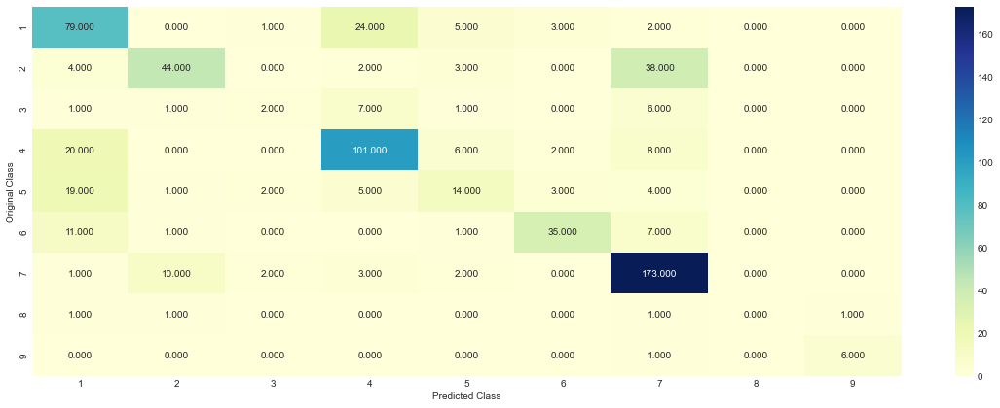



======================================== Precision matrix (Columm Sum=1)  ====================


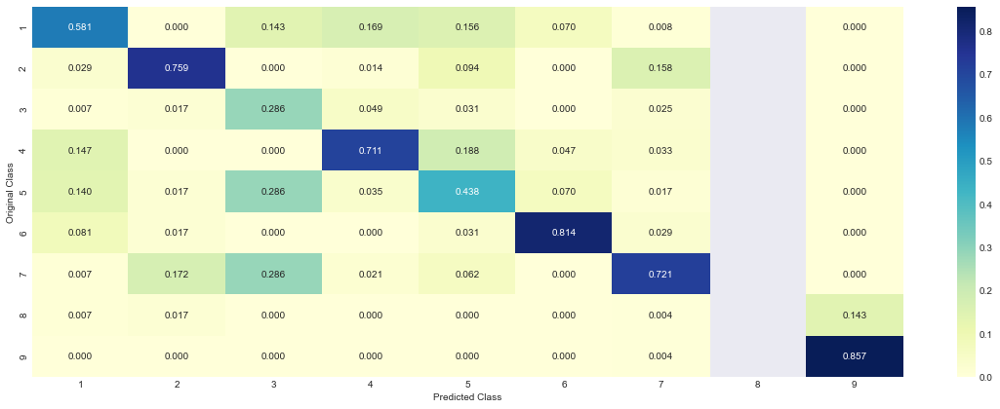



======================================== Recall matrix (Row sum=1)  ====================


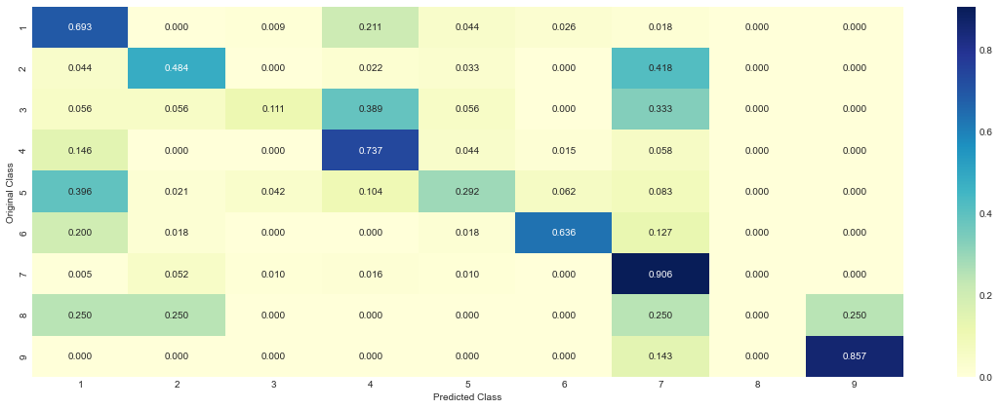

--------------------------------------------------------------------------------
Log_Loss : 1.024
Accuracy : 0.683
AUC score : 0.900
Precision : 0.673
Recall : 0.683
F1_score : 0.667
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3172932330827068 %




In [169]:
# Fit and Evaluate Stacking Classifier Model
model_nm = 'Stacking Classifier'
vectorization = 'TF-IDF 1-gram'
clf1, clf2, clf3 = get_stacked_classifiers(train_x_tfidf_uni, train_y, cv_x_tfidf_uni, cv_y)
stacked_clf_list = [clf1, clf2, clf3]
Result_final = Result_final.append(train_StackingClassifier(stacked_clf_list, train_x_tfidf_uni, train_y, 
                                                            cv_x_tfidf_uni, cv_y, test_x_tfidf_uni, test_y, 
                                                            model_nm, vectorization),ignore_index = True)

## 7.8 Maximum Voting classifier

- A Voting Classifier is a machine learning model that trains on an ensemble of numerous models and predicts an output (class) based on their highest probability of chosen class as the output.
- It simply aggregates the findings of each classifier passed into Voting Classifier and predicts the output class based on the highest majority of voting. 
- The idea is instead of creating separate dedicated models and finding the accuracy for each them, we create a single model which trains by these models and predicts output based on their combined majority of voting for each output class.

- Voting Classifier supports two types of votings:-

    **1. Hard Voting:** In hard voting, the predicted output class is a class with the highest majority of votes i.e the class which had the highest probability of being predicted by each of the classifiers. For ex :- Suppose three classifiers predicted the output class(A, A, B), so here the majority predicted A as output. Hence A will be the final prediction.
    
    **2. Soft Voting:** In soft voting, the output class is the prediction based on the average of probability given to that class. For ex :- Suppose given some input to three models, the prediction probability for class A = (0.30, 0.47, 0.53) and B = (0.20, 0.32, 0.40). So the average for class A is 0.4333 and B is 0.3067, the winner is clearly class A because it had the highest probability averaged by each classifier.

In [191]:
#Refer:http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.VotingClassifier.html


def train_MaxVotingClassifier(clf1, clf2, clf3, train_x, train_y, cv_x, cv_y, test_x, test_y, model_nm, vectorization):
    
    print("Analyzing {} Model using {} Approach:-".format(model_nm, vectorization))
    print("\n")
    print("--"*40)

    start_time = time.clock()

    vclf = VotingClassifier(estimators=[('lr', clf1), ('svc', clf2), ('rf', clf3)], voting='soft')
    vclf.fit(train_x, train_y)

    vclf.predict(test_x)
    vclf.predict_proba(test_x)

    # compute execution time
    run_time_vclf = time.clock() - start_time
    print("Execution time :", run_time_vclf)
    print("--"*40)

    print("Log loss (train) on the VotingClassifier :", log_loss(train_y, vclf.predict_proba(train_x)))
    print("Log loss (CV) on the VotingClassifier :", log_loss(cv_y, vclf.predict_proba(cv_x)))
    print("Log loss (test) on the VotingClassifier :", log_loss(test_y, vclf.predict_proba(test_x)))
    print("--"*40)

    # plot the confusion matrix, precision matrix and recall matrix.
    Cls_Mod.plot_confusion_matrix(test_y, vclf.predict(test_x), class_labels)
    print("--"*40)

    # complete model evaluation
    accuracy_vclf, precision_vclf, recall_vclf, f1_vclf, Lg_Loss_vclf, auc_score_vclf = Cls_Mod.get_model_eval_metrics(test_y, vclf.predict(test_x), vclf.predict_proba(test_x), 'weighted')
    print("--"*40)

    # number of miss-classified points
    misclassified_vclf = np.count_nonzero((vclf.predict(test_x)- test_y))/test_y.shape[0]
    print("Percentage of misclassified points :", misclassified_vclf, "%")
    print("=="*40)
    print("\n")

    # Save the results of the model
    Result_vclf = pd.DataFrame([{'Model': model_nm,
                                  'Text_Preprocessing' : vectorization,
                                  'Log_Loss' : Lg_Loss_vclf,
                                  'Accuracy': accuracy_vclf,
                                  'AUC' : auc_score_vclf,
                                  'Precision': precision_vclf, 
                                  'Recall': recall_vclf,
                                  'F1-score': f1_vclf,
                                  'Execution_Time' : run_time_vclf,
                                  'Percentage_Missclassified' : misclassified_vclf}])
    return Result_vclf

Logistic Regression Stacked Classifier :  Log Loss: 0.89
Support vector machines Stacked Classifier: Log Loss: 0.94
Naive Bayes Stacked Classifier: Log Loss: 1.12
----------------------------------------------------------------------------------------------------
Analyzing Max Voting Classifier Model using TF-IDF 1-gram Approach:-


--------------------------------------------------------------------------------
Execution time : 14.345249899997725
--------------------------------------------------------------------------------
Log loss (train) on the VotingClassifier : 0.41460221216591253
Log loss (CV) on the VotingClassifier : 0.9436165028983861
Log loss (test) on the VotingClassifier : 0.9706383441900545
--------------------------------------------------------------------------------
======================================== Confusion matrix  ========================================


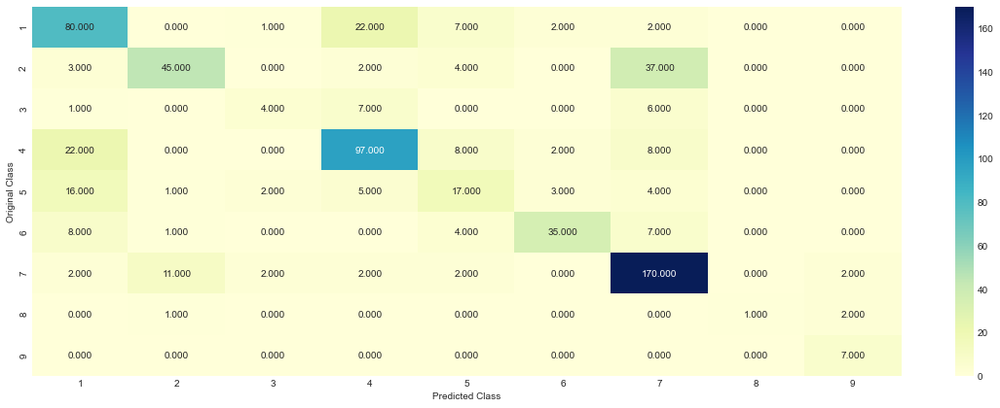



======================================== Precision matrix (Columm Sum=1)  ====================


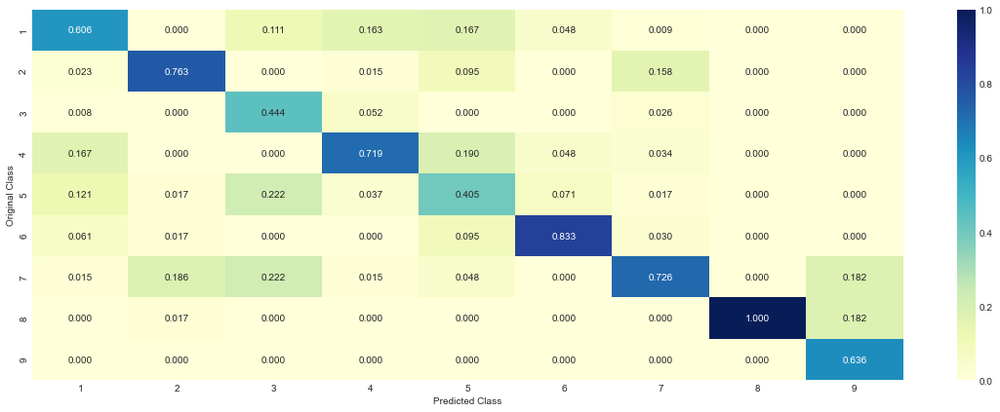



======================================== Recall matrix (Row sum=1)  ====================


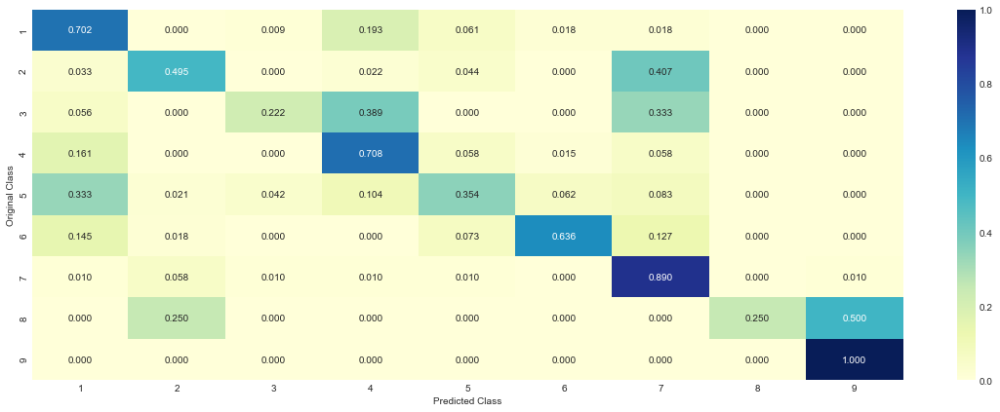

--------------------------------------------------------------------------------
Log_Loss : 0.971
Accuracy : 0.686
AUC score : 0.923
Precision : 0.688
Recall : 0.686
F1_score : 0.676
--------------------------------------------------------------------------------
Percentage of misclassified points : 0.3142857142857143 %




In [192]:
# Fit and Evaluate Maximum Voting Classifier Model
model_nm = 'Max Voting Classifier'
vectorization = 'TF-IDF 1-gram'
clf1, clf2, clf3 = get_stacked_classifiers(train_x_tfidf_uni, train_y, cv_x_tfidf_uni, cv_y)

Result_final = Result_final.append(train_MaxVotingClassifier(clf1, clf2, clf3, train_x_tfidf_uni, train_y, 
                                                             cv_x_tfidf_uni, cv_y, test_x_tfidf_uni, test_y, 
                                                             model_nm, vectorization), ignore_index = True)  

In [ ]:
#Result_final.drop([25], inplace= True)
#Result_final.reset_index(drop=True, inplace = True)

# 8. Summarizing Modelling Results  - Selecting the Best Model

- In this step, we will analyze the results produced by all the different models and finalize the best model for further analysis and improvement.

In [194]:
Result_final

,Model,Text_Preprocessing,Log_Loss,Accuracy,AUC,Precision,Recall,F1-score,Execution_Time,Percentage_Missclassified
0,Random Model,--,2.473,0.107,0.498,0.177,0.107,0.126,0.028340,0.893233
1,Naive Bayes,Response Coding,1.232,0.561,0.856,0.430,0.561,0.471,0.294061,0.439098
2,Naive Bayes,BOW 1-gram,1.248,0.615,0.843,0.631,0.615,0.615,0.789248,0.384962
3,Naive Bayes,TF-IDF 1-gram,1.163,0.645,0.868,0.657,0.645,0.645,0.700115,0.354887
4,Naive Bayes,TF-IDF 2-gram,1.203,0.635,0.855,0.644,0.635,0.632,1.709566,0.365414
5,K-Nearest Neighbours,Response Coding,1.031,0.653,0.903,0.650,0.653,0.643,0.594935,0.347368
6,K-Nearest Neighbours,BOW 1-gram,1.234,0.574,0.865,0.595,0.574,0.558,16.591458,0.425564
7,K-Nearest Neighbours,TF-IDF 1-gram,1.075,0.647,0.892,0.634,0.647,0.629,16.216919,0.353383
8,Logistic Regression Balanced Classes,Response Coding,1.036,0.656,0.898,0.640,0.656,0.640,1.140450,0.344361
9,Logistic Regression Balanced Classes,BOW 1-gram,1.029,0.647,0.901,0.644,0.647,0.635,12.057947,0.353383


#### Inferences:

As can be seen in the result table, I have compared 7 different statistical models with the 'random model' and recorded their results for comapring the overall performance. All the statistical classifiers are tuned to select the best hyper parameters and final results are generated using the best model for each of the clasifiers.
Below are some of the observations that can be made to summarize these results:-

1. We can observe that the linear models like Logistic Regression and SVM have outperformed compared to other models while calculating our baseline metric i.e. - **'log_loss'**.
2. The **Log-Loss is lowest overall for Logistic Regression model (with balanced weights)**.
3. Logistic Regression model also has the highest oveall accuracy percentage followd by SVM.
4. Clearly, the **execution time** is the least overall for **Naive Bayes** with  **response coded features**.
5. Ensembling  models like 'Stacking' and 'Voting' have performed reasonably well in terms of Log_loss and AUC.
6. The **Logistic Regression with balanced class weights** model trained using **TF-IDF 1-gram** features has **best overall score in terms of Log_loss and AUC with balanced Precision, Recall and F1-score**. Thus the overall best approach seems to be **Logistic Regression**.
7. The **linear SVM** is only second to Logistic Regression in terms of overall performance.

Thus we can say that the combination of the correct algorithm with optimal hyperparameters and right featurization technique makes a lot of difference while calculating the results. 

So in the next steps we wil try to intrpret the results produced by these models.

# 9. Interpreting Model Results using LIME

- In this part, we will analyze the results produced by models like Naive Bayes, Logistic Regression(Balanced class weights), SVM and Random Forest and try to understand their results interpretability using LIME explainer.
- Here we will use the TF-IDF 1-gram vectorization on text data for analyzing the model interpretability.

In [82]:
# create TF-IDF vectorizer 
vectorizer = TfidfVectorizer(stop_words= STOP_WORDS, ngram_range=(1,1), lowercase=True, analyzer='word', 
                             token_pattern=r'[\w]+', min_df = 3, max_features = 60000)

In [83]:
# Defining the train data for analysis
X_train = vectorizer.fit_transform(train_df["CLEAN_TEXT"])
y_train = train_df['Class'].values

In [84]:
class_names = list(np.unique(y_train))
class_names

[1, 2, 3, 4, 5, 6, 7, 8, 9]

In [85]:
# Defining the test data for analysis
X_test = test_df["CLEAN_TEXT"].values
y_test = test_df['Class'].values

#### 9.1 Intepreting Predictions for Naive Bayes model

In [86]:
#Create Callibrated NB model
mnb = MultinomialNB(alpha= 0.001)
mnb.fit(X_train, y_train)
clf_mnb = CalibratedClassifierCV(mnb, method="sigmoid",n_jobs=42)

In [87]:
## pipeline with tf-idf vectorizer and naive bayes model
model_mnb = pipeline.Pipeline([("vectorizer", vectorizer), 
                               ("classifier", clf_mnb)])

In [88]:
## train the classifier
model_mnb["classifier"].fit(X_train, y_train)

## test on the trained classifer
predicted_mnb = model_mnb.predict(X_test)
predicted_prob_mnb = model_mnb.predict_proba(X_test)

In [89]:
## select one observation for correct prediction
i = 0
txt_instance_i = test_df["CLEAN_TEXT"].iloc[i]
print("Document id:", i)

## check true value and predicted value
print("True Class Label:", y_test[i])
print("Predicted Class Label:", predicted_mnb[i])
print("Probability for predicted class:", round(np.max(predicted_prob_mnb[i]),3))

predicted_prob_mnb[i].round(3)

Document id: 0
True Class Label: 4
Predicted Class Label: 4
Probability for predicted class: 0.713


array([0.071, 0.059, 0.013, 0.713, 0.035, 0.03 , 0.07 , 0.004, 0.004])

In [90]:
## create text explaner object
explainer_mnb = LimeTextExplainer(class_names = class_names, random_state = 42)

In [91]:
## get the explained text instance 
explained_mnb = explainer_mnb.explain_instance(txt_instance_i, model_mnb.predict_proba, labels = [3], num_features = 10)

In [92]:
## plot the LIME explainations
explained_mnb.show_in_notebook(text=txt_instance_i, predict_proba=True)

In [93]:
print('Explaination for predicted class - {}:-'.format(class_names[3]))
print('\n'.join(map(str, explained_mnb.as_list(label=3))))

Explaination for predicted class - 4:-
('p4', 3.4477333627766596e-05)
('ministry', 3.385355453795998e-05)
('y16c', 3.331574197878439e-05)
('r130q', 3.2766374236719506e-05)
('eliminated', 3.074080034796361e-05)
('ring', 2.085892409476696e-05)
('mutation', 1.9199220961447023e-05)
('activity', 1.9000151321279357e-05)
('follows', 1.749827141192213e-05)
('pten', -1.1438517752353123e-05)


#### Inference:- 

Result interpretation using LIME is illustrated above for the document identfied by index 0. For this document case, the actual and predicted class is 4. LIME explainer shows the prediction for class 4 for the 0th document instance. We can observe that the words "p4", "r130q" and "y16c" pointed the model in the right direction which are responsible for making the correct prediction even if the words like "follows" and "pten" are more not helping in the correct context.
We can see a list of explained words which are selected by model explainer for explaining the predicted result. Here 10 words are returned becuase we have set the parameter 'num_features' to 10 explicitly.

In [94]:
exp_mnb = explainer_mnb.explain_instance(txt_instance_i, model_mnb.predict_proba, num_features=10, top_labels=4)
print("Top predicted classes:", np.array(exp_mnb.available_labels()) + 1)
exp_mnb.show_in_notebook(text=False, predict_proba=True)

Top predicted classes: [4 1 7 2]


#### Inference:- 

In this case we have set the 'top_labels' parameter to 4 which returned the top 4 classes based on the their prediction probability. Again we can see class 4 dominates the predicted results.

In [95]:
## select one observation for incorrect prediction
i = 1
txt_instance = test_df["CLEAN_TEXT"].iloc[i]
print("Document id:", i)

## check true value and predicted value
print("True Class Label:", y_test[i])
print("Predicted Class Label:", predicted_mnb[i])
print("Probability for predicted class:", round(np.max(predicted_prob_mnb[i]),3))

predicted_prob_mnb[i].round(3)

Document id: 1
True Class Label: 8
Predicted Class Label: 2
Probability for predicted class: 0.589


array([0.133, 0.589, 0.016, 0.087, 0.043, 0.037, 0.085, 0.005, 0.005])

In [96]:
exp_mnb2 = explainer_mnb.explain_instance(txt_instance, model_mnb.predict_proba, num_features=10, top_labels=2)
print("Top predicted classes:", np.array(exp_mnb2.available_labels()) + 1)
exp_mnb2.show_in_notebook(text=txt_instance, predict_proba=True)

Top predicted classes: [2 1]


#### Inference:-

In this context we have the 'True' Class Label as '8' and 'Predicted' Class Label is '2'. This is because we can see important words are more contributing towards making the correct prediction for class '8' as compared to class '2'.

Similarly, below we will see the explaination for predictions made by Logistic Regression, SVM and Random Forest model.

#### 9.2 Intepreting Predictions for Logistic Regression model

In [113]:
#LOR
lr = SGDClassifier(class_weight= 'balanced', alpha= 0.0001, penalty='l2', loss='log', random_state=42)
lr.fit(X_train, y_train)
lr_clf = CalibratedClassifierCV(lr, method="sigmoid")

In [98]:
## pipeline with tf-idf vectorizer and logistic regression model
model_lr = pipeline.Pipeline([("vectorizer", vectorizer), 
                               ("classifier", lr_clf)])

In [99]:
## train the classifier
model_lr["classifier"].fit(X_train, y_train)

## test on the trained classifer
predicted_lr = model_lr.predict(X_test)
predicted_prob_lr = model_lr.predict_proba(X_test)

In [101]:
## create text explainer object
explainer_lr = LimeTextExplainer(class_names = class_names, random_state = 42)

In [105]:
## select one observation for incorrect prediction
i = 110
txt_instance_i = test_df["CLEAN_TEXT"].iloc[i]
print("Document id:", i)

## check true value and predicted value
print("True Class Label:", y_test[i])
print("Predicted Class Label:", predicted_lr[i])
print("Probability for predicted class:", round(np.max(predicted_prob_lr[i]),3))

predicted_prob_lr[i].round(3)

Document id: 110
True Class Label: 3
Predicted Class Label: 7
Probability for predicted class: 0.562


array([0.026, 0.1  , 0.257, 0.019, 0.017, 0.013, 0.562, 0.003, 0.003])

In [106]:
exp_lr = explainer_lr.explain_instance(txt_instance_i, model_lr.predict_proba, num_features=10, top_labels=3)
print("Top predicted classes:", np.array(exp_lr.available_labels()) + 1)
exp_lr.show_in_notebook(text=txt_instance_i, predict_proba=True)

Top predicted classes: [7 3 2]


#### Inference:-

In this context we have the 'True' Class Label as '3' and 'Predicted' Class Label is '7'. This is because although few of the words responsible for making the prediction are same. But the words are more contributing towards making the correct prediction for class '7' as compared to class '3'.

#### 9.3 Intepreting Predictions for SVM model

In [107]:
#SVM
svm = SGDClassifier(class_weight= 'balanced', alpha= 0.0001, penalty='l2', loss='hinge', random_state=42)
svm.fit(X_train, y_train)
clf_svm = CalibratedClassifierCV(svm, method="sigmoid")

In [108]:
## pipeline with tf-idf vectorizer and svm model
model_svm = pipeline.Pipeline([("vectorizer", vectorizer), 
                               ("classifier", clf_svm)])

In [109]:
## train the classifier
model_svm["classifier"].fit(X_train, y_train)

## test on the trained classifer
predicted_svm = model_svm.predict(X_test)
predicted_prob_svm = model_svm.predict_proba(X_test)

In [110]:
## select one observation for correct prediction
i = 110
txt_instance_i = test_df["CLEAN_TEXT"].iloc[i]
print("Document id:", i)

## check true value and predicted value
print("True Class Label:", y_test[i])
print("Predicted Class Label:", predicted_svm[i])
print("Probability for predicted class:", round(np.max(predicted_prob_svm[i]),3))

predicted_prob_svm[i].round(3)

Document id: 110
True Class Label: 3
Predicted Class Label: 3
Probability for predicted class: 0.315


array([0.105, 0.101, 0.315, 0.053, 0.053, 0.053, 0.313, 0.004, 0.005])

In [111]:
explainer_svm = LimeTextExplainer(class_names = class_names, random_state = 42)

In [112]:
exp_svm = explainer_svm.explain_instance(txt_instance_i, model_svm.predict_proba, num_features=10, top_labels=2)
print("Top predicted classes:", np.array(exp_svm.available_labels()) + 1)
exp_svm.show_in_notebook(text=txt_instance_i, predict_proba=True)

Top predicted classes: [3 7]


#### 9.4 Intepreting Predictions for Random Forest model

In [72]:
#RF
rf = RandomForestClassifier(n_estimators= 2000, criterion='gini', max_depth= 10, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)
clf_rf = CalibratedClassifierCV(rf, method="sigmoid")

In [73]:
## pipeline with tf-idf vectorizer and random forest model
model_rf = pipeline.Pipeline([("vectorizer", vectorizer), 
                               ("classifier", clf_rf)])

In [74]:
## train the classifier
model_rf["classifier"].fit(X_train, y_train)

## test on the trained classifer
predicted_rf = model_rf.predict(X_test)
predicted_prob_rf = model_rf.predict_proba(X_test)

In [114]:
## select one observation for correct prediction
i = 4
txt_instance_4 = test_df["CLEAN_TEXT"].iloc[i]
print("Document id:", i)

## check true value and predicted value
print("True Class Label:", y_test[i])
print("Predicted Class Label:", predicted_rf[i])
print("Probability for predicted class:", round(np.max(predicted_prob_rf[i]),3))

predicted_prob_rf[i].round(3)

Document id: 4
True Class Label: 7
Predicted Class Label: 7
Probability for predicted class: 0.712


array([0.052, 0.082, 0.019, 0.048, 0.044, 0.033, 0.712, 0.006, 0.005])

In [76]:
explainer_rf = LimeTextExplainer(class_names = class_names, random_state = 42)

In [115]:
exp_rf = explainer_rf.explain_instance(txt_instance_4, model_rf.predict_proba, num_features=8, top_labels=2)
print("Top predicted classes:", np.array(exp_rf.available_labels()) + 1)

Top predicted classes: [7 2]


In [116]:
exp_rf.show_in_notebook(text=txt_instance_4, predict_proba=True)

# 10. Conclusion

In this work I have made an attempt to build classifier models for predicting the class[1 to 9 classes] of genetic mutation based on the evidences available in relevant oncology-medical literature so as to automate the process of labeling the genetic mutations into the most relevant classes. 

I have managed to increase capability of the algorithm up to reduce the **log loss** to as low as **0.9 with AUC of 92%**.

Interpreting the class of genetic mutations using clinical literature to make a prediction about cancer is very much domain specific and requires specialist oncologist intervention in real-life diagnostics, but still this sort of classification provides a good ground for a oncologist or onco-patholigist to start with rather than going manually going through hundereds of test evidences.

I have tried to make a detailed analysis of metrics in order to understand better the specifics of how algorithms works with different classes for making the predictions. I have tried understand the localised interpretability of different models using the model-agnostic method like LIME. **LIME** gave useful insights about the important terminologies in a medical literature evidence that classifies a particular genetic_variation mutation combination into a certain class.

This work can be proceeded with more detailed text analysis using advanced static and/or dynamic embeddings to understand the medical literature even better. Some of these techniques I will use to improve the quality of the algorithms and improve the prediction accuracy, but this would be outside the limits of current work.